In [1]:
import pandas as pd 
import numpy as np
import warnings 
import matplotlib.pyplot as plt 
import seaborn as sns 
#import geopandas as gpd
import plotly.express as px
from prophet import Prophet
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.metrics import mean_absolute_error

warnings.filterwarnings("ignore")


#!pip install geopandas


In [2]:
df = pd.read_csv("Panel format.csv")
df.head()


,Country,Year,pop,Region,SubRegion,OPEC,EU,OECD,CIS,biogeo_ej,...,gasprod_ej,hydro_ej,nuclear_ej,oilcons_ej,primary_ej,primary_ej_pc,ren_power_ej,renewables_ej,solar_ej,wind_ej
0,Algeria,1965,12.381256,Africa,Northern Africa,1.0,0.0,0.0,0.0,NaN,...,NaN,0.004258,0.0,0.055459,0.089398,7.220393,NaN,NaN,NaN,NaN
1,Algeria,1966,12.613389,Africa,Northern Africa,1.0,0.0,0.0,0.0,NaN,...,NaN,0.003779,0.0,0.072982,0.107397,8.514531,NaN,NaN,NaN,NaN
2,Algeria,1967,12.897116,Africa,Northern Africa,1.0,0.0,0.0,0.0,NaN,...,NaN,0.004365,0.0,0.068191,0.101691,7.884760,NaN,NaN,NaN,NaN
3,Algeria,1968,13.190975,Africa,Northern Africa,1.0,0.0,0.0,0.0,NaN,...,NaN,0.005993,0.0,0.072602,0.109242,8.281568,NaN,NaN,NaN,NaN
4,Algeria,1969,13.491016,Africa,Northern Africa,1.0,0.0,0.0,0.0,NaN,...,NaN,0.003843,0.0,0.076701,0.120741,8.949740,NaN,NaN,NaN,NaN


In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7211 entries, 0 to 7210
Data columns (total 24 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Country             7211 non-null   object 
 1   Year                7211 non-null   int64  
 2   pop                 5751 non-null   float64
 3   Region              5437 non-null   object 
 4   SubRegion           5437 non-null   object 
 5   OPEC                5437 non-null   float64
 6   EU                  5437 non-null   float64
 7   OECD                5437 non-null   float64
 8   CIS                 5437 non-null   float64
 9   biogeo_ej           4954 non-null   float64
 10  co2_combust_per_ej  5751 non-null   float64
 11  coalcons_ej         5458 non-null   float64
 12  coalprod_ej         2184 non-null   float64
 13  gascons_ej          5196 non-null   float64
 14  gasprod_ej          3528 non-null   float64
 15  hydro_ej            5517 non-null   float64
 16  nuclea

In [4]:
df.describe()

,Year,pop,OPEC,EU,OECD,CIS,biogeo_ej,co2_combust_per_ej,coalcons_ej,coalprod_ej,...,gasprod_ej,hydro_ej,nuclear_ej,oilcons_ej,primary_ej,primary_ej_pc,ren_power_ej,renewables_ej,solar_ej,wind_ej
count,7211.000000,5751.000000,5437.000000,5437.000000,5437.000000,5437.000000,4954.000000,5751.000000,5458.000000,2184.000000,...,3528.000000,5517.000000,4238.000000,5751.000000,5751.000000,5751.000000,4997.000000,5033.000000,4671.000000,4747.000000
mean,1995.110942,237.511008,0.133713,0.257127,0.379069,0.047453,0.121313,59.947367,4.555660,9.363948,...,5.109007,1.103890,1.012926,6.020759,15.728899,119.956059,0.295008,0.344693,0.053114,0.131678
std,16.492596,815.339651,0.340375,0.437090,0.485200,0.212625,0.507015,13.286076,16.379319,24.001289,...,14.120015,3.586367,3.349034,19.072865,52.045493,125.809405,1.687950,1.914750,0.435710,0.844094
min,1965.000000,0.064842,0.000000,0.000000,0.000000,0.000000,0.000000,8.704774,0.000000,0.001223,...,0.000000,0.000000,0.000000,0.000351,0.000351,0.590376,0.000000,0.000000,0.000000,0.000000
25%,1981.000000,8.109583,0.000000,0.000000,0.000000,0.000000,0.000000,53.379712,0.020286,0.103707,...,0.151848,0.015712,0.000000,0.267769,0.592785,31.605563,0.000011,0.000011,0.000000,0.000000
50%,1996.000000,25.009597,0.000000,0.000000,0.000000,0.000000,0.002816,60.402557,0.147785,0.637168,...,0.595546,0.094998,0.000000,0.626766,1.464104,87.493258,0.004643,0.004930,0.000000,0.000010
75%,2009.000000,91.419441,0.000000,1.000000,1.000000,0.000000,0.033892,68.075336,1.000852,5.820821,...,2.377887,0.422159,0.244937,2.404973,5.064889,163.463144,0.050494,0.063720,0.000425,0.003987
max,2022.000000,7974.899282,1.000000,1.000000,1.000000,1.000000,8.689707,93.146438,161.489239,174.564004,...,145.923149,41.212897,27.553399,192.646236,604.035654,1142.816410,40.858723,45.175867,12.413654,19.755361


In [5]:
df.shape

(7211, 24)

In [6]:
df.columns

Index(['Country', 'Year', 'pop', 'Region', 'SubRegion', 'OPEC', 'EU', 'OECD',
       'CIS', 'biogeo_ej', 'co2_combust_per_ej', 'coalcons_ej', 'coalprod_ej',
       'gascons_ej', 'gasprod_ej', 'hydro_ej', 'nuclear_ej', 'oilcons_ej',
       'primary_ej', 'primary_ej_pc', 'ren_power_ej', 'renewables_ej',
       'solar_ej', 'wind_ej'],
      dtype='object')

In [7]:
df["Region"].replace(to_replace = ["S. & Cent. America","CIS"], value = ["South and Central America","Com_wealth_Ind_St"], inplace = True)

In [8]:
df.isna().sum()

Country                  0
Year                     0
pop                   1460
Region                1774
SubRegion             1774
OPEC                  1774
EU                    1774
OECD                  1774
CIS                   1774
biogeo_ej             2257
co2_combust_per_ej    1460
coalcons_ej           1753
coalprod_ej           5027
gascons_ej            2015
gasprod_ej            3683
hydro_ej              1694
nuclear_ej            2973
oilcons_ej            1460
primary_ej            1460
primary_ej_pc         1460
ren_power_ej          2214
renewables_ej         2178
solar_ej              2540
wind_ej               2464
dtype: int64

In [9]:
df.Region.unique()

array(['Africa', 'South and Central America', 'Asia Pacific', 'Europe',
       'Com_wealth_Ind_St', 'Middle East', 'North America', nan],
      dtype=object)

In [10]:
df.duplicated().sum()

0

In [11]:
df = df.dropna(subset=['Region'])

In [12]:
df["Region"].isna().sum()

0

In [13]:
df.Region.unique()

array(['Africa', 'South and Central America', 'Asia Pacific', 'Europe',
       'Com_wealth_Ind_St', 'Middle East', 'North America'], dtype=object)

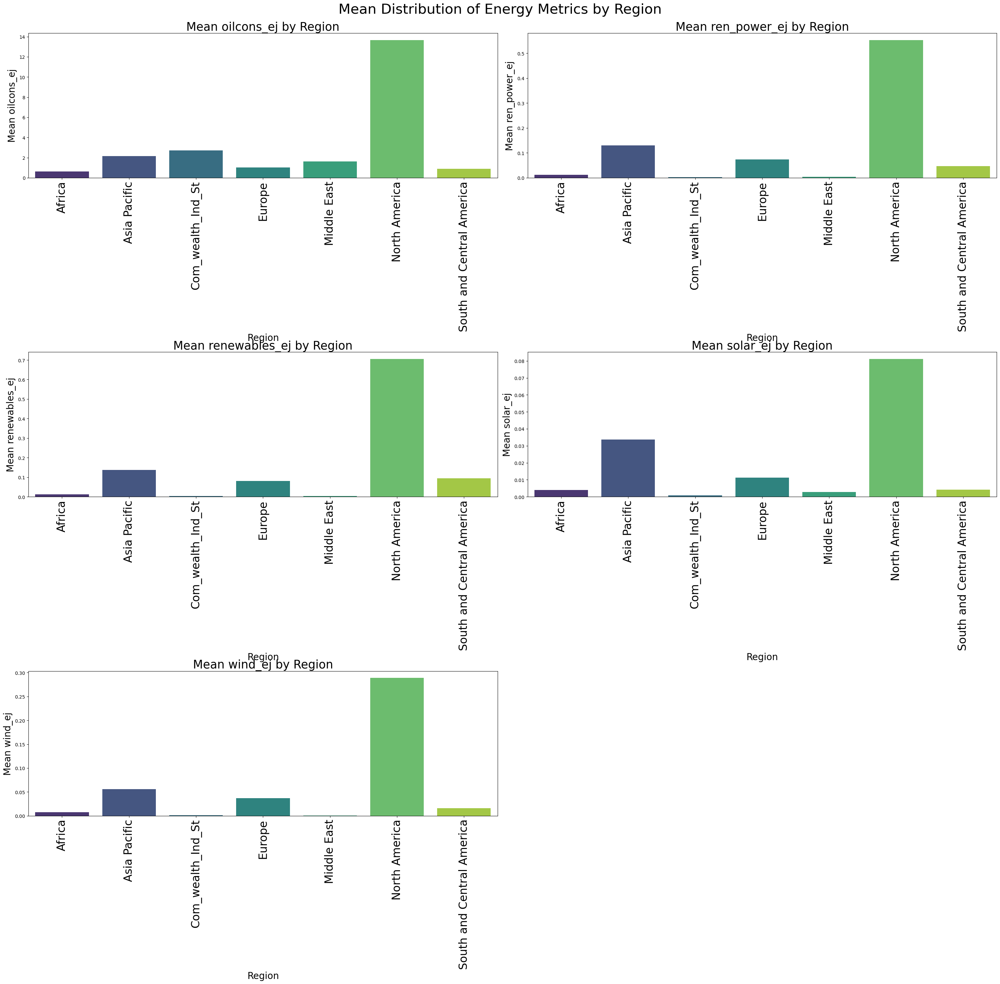

In [14]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Assuming 'df' is your DataFrame loaded with the necessary data
# Filter out rows where the region is unspecified
filtered_data = df.dropna(subset=['Region', 'coalcons_ej'])  # Ensure we drop NA values for accurate KDE

# Select the columns that represent energy metrics
energy_metrics = ['oilcons_ej', 'ren_power_ej', 'renewables_ej', 'solar_ej', 'wind_ej']

# Plotting bar plots for each energy metric
fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(30, 30))  # Adjust subplot grid as necessary
axes = axes.flatten()  # Flatten the array of axes to simplify the indexing in the loop

for idx, metric in enumerate(energy_metrics):
    if idx < len(axes):
        # Calculate mean values for each region and metric
        mean_values = filtered_data.groupby('Region')[metric].mean().reset_index()
        
        # Create bar plot for each metric by region
        sns.barplot(data=mean_values, x='Region', y=metric, ax=axes[idx], palette='viridis')
        axes[idx].set_title(f'Mean {metric} by Region', fontsize=25)
        axes[idx].set_xlabel('Region', fontsize=20)
        axes[idx].set_ylabel(f'Mean {metric}', fontsize=20)
        # Increase the size of the x-axis labels
        axes[idx].tick_params(axis='x', labelsize=24, rotation=90)  # Increase fontsize for x-axis labels

# Remove empty subplots if any (in case the number of metrics is less than the number of subplots)
for i in range(len(energy_metrics), len(axes)):
    fig.delaxes(axes[i])

# Adjust layout to prevent overlap and to neatly align the subplots
plt.tight_layout()
plt.subplots_adjust(top=0.95)
fig.suptitle('Mean Distribution of Energy Metrics by Region', fontsize=30)
plt.savefig("1.png", dpi = 300)
plt.show()


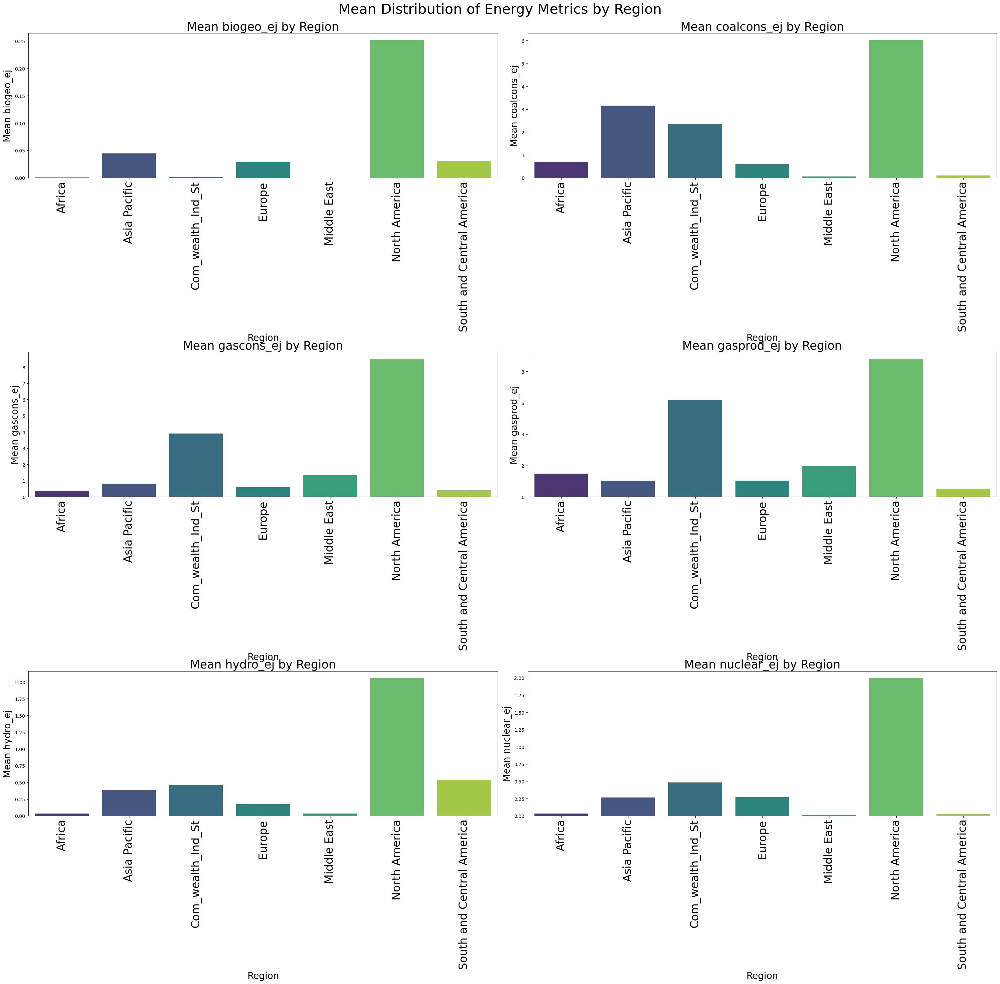

In [15]:
energy_metrics = ['biogeo_ej', 'coalcons_ej', 'gascons_ej', 'gasprod_ej', 'hydro_ej', 
                  'nuclear_ej']

# Plotting bar plots for each energy metric
fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(30, 30))  # Adjust subplot grid as necessary
axes = axes.flatten()  # Flatten the array of axes to simplify the indexing in the loop

for idx, metric in enumerate(energy_metrics):
    if idx < len(axes):
        # Calculate mean values for each region and metric
        mean_values = filtered_data.groupby('Region')[metric].mean().reset_index()
        
        # Create bar plot for each metric by region
        sns.barplot(data=mean_values, x='Region', y=metric, ax=axes[idx], palette='viridis')
        axes[idx].set_title(f'Mean {metric} by Region', fontsize=25)
        axes[idx].set_xlabel('Region', fontsize=20)
        axes[idx].set_ylabel(f'Mean {metric}', fontsize=20)
        # Increase the size of the x-axis labels
        axes[idx].tick_params(axis='x', labelsize=24, rotation=90)  # Increase fontsize for x-axis labels

# Remove empty subplots if any (in case the number of metrics is less than the number of subplots)
for i in range(len(energy_metrics), len(axes)):
    fig.delaxes(axes[i])

# Adjust layout to prevent overlap and to neatly align the subplots
plt.tight_layout()
plt.subplots_adjust(top=0.95)
fig.suptitle('Mean Distribution of Energy Metrics by Region', fontsize=30)
plt.savefig("1_1.png", dpi = 300)
plt.show()



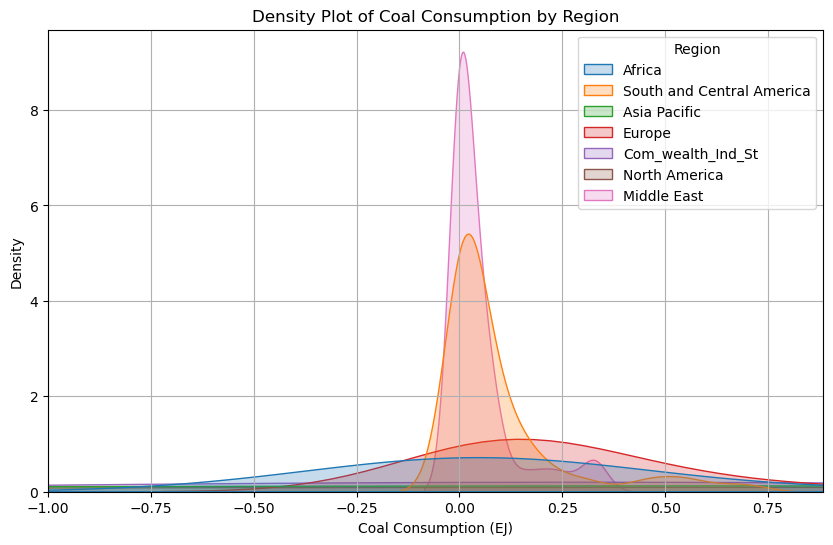

In [16]:
# Estimation plot for 'coalcons_ej'
plt.figure(figsize=(10, 6))
sns.kdeplot(data=filtered_data, x='coalcons_ej', hue='Region', fill=True, common_norm=False)
plt.title('Density Plot of Coal Consumption by Region')
plt.xlabel('Coal Consumption (EJ)')
plt.ylabel('Density')
# Dynamically set the x-axis limits based on min and max values in the 'coalcons_ej' column
xmin, xmax = filtered_data['coalcons_ej'].min(), filtered_data['coalcons_ej'].max()
plt.xlim(xmin-1, xmax * 0.01)  # Extend the maximum limit slightly for better visual effec
plt.grid()
plt.savefig("1.png", dpi = 300)
plt.show()


# Country Memberships in OPEC, EU, OECD, and CIS

In [17]:
def group_membership(row):
    if row['OPEC'] == 1:
        return 'OPEC'
    elif row['EU'] == 1:
        return 'EU'
    elif row['OECD'] == 1:
        return 'OECD'
    elif row['CIS'] == 1:
        return 'CIS'
    return 'None'

df['Group'] = df.apply(group_membership, axis=1)

# Create the choropleth map with Plotly Express
fig = px.choropleth(df, locations="Country", locationmode='country names',
                    color="Group",
                    hover_name="Country",
                    hover_data={"OPEC": True, "EU": True, "OECD": True, "CIS": True},
                    color_discrete_map={"OPEC": "green", "EU": "blue", "OECD": "red", "CIS": "yellow", "None": "grey"},
                    title="Country Memberships in OPEC, EU, OECD, and CIS")

# Adjust the layout to make the plot larger
fig.update_layout(
    height=600,  # Height of the figure in pixels
    width=1000,  # Width of the figure in pixels
    title_font_size=24,  # Adjust title font size if necessary
)

fig.update_geos(projection_type="natural earth")
fig.show()

# Africa

In [18]:
df_Africa = df[df["Region"] == "Africa"]
df_Africa = df_Africa.dropna(subset=['pop'])


In [19]:
import matplotlib.pyplot as plt

# Identifying the columns for coal, oil, and gas consumption
# 'oilcons_ej' is already identified for oil. Assuming 'gascons_ej' and 'coalcons_ej' follow similar naming.
# We need to find the coal and gas consumption columns, or closest matches.

# Checking for column names that might indicate coal and gas consumption
column_keywords = ['coal', 'gas']
column_names = df_Africa.columns

# Filtering column names based on our keywords
consumption_columns = [name for name in column_names if any(keyword in name for keyword in column_keywords)]

# Display filtered columns that might be related to coal and gas consumption
consumption_columns


['coalcons_ej', 'coalprod_ej', 'gascons_ej', 'gasprod_ej']

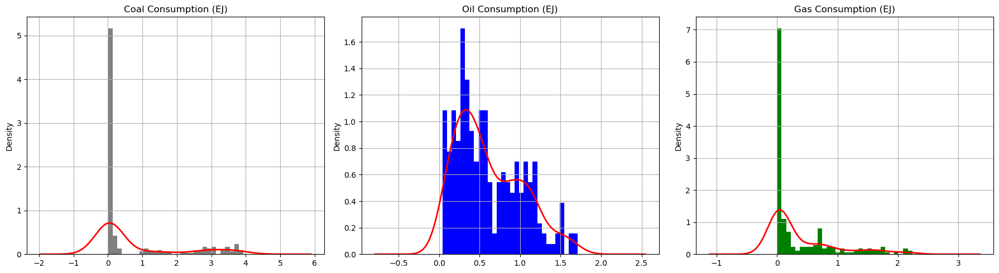

In [20]:
import matplotlib.pyplot as plt
import pandas as pd

column_keywords = ['coal', 'gas']
column_names = df_Africa.columns

# Filtering column names based on our keywords
consumption_columns = [name for name in column_names if any(keyword in name for keyword in column_keywords)]


# Plotting histograms and density plots with grid
fig, axes = plt.subplots(1, 3, figsize=(18, 5))
df_Africa['coalcons_ej'].dropna().plot(kind='hist', ax=axes[0], bins=30, color='gray', title='Coal Consumption (EJ)', density=True)
df_Africa['coalcons_ej'].dropna().plot(kind='kde', ax=axes[0], color='red', linewidth=2)
axes[0].grid(True)  # Apply grid

df_Africa['oilcons_ej'].dropna().plot(kind='hist', ax=axes[1], bins=30, color='blue', title='Oil Consumption (EJ)', density=True)
df_Africa['oilcons_ej'].dropna().plot(kind='kde', ax=axes[1], color='red', linewidth=2)
axes[1].grid(True)  # Apply grid

df_Africa['gascons_ej'].dropna().plot(kind='hist', ax=axes[2], bins=30, color='green', title='Gas Consumption (EJ)', density=True)
df_Africa['gascons_ej'].dropna().plot(kind='kde', ax=axes[2], color='red', linewidth=2)
axes[2].grid(True)  # Apply grid

plt.tight_layout()
plt.savefig("image.png",dpi=300)
plt.show()


In [140]:
def Prophet_Arima_prediction(df,feature,continent):
    
    df_feature = df.dropna(subset=[feature])
    df_feature = df_feature.query(f"{feature} > 0")
    df_feature = df_feature[["Year",f"{feature}"]]
    df_feature.reset_index(inplace=True,drop =True)

    df_feature = df_feature.groupby('Year')[f'{feature}'].mean()
    df_feature = df_feature.reset_index()
    # Create a DataFrame for monthly data for each year in the 'Year' column
    monthly_data = []

    for year in df_feature['Year'].unique():
        months = pd.date_range(start=f'{year}-01-01', end=f'{year}-12-01', freq='M')
        for month in months:
            monthly_data.append([month, year])

    # Create a DataFrame with monthly dates
    df_monthly = pd.DataFrame(monthly_data, columns=['ds', 'Year'])

    # Merge the monthly DataFrame with the original data to get the corresponding biogeo_ej values
    df_feature = pd.merge(df_monthly, df_feature[['Year', f'{feature}']], on='Year', how='left')

    # Perform linear interpolation for the 'biogeo_ej' column
    df_feature[f'{feature}_interpolated'] = df_feature.groupby('Year')[f'{feature}'].transform(lambda x: x.interpolate(method='linear'))


    # Prepare the data
    train_data = df_feature[:-12]  # Last 24 months for testing
    test_data = df_feature[-12:]

    # ARIMA Model
    arima_model = ARIMA(train_data[f'{feature}_interpolated'], order=(5, 1, 0))
    arima_fit = arima_model.fit()
    arima_result = arima_fit.get_forecast(steps=12)
    arima_forecast = arima_result.predicted_mean
    arima_conf_int = arima_result.conf_int()

    # Prophet Model
    prophet_data = train_data.rename(columns={'ds': 'ds', f'{feature}_interpolated': 'y'})
    prophet_model = Prophet()
    prophet_model.fit(prophet_data)
    future = prophet_model.make_future_dataframe(periods=12, freq='M')
    prophet_forecast = prophet_model.predict(future)

    # Plotting
    plt.figure(figsize=(12, 6))
    plt.plot(df_feature['ds'], df_feature[f'{feature}_interpolated'], label='Original Data', color='blue')
    plt.plot(test_data['ds'], arima_forecast, label='ARIMA Forecast', color='red')
    plt.fill_between(test_data['ds'], arima_conf_int.iloc[:, 0], arima_conf_int.iloc[:, 1], color='red', alpha=0.3)
    plt.plot(prophet_forecast['ds'], prophet_forecast['yhat'], label='Prophet Forecast', color='green')
    plt.fill_between(prophet_forecast['ds'], prophet_forecast['yhat_lower'], prophet_forecast['yhat_upper'], color='green', alpha=0.3)
    plt.title(f'Time Series Forecasting on {feature} in {continent} using ARIMA and Prophet')
    plt.xlabel('Date')
    plt.ylabel(f'{feature}')
    plt.legend(loc = 'upper left')
    plt.grid(True)
    plt.tight_layout()
    if feature == "biogeo_ej":
        plt.savefig(f"image_{feature}_{continent}.png", dpi = 300)
    else:
        plt.show()

    # Evaluation
    arima_mae = mean_absolute_error(test_data[f'{feature}_interpolated'], arima_forecast)
    prophet_mae = mean_absolute_error(test_data[f'{feature}_interpolated'], prophet_forecast['yhat'].iloc[-12:])
    arimna_mse = mean_squared_error(test_data[f'{feature}_interpolated'], arima_forecast)
    prophet_mse = mean_squared_error(test_data[f'{feature}_interpolated'], prophet_forecast['yhat'].iloc[-12:])
    print(f"{feature} prediction performance metrics in {continent}")
    print("--"*30)
    print(f"ARIMA MAE: {arima_mae}")
    print(f"Prophet MAE: {prophet_mae}")
    print(f"ARIMA MSE: {arimna_mse}")
    print(f"Prophet MSE: {prophet_mse}")


## Africa_biogeo

01:57:40 - cmdstanpy - INFO - Chain [1] start processing
01:57:40 - cmdstanpy - INFO - Chain [1] done processing


biogeo_ej prediction performance metrics in Africa
------------------------------------------------------------
ARIMA MAE: 0.0
Prophet MAE: 0.00020402273553043904
ARIMA MSE: 0.0
Prophet MSE: 9.157348022448214e-08


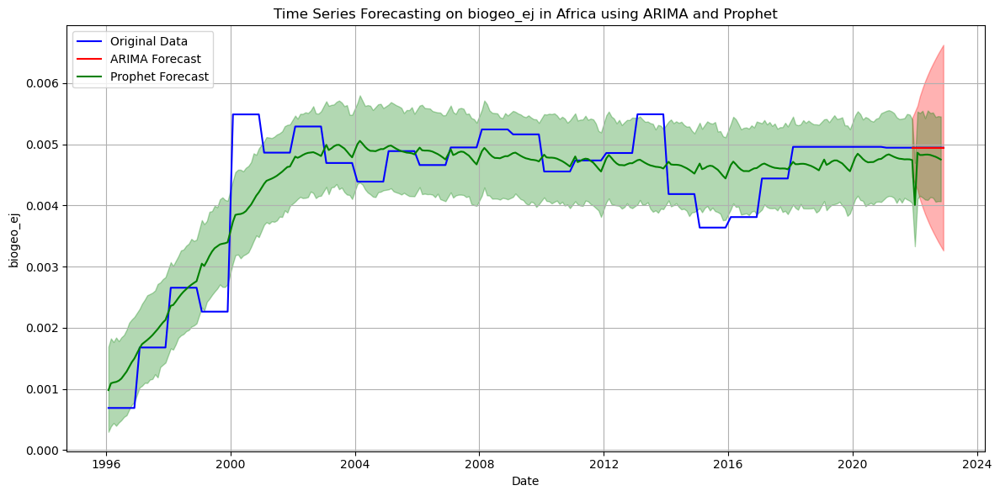

In [141]:
Prophet_Arima_prediction(df_Africa,"biogeo_ej","Africa")

## Africa_co2_combust_per

01:57:42 - cmdstanpy - INFO - Chain [1] start processing
01:57:43 - cmdstanpy - INFO - Chain [1] done processing


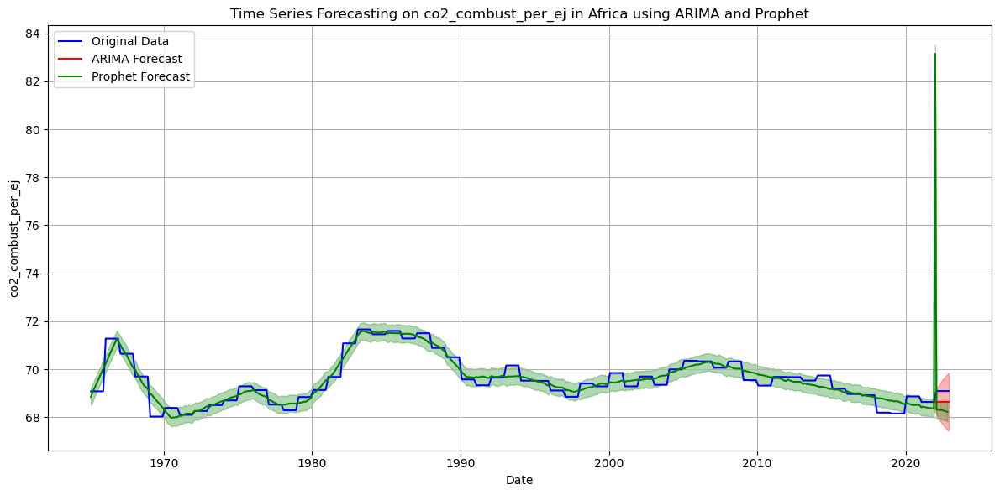

co2_combust_per_ej prediction performance metrics in Africa
------------------------------------------------------------
ARIMA MAE: 0.41623659916666966
Prophet MAE: 1.869748395294998
ARIMA MSE: 0.1890031707118198
Prophet MSE: 17.014408580512264


In [142]:
Prophet_Arima_prediction(df_Africa,"co2_combust_per_ej","Africa")

## Africa_coalcons

01:57:45 - cmdstanpy - INFO - Chain [1] start processing
01:57:45 - cmdstanpy - INFO - Chain [1] done processing


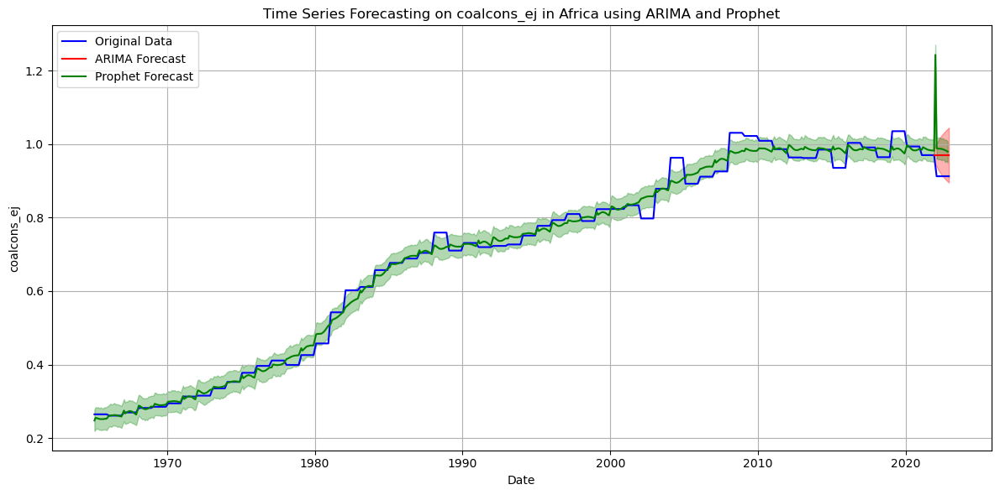

coalcons_ej prediction performance metrics in Africa
------------------------------------------------------------
ARIMA MAE: 0.052692991083333286
Prophet MAE: 0.0892326008936024
ARIMA MSE: 0.0030289650646998997
Prophet MSE: 0.013523504886963673


In [143]:
Prophet_Arima_prediction(df_Africa,"coalcons_ej","Africa")

## Africa_coalprod

01:57:47 - cmdstanpy - INFO - Chain [1] start processing
01:57:47 - cmdstanpy - INFO - Chain [1] done processing


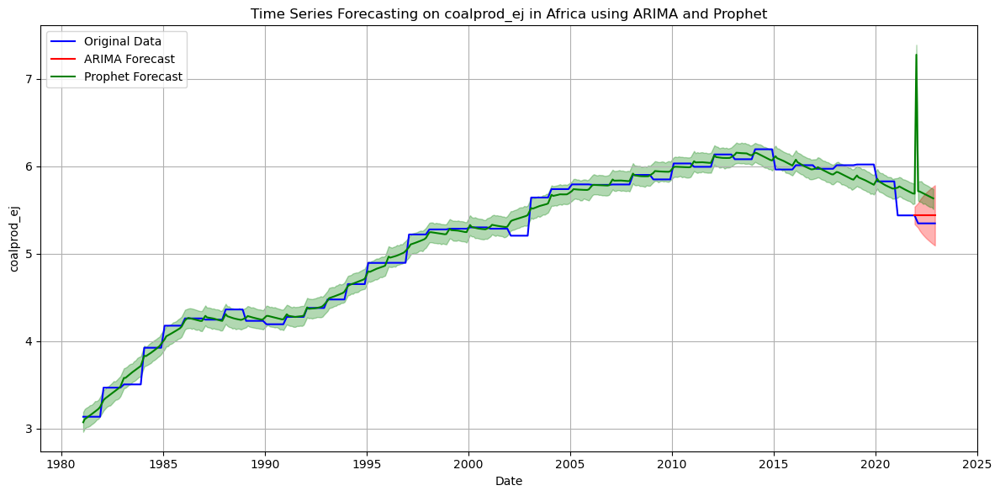

coalprod_ej prediction performance metrics in Africa
------------------------------------------------------------
ARIMA MAE: 0.08372402133333375
Prophet MAE: 0.4567316539356206
ARIMA MSE: 0.00764695827079039
Prophet MSE: 0.4072643917576158


In [144]:
Prophet_Arima_prediction(df_Africa,"coalprod_ej","Africa")

## Africa_gascons

01:57:49 - cmdstanpy - INFO - Chain [1] start processing
01:57:49 - cmdstanpy - INFO - Chain [1] done processing


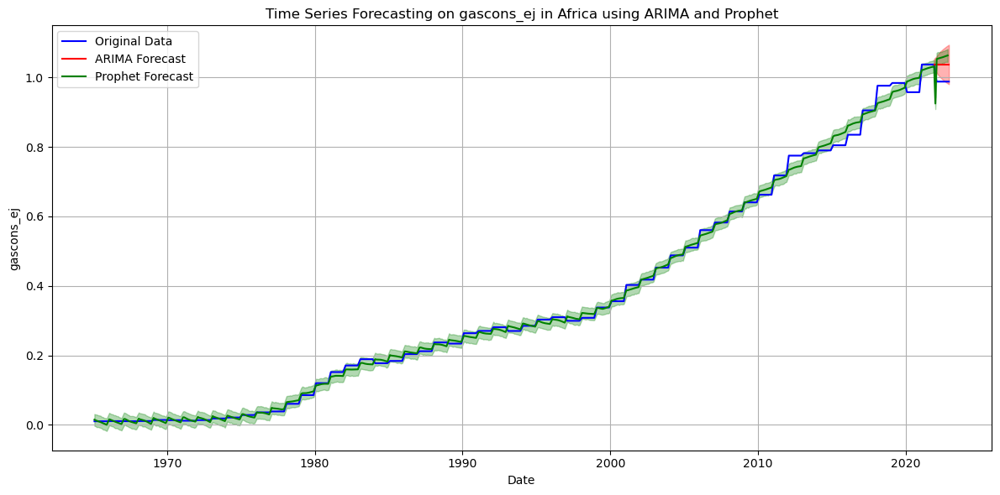

gascons_ej prediction performance metrics in Africa
------------------------------------------------------------
ARIMA MAE: 0.045121721333333316
Prophet MAE: 0.06399669390426728
ARIMA MSE: 0.0022210578939087133
Prophet MSE: 0.004419483910119679


In [145]:
Prophet_Arima_prediction(df_Africa,"gascons_ej","Africa")

## Africa_gasprod

01:57:50 - cmdstanpy - INFO - Chain [1] start processing
01:57:50 - cmdstanpy - INFO - Chain [1] done processing


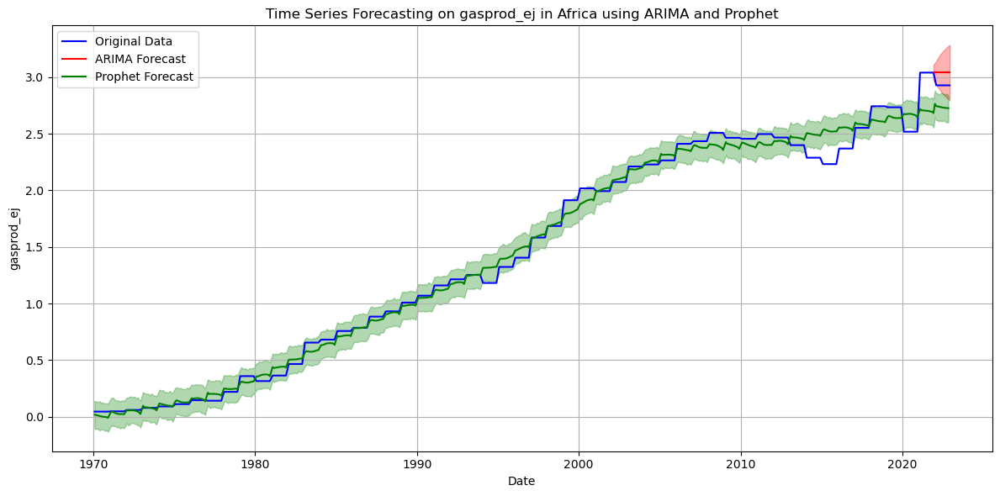

gasprod_ej prediction performance metrics in Africa
------------------------------------------------------------
ARIMA MAE: 0.10286695741666659
Prophet MAE: 0.20510000337382864
ARIMA MSE: 0.011543575557995234
Prophet MSE: 0.0442848629884079


In [146]:
Prophet_Arima_prediction(df_Africa,"gasprod_ej","Africa")

## Africa _ hydro

01:57:52 - cmdstanpy - INFO - Chain [1] start processing
01:57:52 - cmdstanpy - INFO - Chain [1] done processing


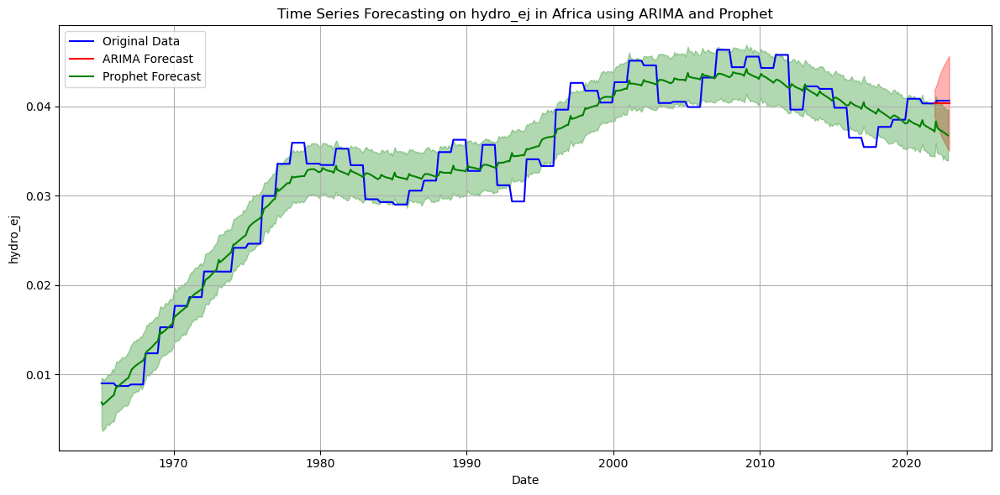

hydro_ej prediction performance metrics in Africa
------------------------------------------------------------
ARIMA MAE: 0.0002795864729166781
Prophet MAE: 0.003331210237955034
ARIMA MSE: 8.527483182326005e-08
Prophet MSE: 1.1266634847642177e-05


In [147]:
Prophet_Arima_prediction(df_Africa,"hydro_ej","Africa")

## Africa _ nuclear

01:57:54 - cmdstanpy - INFO - Chain [1] start processing
01:57:54 - cmdstanpy - INFO - Chain [1] done processing


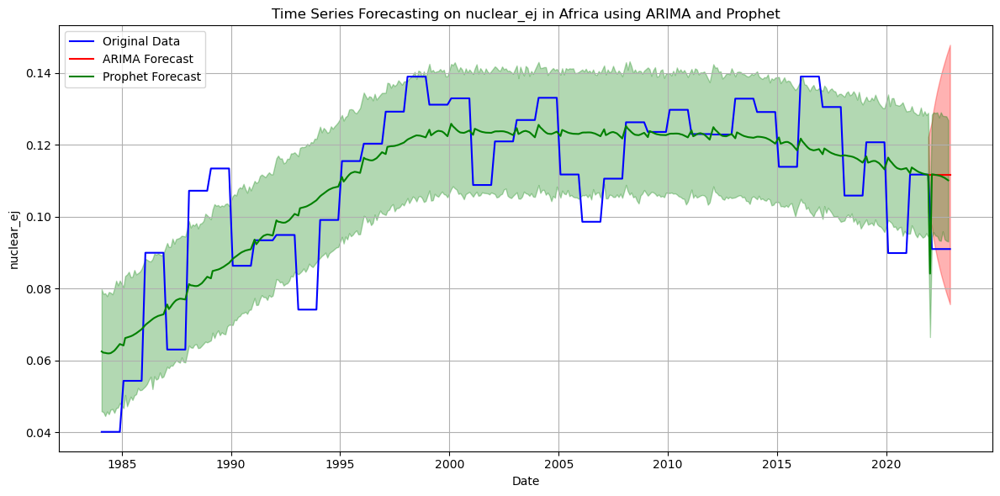

nuclear_ej prediction performance metrics in Africa
------------------------------------------------------------
ARIMA MAE: 0.01899044858333334
Prophet MAE: 0.017405909314209243
ARIMA MSE: 0.00039342233170497516
Prophet MSE: 0.0003439756175189579


In [148]:
Prophet_Arima_prediction(df_Africa,"nuclear_ej","Africa")

## Africa _ oilcons

01:57:56 - cmdstanpy - INFO - Chain [1] start processing
01:57:56 - cmdstanpy - INFO - Chain [1] done processing


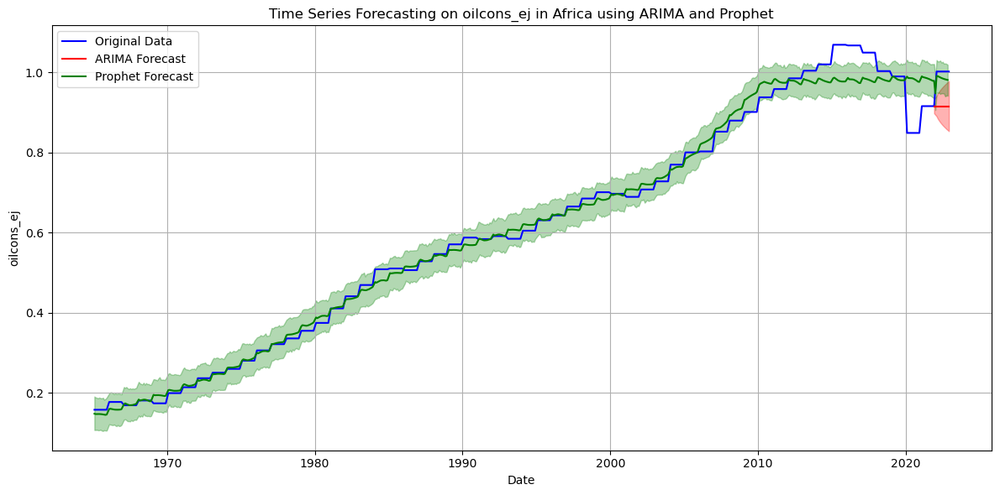

oilcons_ej prediction performance metrics in Africa
------------------------------------------------------------
ARIMA MAE: 0.07920707758333327
Prophet MAE: 0.02347147457661271
ARIMA MSE: 0.006844103061046012
Prophet MSE: 0.0008131548572590246


In [149]:
Prophet_Arima_prediction(df_Africa,"oilcons_ej","Africa")

## Africa _ primary

01:57:58 - cmdstanpy - INFO - Chain [1] start processing
01:57:58 - cmdstanpy - INFO - Chain [1] done processing


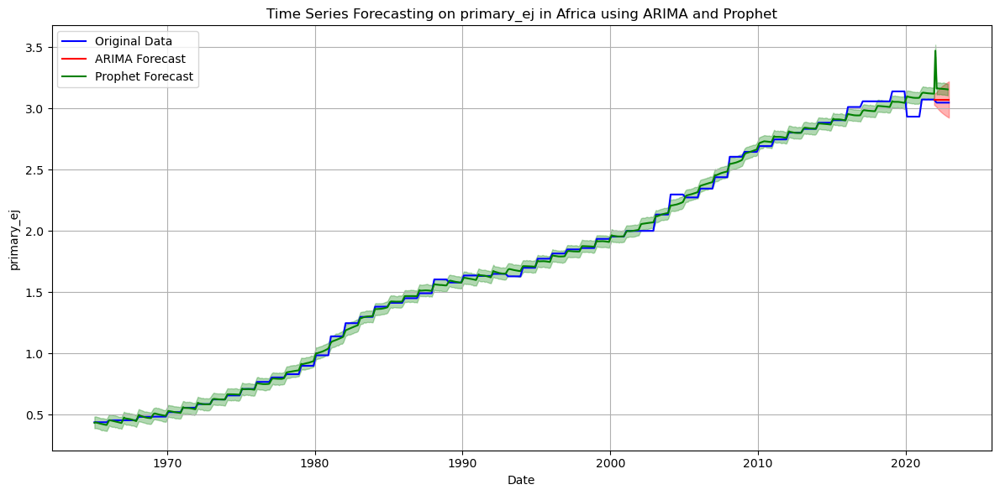

primary_ej prediction performance metrics in Africa
------------------------------------------------------------
ARIMA MAE: 0.02318451689583334
Prophet MAE: 0.13326060601924447
ARIMA MSE: 0.0005863874440289255
Prophet MSE: 0.025745677392469298


In [150]:
Prophet_Arima_prediction(df_Africa,"primary_ej","Africa")

## Africa _ primary_pc

01:57:59 - cmdstanpy - INFO - Chain [1] start processing
01:57:59 - cmdstanpy - INFO - Chain [1] done processing


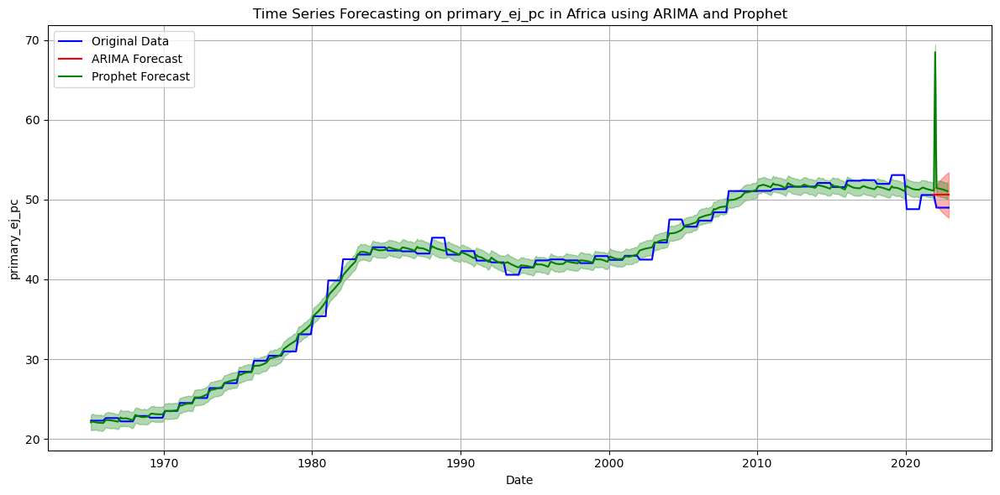

primary_ej_pc prediction performance metrics in Africa
------------------------------------------------------------
ARIMA MAE: 1.4557263760416628
Prophet MAE: 3.575530556894266
ARIMA MSE: 2.3117883075309744
Prophet MSE: 36.02207743179216


In [151]:
Prophet_Arima_prediction(df_Africa,"primary_ej_pc","Africa")

## Africa _ ren_power

01:58:00 - cmdstanpy - INFO - Chain [1] start processing
01:58:00 - cmdstanpy - INFO - Chain [1] done processing


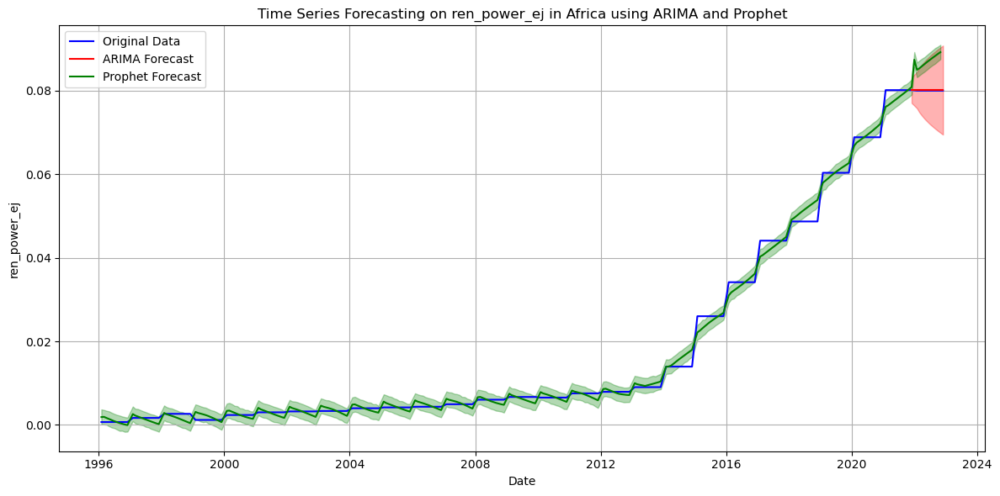

ren_power_ej prediction performance metrics in Africa
------------------------------------------------------------
ARIMA MAE: 0.000116074979166664
Prophet MAE: 0.006597354127251848
ARIMA MSE: 1.4698255405681616e-08
Prophet MSE: 4.823544512330436e-05


In [152]:
Prophet_Arima_prediction(df_Africa,"ren_power_ej","Africa")

## Africa _ renewables

01:58:01 - cmdstanpy - INFO - Chain [1] start processing
01:58:01 - cmdstanpy - INFO - Chain [1] done processing


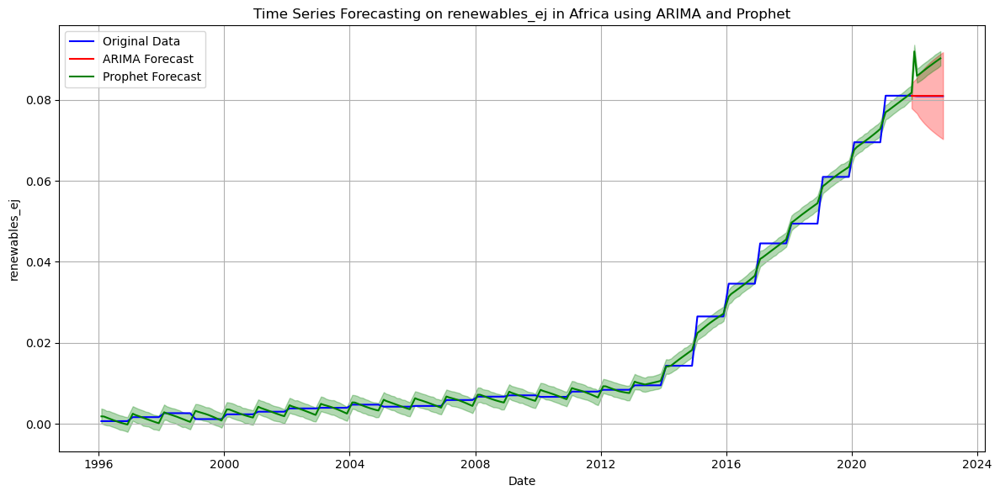

renewables_ej prediction performance metrics in Africa
------------------------------------------------------------
ARIMA MAE: 0.00010885645833332014
Prophet MAE: 0.006974772442650192
ARIMA MSE: 1.2926976568226035e-08
Prophet MSE: 5.489435874269779e-05


In [153]:
Prophet_Arima_prediction(df_Africa,"renewables_ej","Africa")

## Africa _ solar

01:58:03 - cmdstanpy - INFO - Chain [1] start processing
01:58:03 - cmdstanpy - INFO - Chain [1] done processing


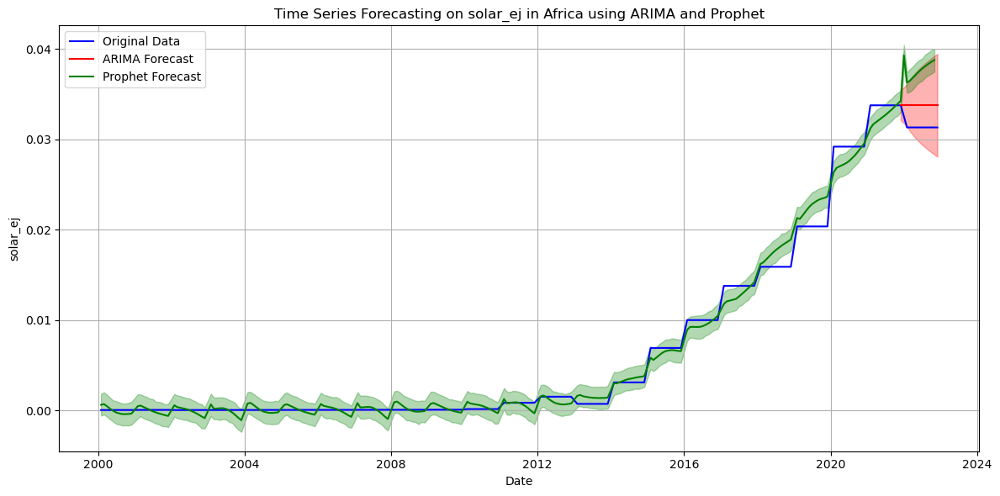

solar_ej prediction performance metrics in Africa
------------------------------------------------------------
ARIMA MAE: 0.0022455716249999984
Prophet MAE: 0.005932348844065784
ARIMA MSE: 5.501009370551055e-06
Prophet MSE: 3.867269877683378e-05


In [154]:
Prophet_Arima_prediction(df_Africa,"solar_ej","Africa")

## Africa _ wind

01:58:04 - cmdstanpy - INFO - Chain [1] start processing
01:58:04 - cmdstanpy - INFO - Chain [1] done processing


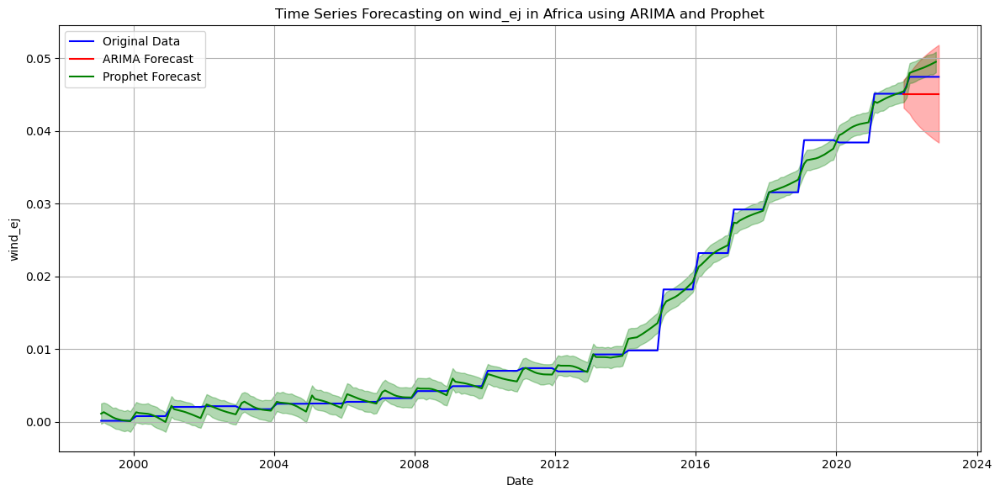

wind_ej prediction performance metrics in Africa
------------------------------------------------------------
ARIMA MAE: 0.0021294967145833337
Prophet MAE: 0.0011840881008279367
ARIMA MSE: 4.947006826277687e-06
Prophet MSE: 1.6641098309416401e-06


In [155]:
Prophet_Arima_prediction(df_Africa,"wind_ej","Africa")

## Population Trend in Africa

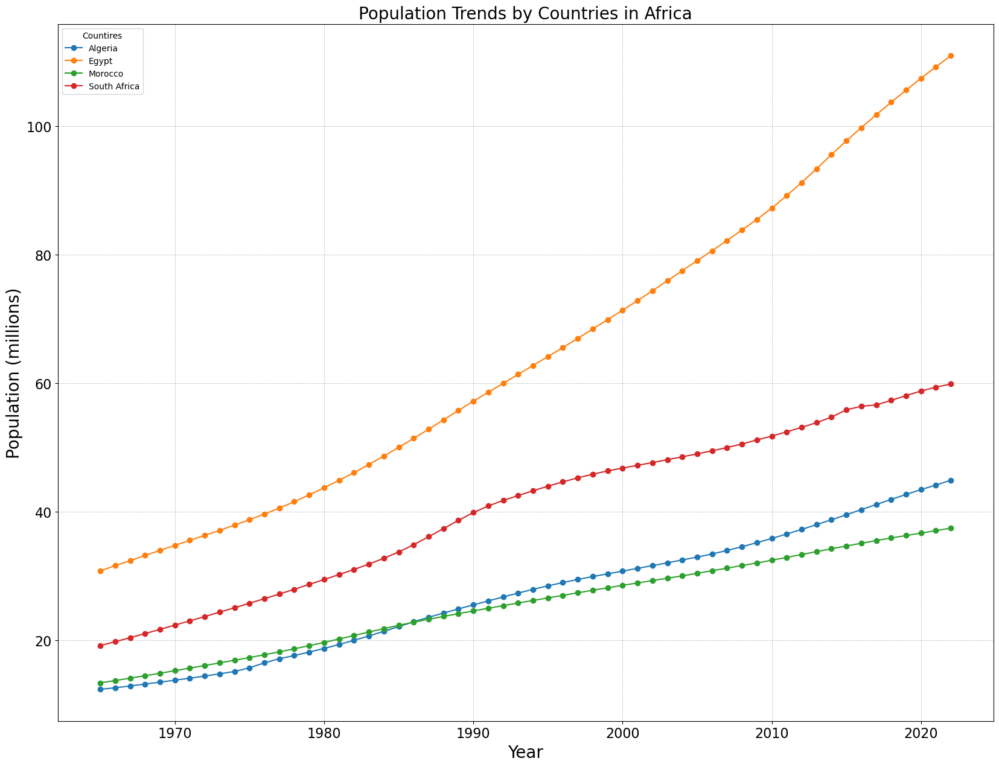

In [156]:
plt.figure(figsize=(20, 15))

# Group data by SubRegion and plot each group
for label, grp in df_Africa.groupby('Country'):
    plt.plot(grp['Year'], grp['pop'], marker='o', linestyle='-', label=label)

plt.title('Population Trends by Countries in Africa',fontsize=20)
plt.xlabel('Year',fontsize=20)
plt.ylabel('Population (millions)',fontsize=20)
plt.legend(title='Countires')
# Enhancing grid visibility
plt.grid(True, which='both', linestyle='--', linewidth=0.5)

# Increase the size of the tick labels on both axes
plt.tick_params(axis='both', which='major', labelsize=16)
plt.grid(True)
plt.show()

# South and Central America

In [157]:
df_S_C_America = df[df["Region"] == "South and Central America"]
df_S_C_America = df_S_C_America.dropna(subset=['pop'])

In [158]:
df_S_C_America.columns

Index(['Country', 'Year', 'pop', 'Region', 'SubRegion', 'OPEC', 'EU', 'OECD',
       'CIS', 'biogeo_ej', 'co2_combust_per_ej', 'coalcons_ej', 'coalprod_ej',
       'gascons_ej', 'gasprod_ej', 'hydro_ej', 'nuclear_ej', 'oilcons_ej',
       'primary_ej', 'primary_ej_pc', 'ren_power_ej', 'renewables_ej',
       'solar_ej', 'wind_ej', 'Group'],
      dtype='object')

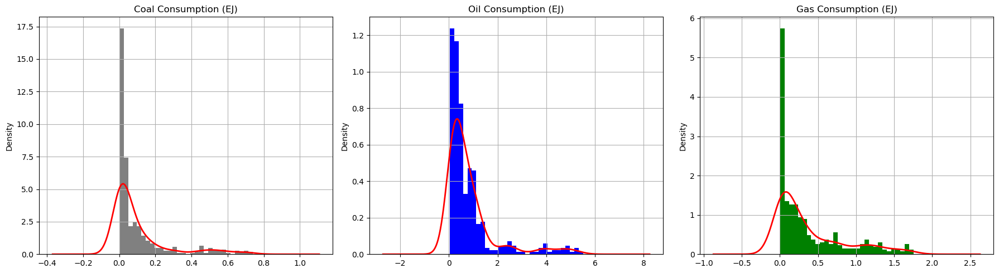

In [159]:
import matplotlib.pyplot as plt
import pandas as pd

column_keywords = ['coal', 'gas']
column_names = df_Africa.columns

# Filtering column names based on our keywords
consumption_columns = [name for name in column_names if any(keyword in name for keyword in column_keywords)]


# Plotting histograms and density plots with grid
fig, axes = plt.subplots(1, 3, figsize=(18, 5))
df_S_C_America['coalcons_ej'].dropna().plot(kind='hist', ax=axes[0], bins=30, color='gray', title='Coal Consumption (EJ)', density=True)
df_S_C_America['coalcons_ej'].dropna().plot(kind='kde', ax=axes[0], color='red', linewidth=2)
axes[0].grid(True)  # Apply grid

df_S_C_America['oilcons_ej'].dropna().plot(kind='hist', ax=axes[1], bins=30, color='blue', title='Oil Consumption (EJ)', density=True)
df_S_C_America['oilcons_ej'].dropna().plot(kind='kde', ax=axes[1], color='red', linewidth=2)
axes[1].grid(True)  # Apply grid

df_S_C_America['gascons_ej'].dropna().plot(kind='hist', ax=axes[2], bins=30, color='green', title='Gas Consumption (EJ)', density=True)
df_S_C_America['gascons_ej'].dropna().plot(kind='kde', ax=axes[2], color='red', linewidth=2)
axes[2].grid(True)  # Apply grid

plt.tight_layout()
plt.savefig("image1.png",dpi=300)
plt.show()


## South and Central America biogeo_ej

01:58:07 - cmdstanpy - INFO - Chain [1] start processing
01:58:07 - cmdstanpy - INFO - Chain [1] done processing


biogeo_ej prediction performance metrics in South and Central America
------------------------------------------------------------
ARIMA MAE: 0.005047447690476193
Prophet MAE: 0.01940435575903641
ARIMA MSE: 2.779279438701103e-05
Prophet MSE: 0.00041358724498758033


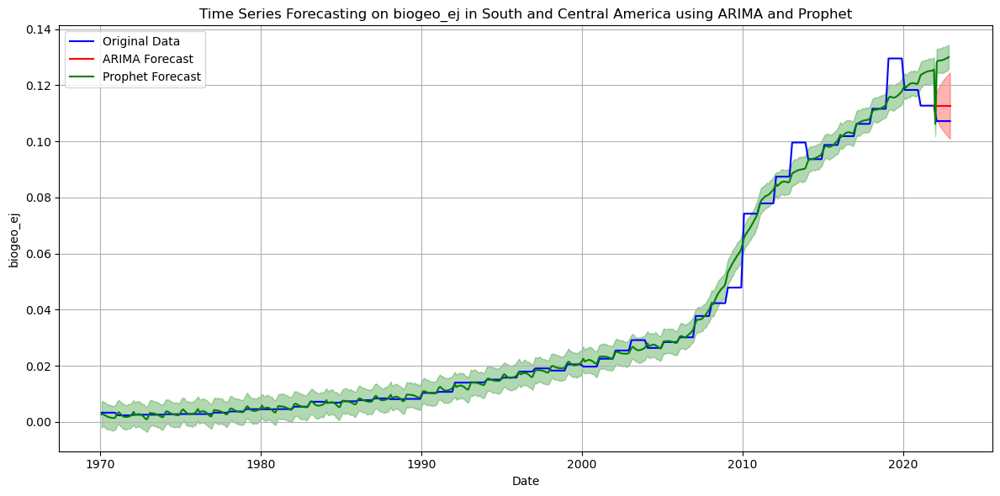

In [160]:
Prophet_Arima_prediction(df_S_C_America,"biogeo_ej","South and Central America")

## South and Central America co2_combust_per_ej

01:58:08 - cmdstanpy - INFO - Chain [1] start processing
01:58:09 - cmdstanpy - INFO - Chain [1] done processing


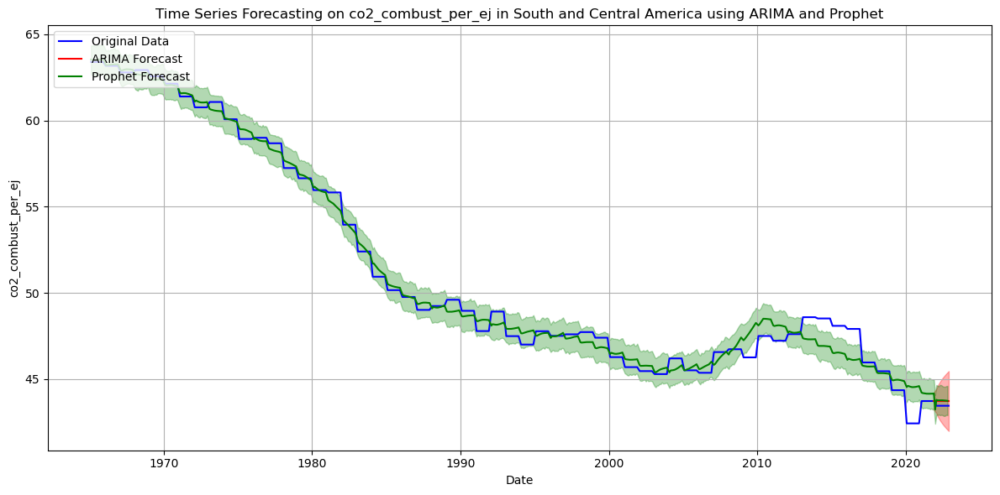

co2_combust_per_ej prediction performance metrics in South and Central America
------------------------------------------------------------
ARIMA MAE: 0.25067000520833105
Prophet MAE: 0.31575562438484717
ARIMA MSE: 0.06854776528488514
Prophet MSE: 0.10191243468242715


In [161]:
Prophet_Arima_prediction(df_S_C_America,"co2_combust_per_ej","South and Central America")

## South and Central America coalcons_ej

01:58:09 - cmdstanpy - INFO - Chain [1] start processing
01:58:10 - cmdstanpy - INFO - Chain [1] done processing


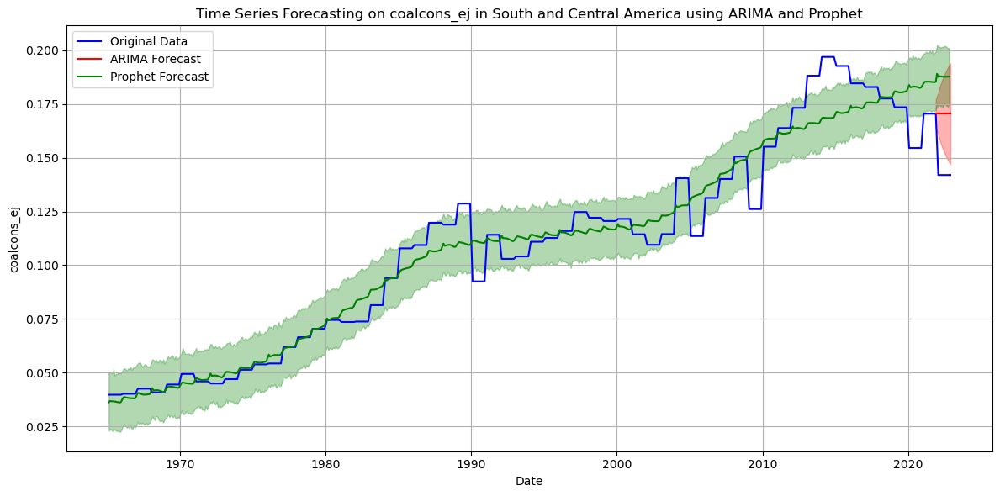

coalcons_ej prediction performance metrics in South and Central America
------------------------------------------------------------
ARIMA MAE: 0.026145138511904795
Prophet MAE: 0.04330818514937886
ARIMA MSE: 0.0007457108376072953
Prophet MSE: 0.0019490223804469453


In [162]:
Prophet_Arima_prediction(df_S_C_America,"coalcons_ej","South and Central America")

## South and Central America coalprod_ej

01:58:10 - cmdstanpy - INFO - Chain [1] start processing
01:58:10 - cmdstanpy - INFO - Chain [1] done processing


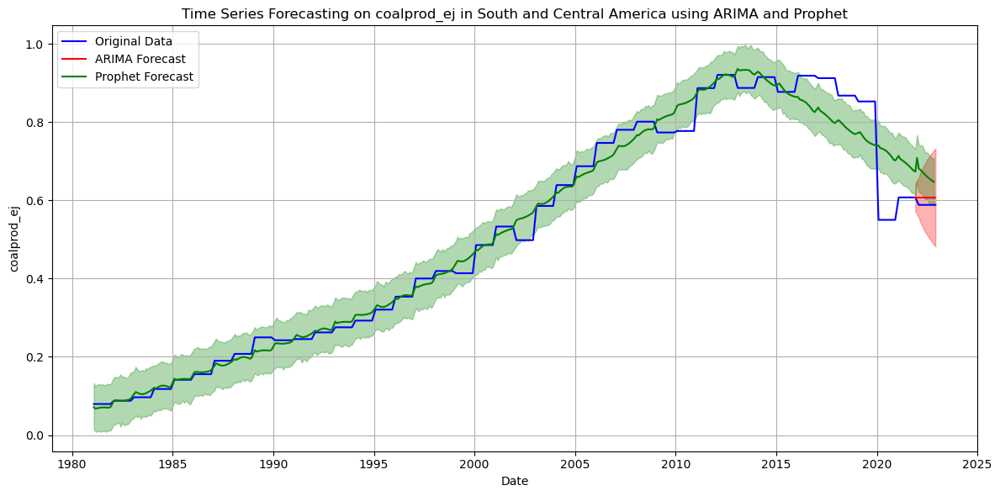

coalprod_ej prediction performance metrics in South and Central America
------------------------------------------------------------
ARIMA MAE: 0.01747596063888886
Prophet MAE: 0.07813687085677466
ARIMA MSE: 0.000333173673002174
Prophet MSE: 0.006379022604640056


In [163]:
Prophet_Arima_prediction(df_S_C_America,"coalprod_ej","South and Central America")

## South and Central America gascons_ej

01:58:11 - cmdstanpy - INFO - Chain [1] start processing
01:58:11 - cmdstanpy - INFO - Chain [1] done processing


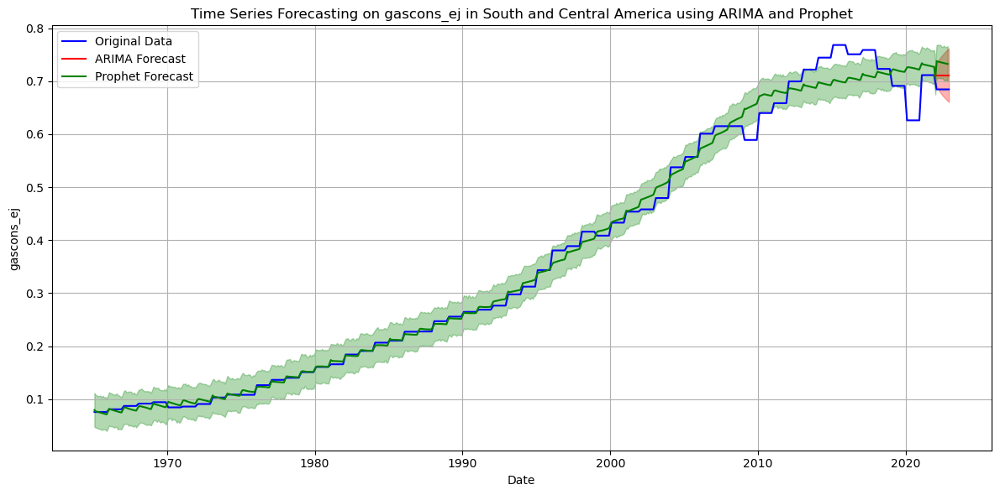

gascons_ej prediction performance metrics in South and Central America
------------------------------------------------------------
ARIMA MAE: 0.024670142062499994
Prophet MAE: 0.045230973778371104
ARIMA MSE: 0.0006639446284188343
Prophet MSE: 0.002191140695886474


In [164]:
Prophet_Arima_prediction(df_S_C_America,"gascons_ej","South and Central America")

## South and Central America gasprod_ej

01:58:12 - cmdstanpy - INFO - Chain [1] start processing
01:58:13 - cmdstanpy - INFO - Chain [1] done processing


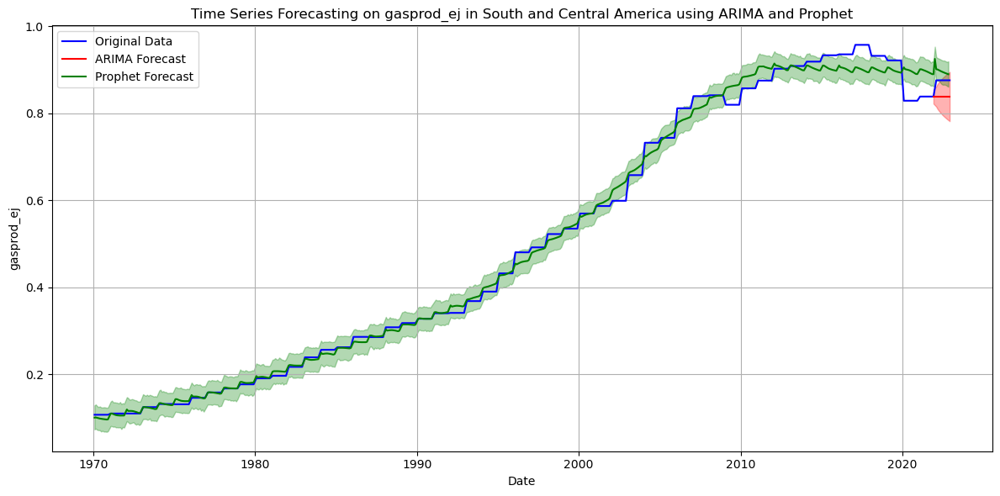

gasprod_ej prediction performance metrics in South and Central America
------------------------------------------------------------
ARIMA MAE: 0.03424761618055561
Prophet MAE: 0.024801192571411806
ARIMA MSE: 0.0012795264153279864
Prophet MSE: 0.0007569701293215538


In [165]:
Prophet_Arima_prediction(df_S_C_America,"gasprod_ej","South and Central America")

## South and Central America hydro_ej

01:58:13 - cmdstanpy - INFO - Chain [1] start processing
01:58:14 - cmdstanpy - INFO - Chain [1] done processing


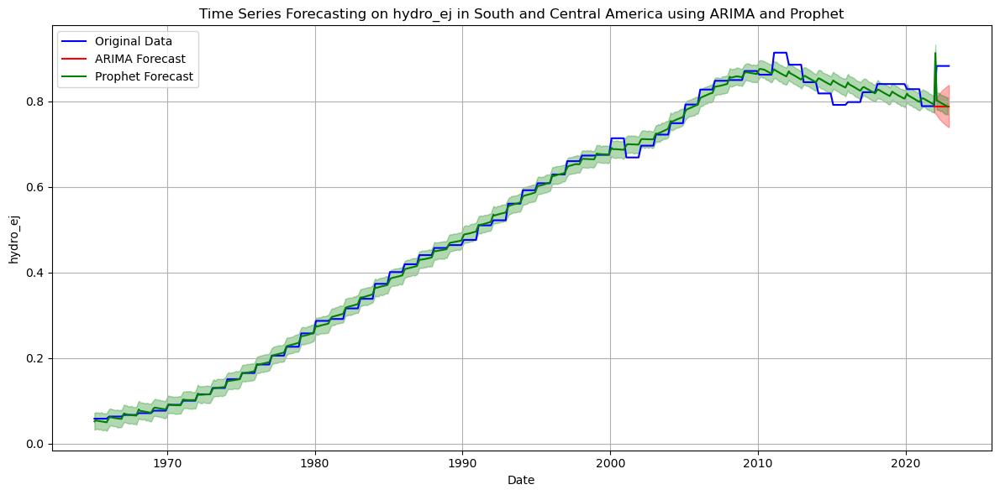

hydro_ej prediction performance metrics in South and Central America
------------------------------------------------------------
ARIMA MAE: 0.08611542958333329
Prophet MAE: 0.0759966710044984
ARIMA MSE: 0.008090036958896764
Prophet MSE: 0.006518650118796759


In [166]:
Prophet_Arima_prediction(df_S_C_America,"hydro_ej","South and Central America")

## South and Central America nuclear_ej

01:58:15 - cmdstanpy - INFO - Chain [1] start processing
01:58:15 - cmdstanpy - INFO - Chain [1] done processing


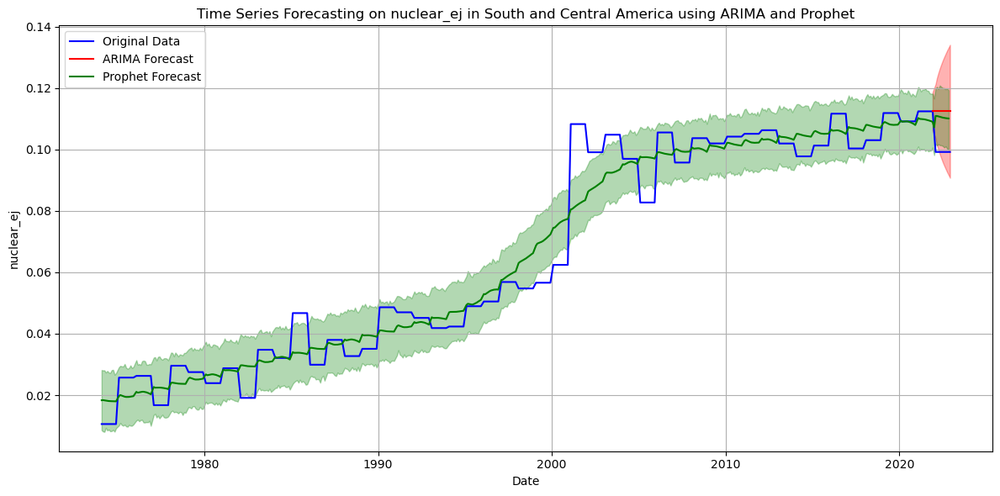

nuclear_ej prediction performance metrics in South and Central America
------------------------------------------------------------
ARIMA MAE: 0.012124604250000004
Prophet MAE: 0.010360266046403771
ARIMA MSE: 0.00016037021260267433
Prophet MSE: 0.00011259519741046775


In [167]:
Prophet_Arima_prediction(df_S_C_America,"nuclear_ej","South and Central America")

## South and Central America oilcons_ej

01:58:16 - cmdstanpy - INFO - Chain [1] start processing
01:58:16 - cmdstanpy - INFO - Chain [1] done processing


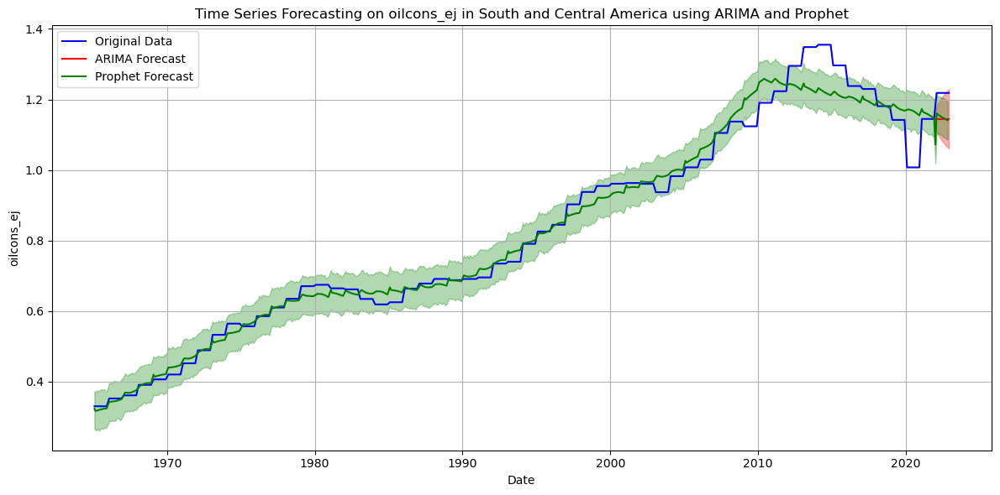

oilcons_ej prediction performance metrics in South and Central America
------------------------------------------------------------
ARIMA MAE: 0.06757763271874995
Prophet MAE: 0.06951839275412303
ARIMA MSE: 0.004981894302403924
Prophet MSE: 0.0057370932491509164


In [168]:
Prophet_Arima_prediction(df_S_C_America,"oilcons_ej","South and Central America")

## South and Central America primary_ej

01:58:17 - cmdstanpy - INFO - Chain [1] start processing
01:58:17 - cmdstanpy - INFO - Chain [1] done processing


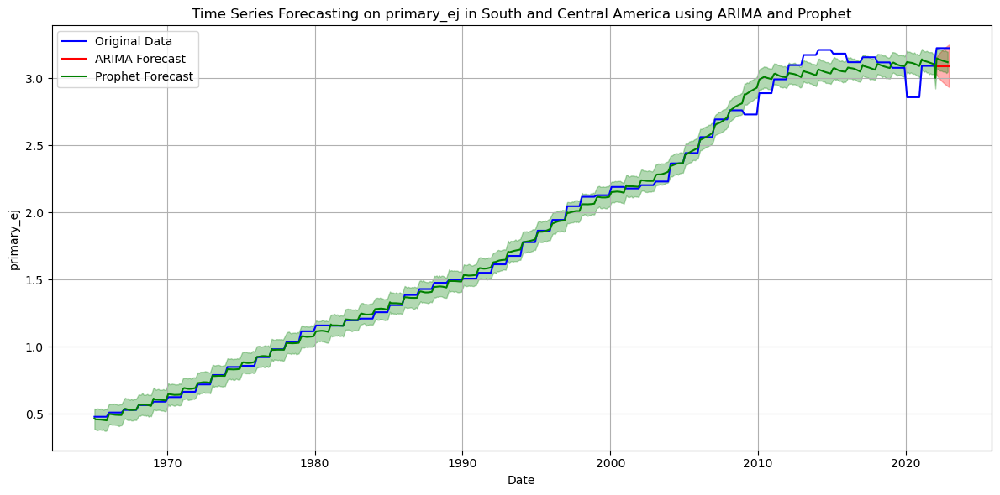

primary_ej prediction performance metrics in South and Central America
------------------------------------------------------------
ARIMA MAE: 0.12114363731250037
Prophet MAE: 0.0956219284624014
ARIMA MSE: 0.016009942757784692
Prophet MSE: 0.011151889242715722


In [169]:
Prophet_Arima_prediction(df_S_C_America,"primary_ej","South and Central America")

## South and Central America primary_ej_pc

01:58:18 - cmdstanpy - INFO - Chain [1] start processing
01:58:18 - cmdstanpy - INFO - Chain [1] done processing


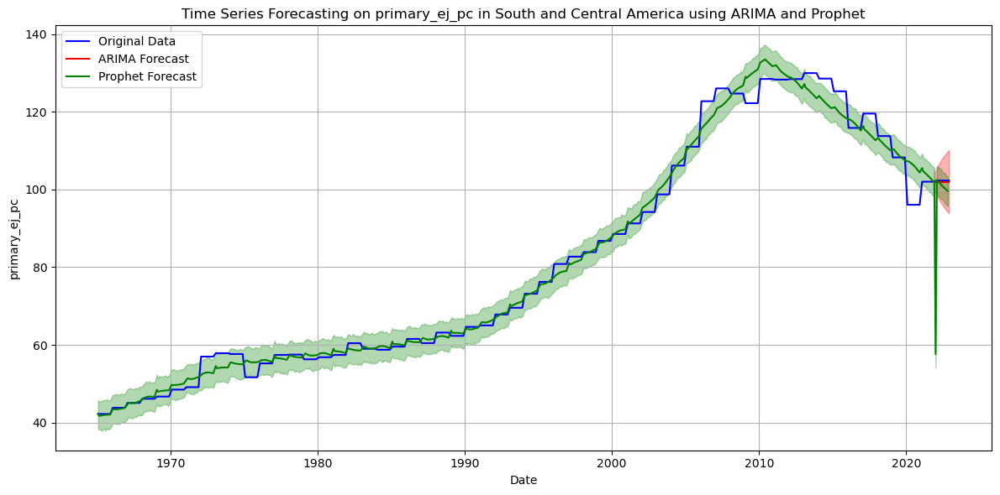

primary_ej_pc prediction performance metrics in South and Central America
------------------------------------------------------------
ARIMA MAE: 0.2673190540624937
Prophet MAE: 4.883759175679214
ARIMA MSE: 0.07795579272530882
Prophet MSE: 168.7083162212145


In [170]:
Prophet_Arima_prediction(df_S_C_America,"primary_ej_pc","South and Central America")

## South and Central America ren_power_ej

01:58:19 - cmdstanpy - INFO - Chain [1] start processing
01:58:19 - cmdstanpy - INFO - Chain [1] done processing


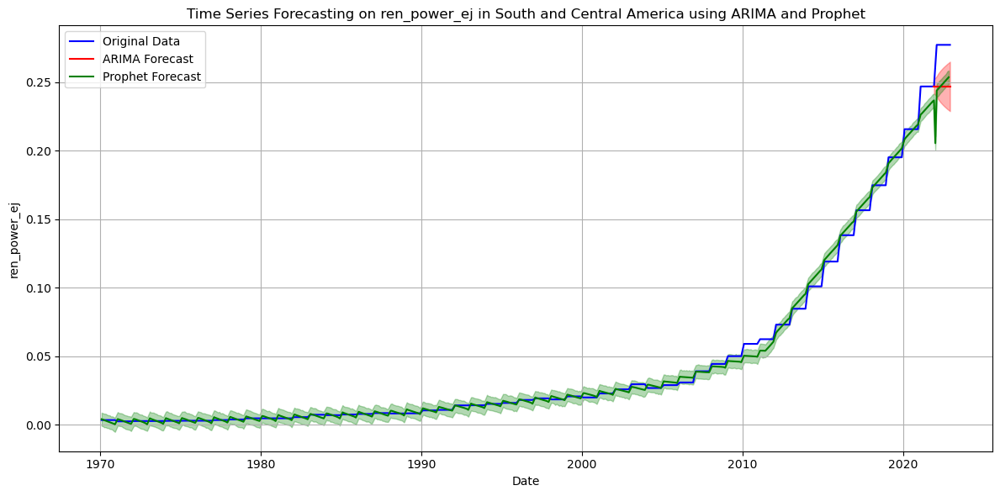

ren_power_ej prediction performance metrics in South and Central America
------------------------------------------------------------
ARIMA MAE: 0.027836153090624982
Prophet MAE: 0.03061296527820334
ARIMA MSE: 0.0008452924569651387
Prophet MSE: 0.0011248148046564411


In [171]:
Prophet_Arima_prediction(df_S_C_America,"ren_power_ej","South and Central America")

## South and Central America renewables_ej

01:58:20 - cmdstanpy - INFO - Chain [1] start processing
01:58:21 - cmdstanpy - INFO - Chain [1] done processing


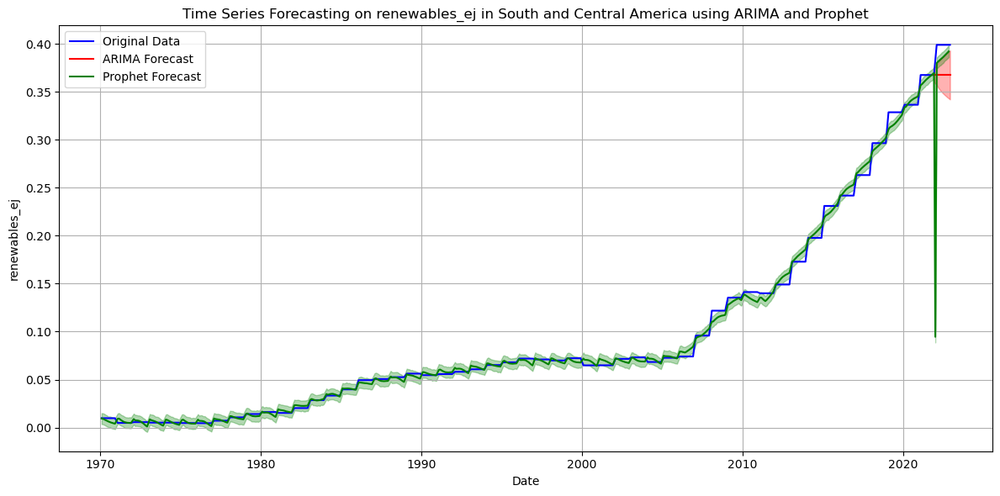

renewables_ej prediction performance metrics in South and Central America
------------------------------------------------------------
ARIMA MAE: 0.028793292996875067
Prophet MAE: 0.03646072470519084
ARIMA MSE: 0.0009044222417497035
Prophet MSE: 0.007874223006898993


In [172]:
Prophet_Arima_prediction(df_S_C_America,"renewables_ej","South and Central America")

## South and Central America solar_ej

01:58:21 - cmdstanpy - INFO - Chain [1] start processing
01:58:22 - cmdstanpy - INFO - Chain [1] done processing


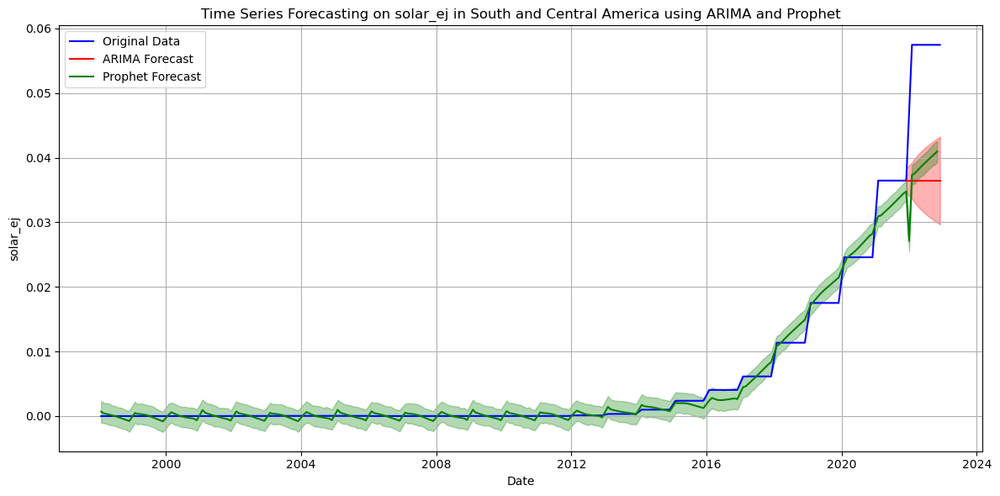

solar_ej prediction performance metrics in South and Central America
------------------------------------------------------------
ARIMA MAE: 0.019256192906041667
Prophet MAE: 0.01796520323072864
ARIMA MSE: 0.00040451014389238847
Prophet MSE: 0.0003589419047627355


In [173]:
Prophet_Arima_prediction(df_S_C_America,"solar_ej","South and Central America")

## South and Central America wind_ej

01:58:22 - cmdstanpy - INFO - Chain [1] start processing
01:58:22 - cmdstanpy - INFO - Chain [1] done processing


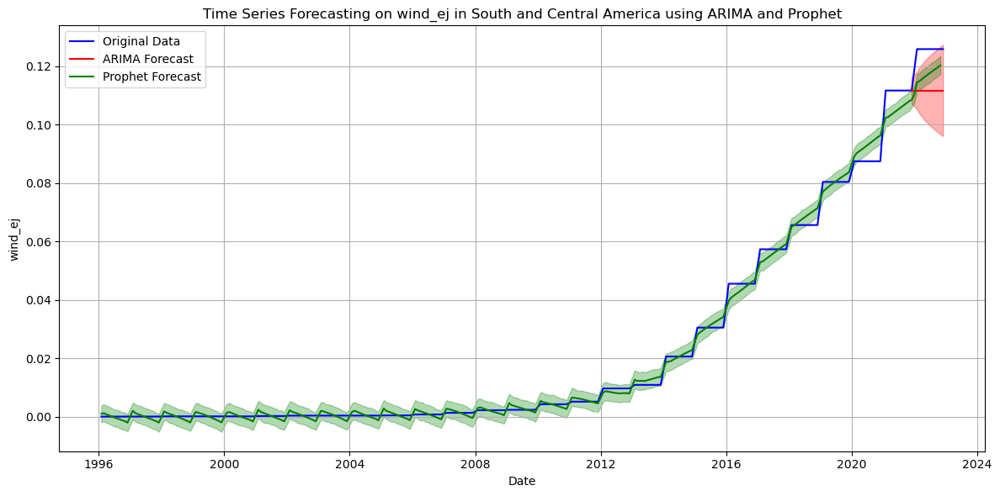

wind_ej prediction performance metrics in South and Central America
------------------------------------------------------------
ARIMA MAE: 0.01299645818567708
Prophet MAE: 0.008680315197832448
ARIMA MSE: 0.00018426319131496666
Prophet MSE: 8.491351781974434e-05


In [174]:
Prophet_Arima_prediction(df_S_C_America,"wind_ej","South and Central America")

## Population Trend in South and Central America

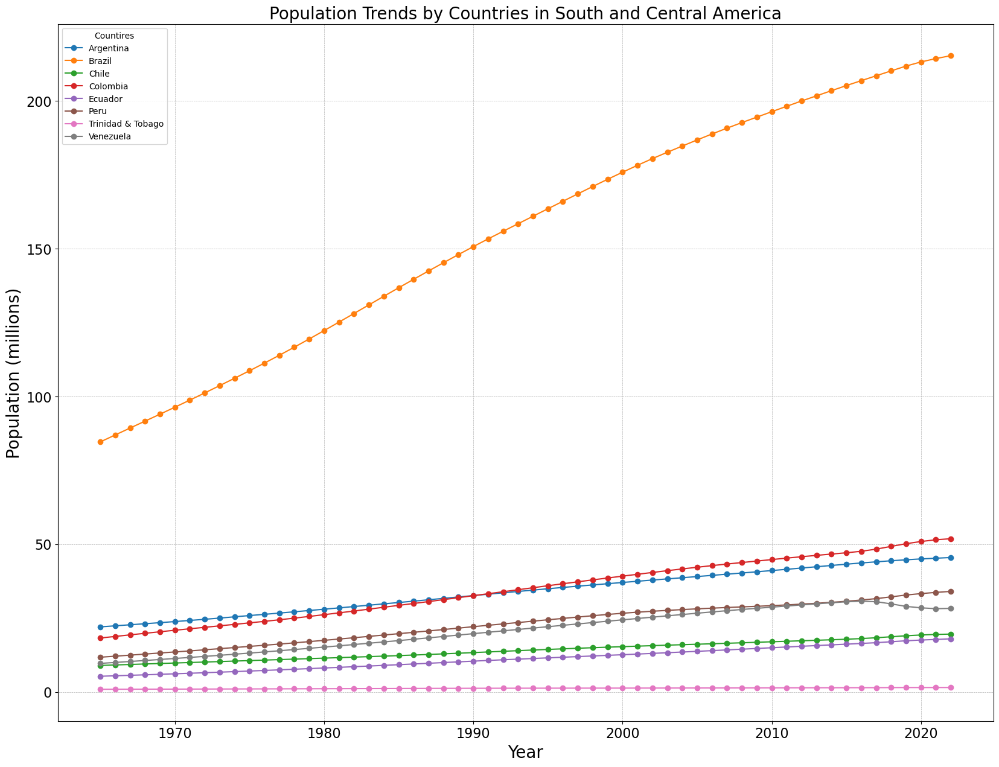

In [175]:
plt.figure(figsize=(20, 15))

# Group data by SubRegion and plot each group
for label, grp in df_S_C_America.groupby('Country'):
    plt.plot(grp['Year'], grp['pop'], marker='o', linestyle='-', label=label)

plt.title('Population Trends by Countries in South and Central America',fontsize=20)
plt.xlabel('Year',fontsize=20)
plt.ylabel('Population (millions)',fontsize=20)
plt.legend(title='Countires')
# Enhancing grid visibility
plt.grid(True, which='both', linestyle='--', linewidth=0.5)

# Increase the size of the tick labels on both axes
plt.tick_params(axis='both', which='major', labelsize=16)
plt.grid(True)
plt.show()

# Asia Pacific

In [176]:
df_Asia = df[df["Region"] == "Asia Pacific"]
df_Asia = df_Asia.dropna(subset=['pop'])

In [177]:
df_Asia.columns

Index(['Country', 'Year', 'pop', 'Region', 'SubRegion', 'OPEC', 'EU', 'OECD',
       'CIS', 'biogeo_ej', 'co2_combust_per_ej', 'coalcons_ej', 'coalprod_ej',
       'gascons_ej', 'gasprod_ej', 'hydro_ej', 'nuclear_ej', 'oilcons_ej',
       'primary_ej', 'primary_ej_pc', 'ren_power_ej', 'renewables_ej',
       'solar_ej', 'wind_ej', 'Group'],
      dtype='object')

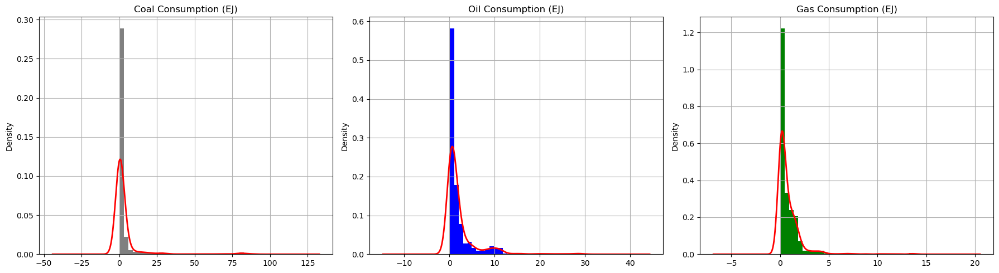

In [178]:
import matplotlib.pyplot as plt
import pandas as pd

column_keywords = ['coal', 'gas']
column_names = df_Africa.columns

# Filtering column names based on our keywords
consumption_columns = [name for name in column_names if any(keyword in name for keyword in column_keywords)]


# Plotting histograms and density plots with grid
fig, axes = plt.subplots(1, 3, figsize=(18, 5))
df_Asia['coalcons_ej'].dropna().plot(kind='hist', ax=axes[0], bins=30, color='gray', title='Coal Consumption (EJ)', density=True)
df_Asia['coalcons_ej'].dropna().plot(kind='kde', ax=axes[0], color='red', linewidth=2)
axes[0].grid(True)  # Apply grid

df_Asia['oilcons_ej'].dropna().plot(kind='hist', ax=axes[1], bins=30, color='blue', title='Oil Consumption (EJ)', density=True)
df_Asia['oilcons_ej'].dropna().plot(kind='kde', ax=axes[1], color='red', linewidth=2)
axes[1].grid(True)  # Apply grid

df_Asia['gascons_ej'].dropna().plot(kind='hist', ax=axes[2], bins=30, color='green', title='Gas Consumption (EJ)', density=True)
df_Asia['gascons_ej'].dropna().plot(kind='kde', ax=axes[2], color='red', linewidth=2)
axes[2].grid(True)  # Apply grid

plt.tight_layout()
plt.savefig("image2.png",dpi=300)
plt.show()


## Asia Pacific biogeo_ej

01:58:25 - cmdstanpy - INFO - Chain [1] start processing
01:58:26 - cmdstanpy - INFO - Chain [1] done processing


biogeo_ej prediction performance metrics in Asia Pacific
------------------------------------------------------------
ARIMA MAE: 0.005047447690476193
Prophet MAE: 0.01940435575903641
ARIMA MSE: 2.779279438701103e-05
Prophet MSE: 0.00041358724498758033


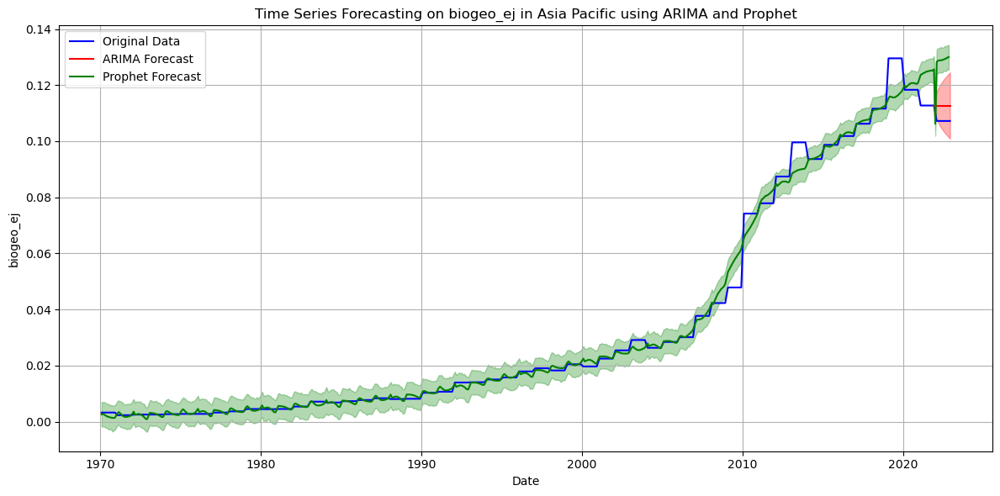

In [179]:
Prophet_Arima_prediction(df_S_C_America,"biogeo_ej","Asia Pacific")

## Asia Pacific co2_combust_per_ej

01:58:27 - cmdstanpy - INFO - Chain [1] start processing
01:58:27 - cmdstanpy - INFO - Chain [1] done processing


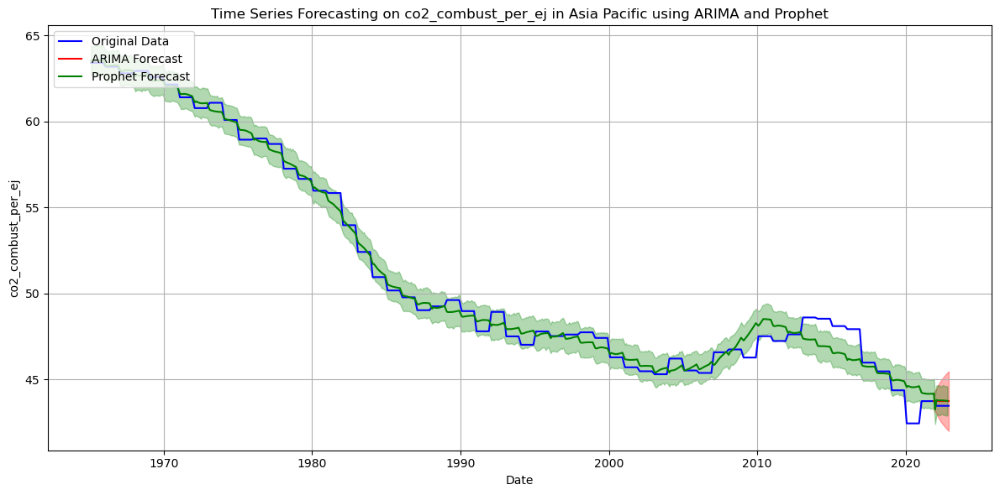

co2_combust_per_ej prediction performance metrics in Asia Pacific
------------------------------------------------------------
ARIMA MAE: 0.25067000520833105
Prophet MAE: 0.31575562438484717
ARIMA MSE: 0.06854776528488514
Prophet MSE: 0.10191243468242715


In [180]:
Prophet_Arima_prediction(df_S_C_America,"co2_combust_per_ej","Asia Pacific")

## Asia Pacific coalcons_ej

01:58:28 - cmdstanpy - INFO - Chain [1] start processing
01:58:28 - cmdstanpy - INFO - Chain [1] done processing


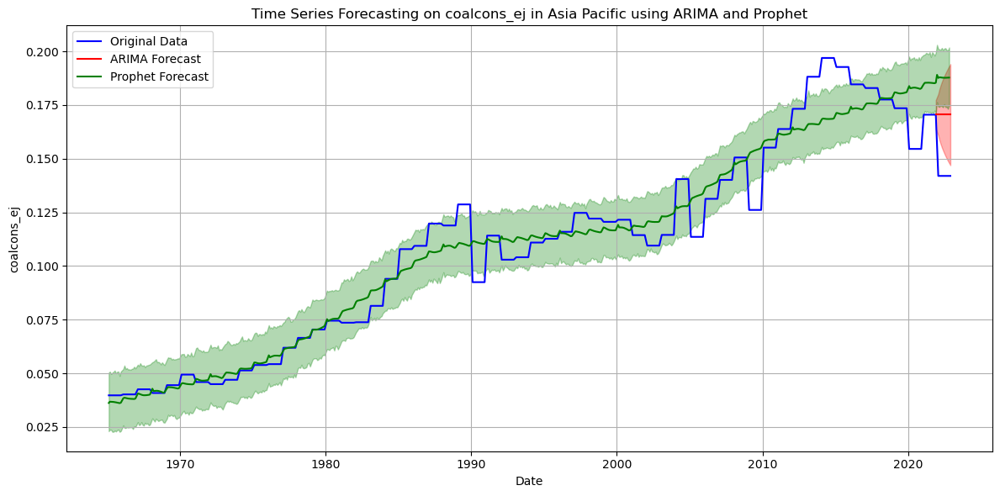

coalcons_ej prediction performance metrics in Asia Pacific
------------------------------------------------------------
ARIMA MAE: 0.026145138511904795
Prophet MAE: 0.04330818514937886
ARIMA MSE: 0.0007457108376072953
Prophet MSE: 0.0019490223804469453


In [181]:
Prophet_Arima_prediction(df_S_C_America,"coalcons_ej","Asia Pacific")

## Asia Pacific coalprod_ej

01:58:29 - cmdstanpy - INFO - Chain [1] start processing
01:58:29 - cmdstanpy - INFO - Chain [1] done processing


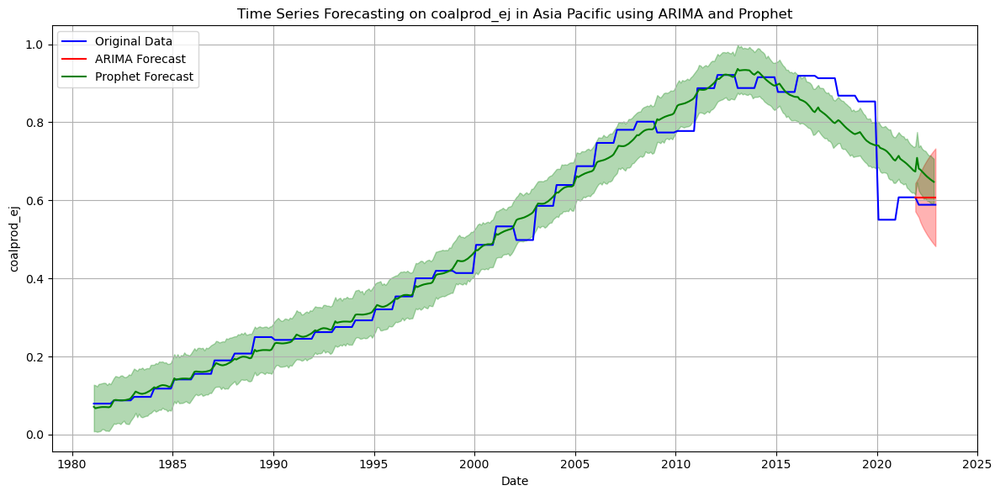

coalprod_ej prediction performance metrics in Asia Pacific
------------------------------------------------------------
ARIMA MAE: 0.01747596063888886
Prophet MAE: 0.07813687085677466
ARIMA MSE: 0.000333173673002174
Prophet MSE: 0.006379022604640056


In [182]:
Prophet_Arima_prediction(df_S_C_America,"coalprod_ej","Asia Pacific")

## Asia Pacific gascons_ej

01:58:30 - cmdstanpy - INFO - Chain [1] start processing
01:58:30 - cmdstanpy - INFO - Chain [1] done processing


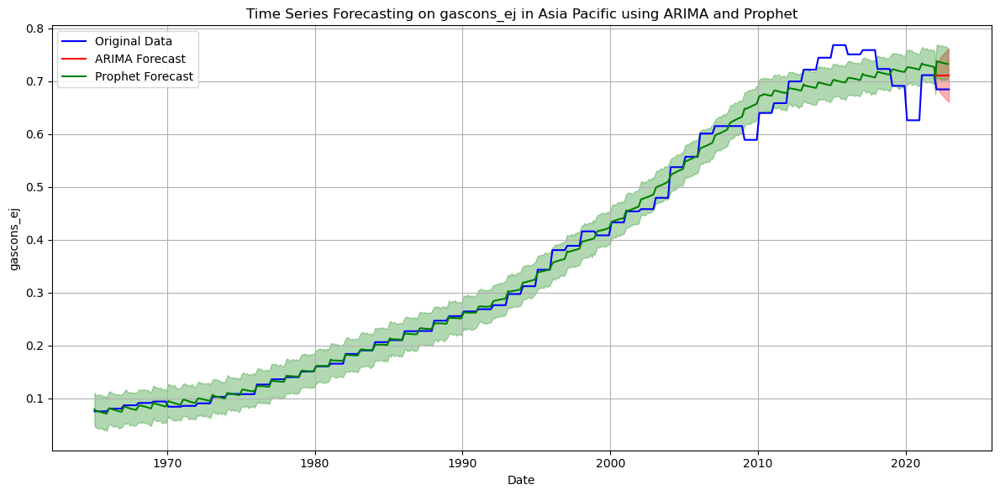

gascons_ej prediction performance metrics in Asia Pacific
------------------------------------------------------------
ARIMA MAE: 0.024670142062499994
Prophet MAE: 0.045230973778371104
ARIMA MSE: 0.0006639446284188343
Prophet MSE: 0.002191140695886474


In [183]:
Prophet_Arima_prediction(df_S_C_America,"gascons_ej","Asia Pacific")

## Asia Pacific gasprod_ej

01:58:31 - cmdstanpy - INFO - Chain [1] start processing
01:58:31 - cmdstanpy - INFO - Chain [1] done processing


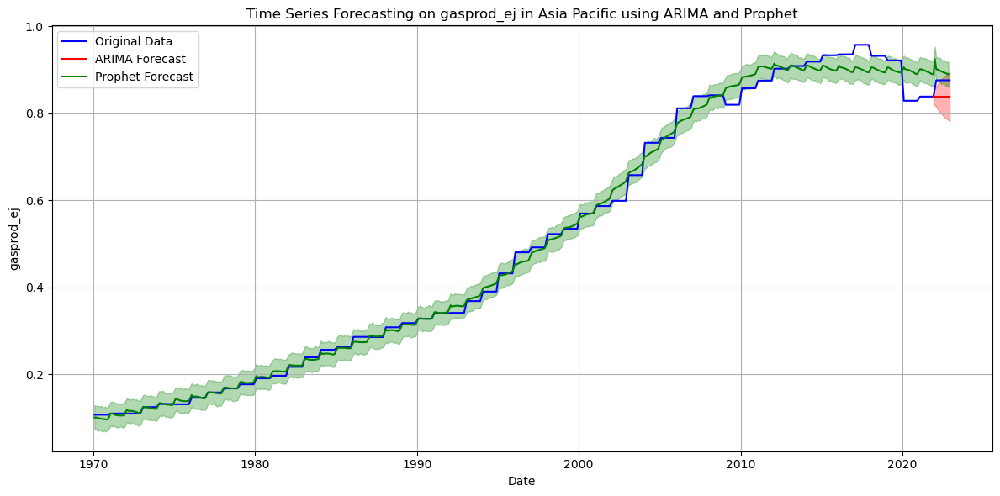

gasprod_ej prediction performance metrics in Asia Pacific
------------------------------------------------------------
ARIMA MAE: 0.03424761618055561
Prophet MAE: 0.024801192571411806
ARIMA MSE: 0.0012795264153279864
Prophet MSE: 0.0007569701293215538


In [184]:
Prophet_Arima_prediction(df_S_C_America,"gasprod_ej","Asia Pacific")

## Asia Pacific hydro_ej

01:58:32 - cmdstanpy - INFO - Chain [1] start processing
01:58:33 - cmdstanpy - INFO - Chain [1] done processing


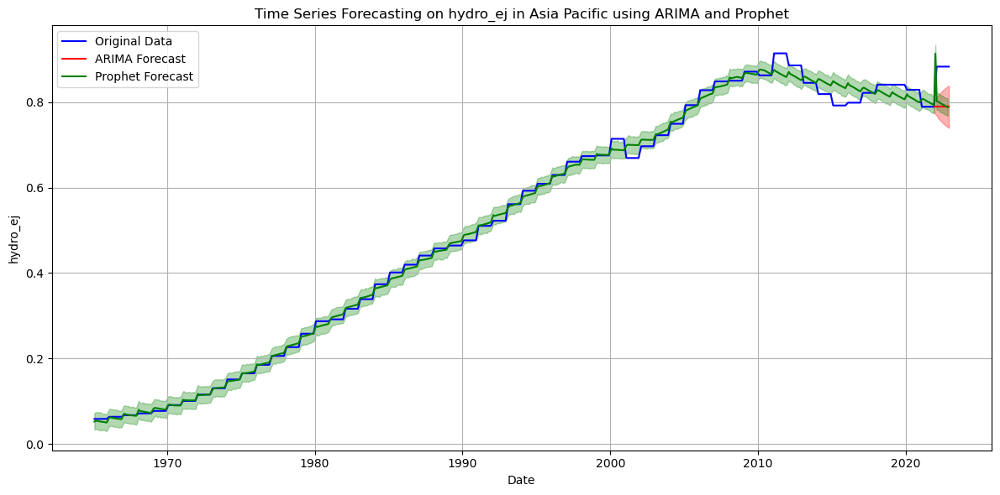

hydro_ej prediction performance metrics in Asia Pacific
------------------------------------------------------------
ARIMA MAE: 0.08611542958333329
Prophet MAE: 0.0759966710044984
ARIMA MSE: 0.008090036958896764
Prophet MSE: 0.006518650118796759


In [185]:
Prophet_Arima_prediction(df_S_C_America,"hydro_ej","Asia Pacific")

## Asia Pacific nuclear_ej

01:58:34 - cmdstanpy - INFO - Chain [1] start processing
01:58:34 - cmdstanpy - INFO - Chain [1] done processing


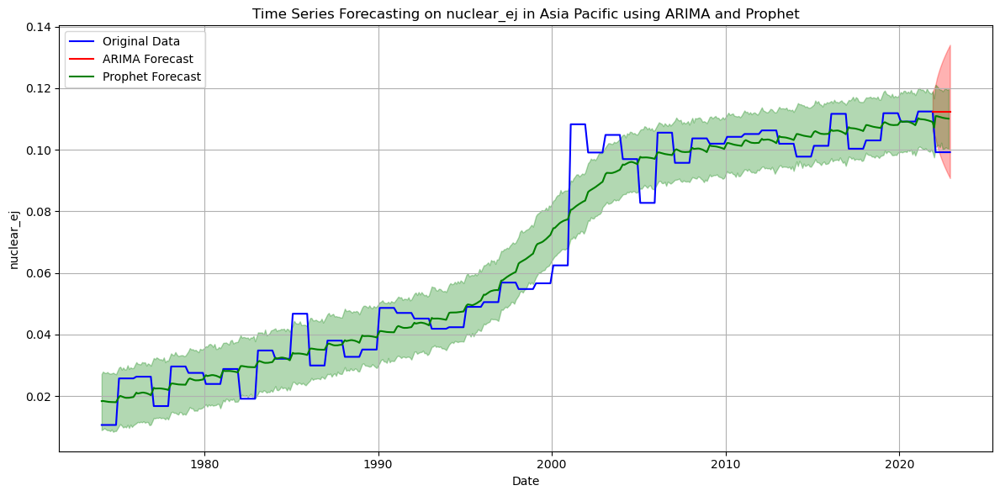

nuclear_ej prediction performance metrics in Asia Pacific
------------------------------------------------------------
ARIMA MAE: 0.012124604250000004
Prophet MAE: 0.010360266046403771
ARIMA MSE: 0.00016037021260267433
Prophet MSE: 0.00011259519741046775


In [186]:
Prophet_Arima_prediction(df_S_C_America,"nuclear_ej","Asia Pacific")

## Asia Pacific oilcons_ej

01:58:35 - cmdstanpy - INFO - Chain [1] start processing
01:58:35 - cmdstanpy - INFO - Chain [1] done processing


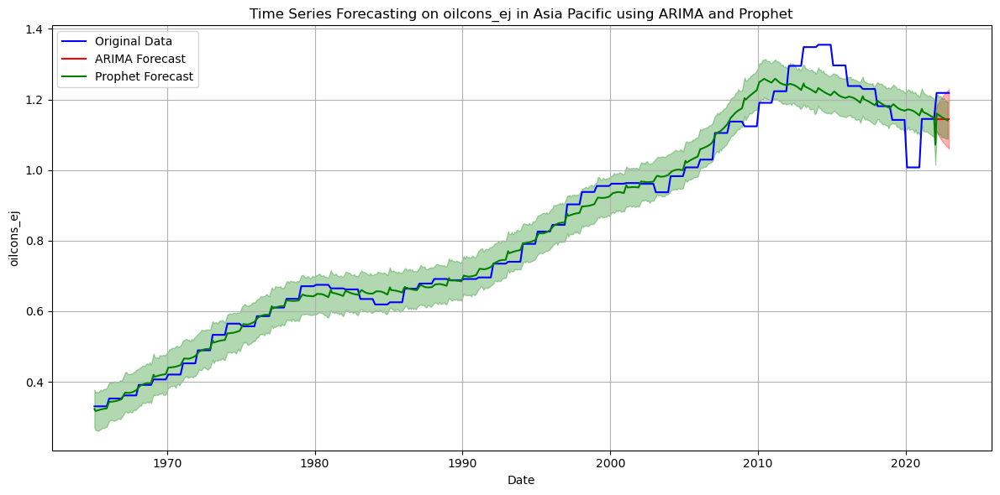

oilcons_ej prediction performance metrics in Asia Pacific
------------------------------------------------------------
ARIMA MAE: 0.06757763271874995
Prophet MAE: 0.06951839275412303
ARIMA MSE: 0.004981894302403924
Prophet MSE: 0.0057370932491509164


In [187]:
Prophet_Arima_prediction(df_S_C_America,"oilcons_ej","Asia Pacific")

## Asia Pacific primary_ej

01:58:36 - cmdstanpy - INFO - Chain [1] start processing
01:58:36 - cmdstanpy - INFO - Chain [1] done processing


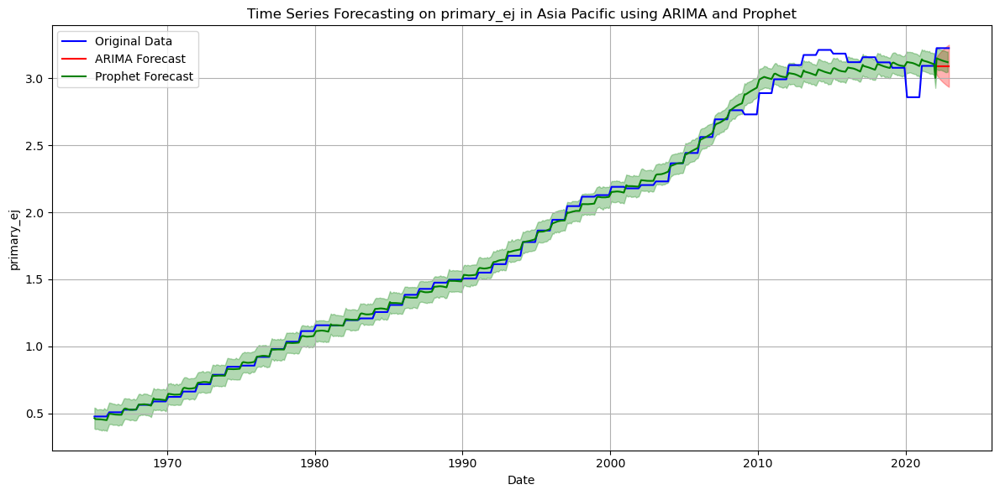

primary_ej prediction performance metrics in Asia Pacific
------------------------------------------------------------
ARIMA MAE: 0.12114363731250037
Prophet MAE: 0.0956219284624014
ARIMA MSE: 0.016009942757784692
Prophet MSE: 0.011151889242715722


In [188]:
Prophet_Arima_prediction(df_S_C_America,"primary_ej","Asia Pacific")

## Asia Pacific primary_ej_pc

01:58:37 - cmdstanpy - INFO - Chain [1] start processing
01:58:37 - cmdstanpy - INFO - Chain [1] done processing


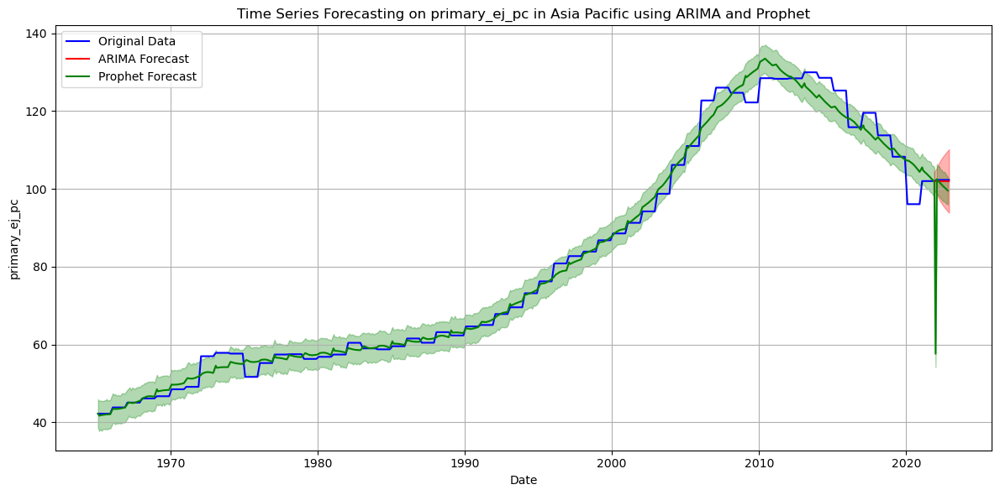

primary_ej_pc prediction performance metrics in Asia Pacific
------------------------------------------------------------
ARIMA MAE: 0.2673190540624937
Prophet MAE: 4.883759175679214
ARIMA MSE: 0.07795579272530882
Prophet MSE: 168.7083162212145


In [189]:
Prophet_Arima_prediction(df_S_C_America,"primary_ej_pc","Asia Pacific")

## Asia Pacific ren_power_ej

01:58:38 - cmdstanpy - INFO - Chain [1] start processing
01:58:38 - cmdstanpy - INFO - Chain [1] done processing


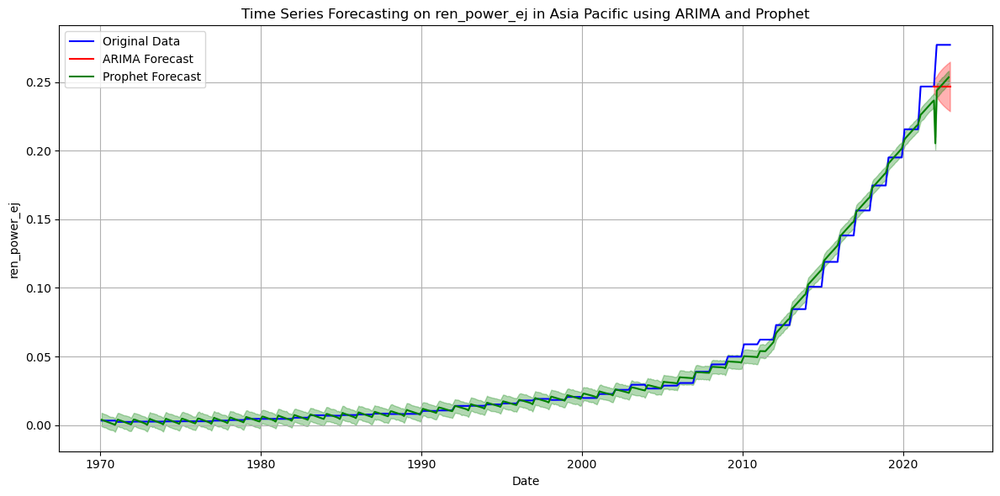

ren_power_ej prediction performance metrics in Asia Pacific
------------------------------------------------------------
ARIMA MAE: 0.027836153090624982
Prophet MAE: 0.03061296527820334
ARIMA MSE: 0.0008452924569651387
Prophet MSE: 0.0011248148046564411


In [190]:
Prophet_Arima_prediction(df_S_C_America,"ren_power_ej","Asia Pacific")

## Asia Pacific renewables_ej

01:58:39 - cmdstanpy - INFO - Chain [1] start processing
01:58:39 - cmdstanpy - INFO - Chain [1] done processing


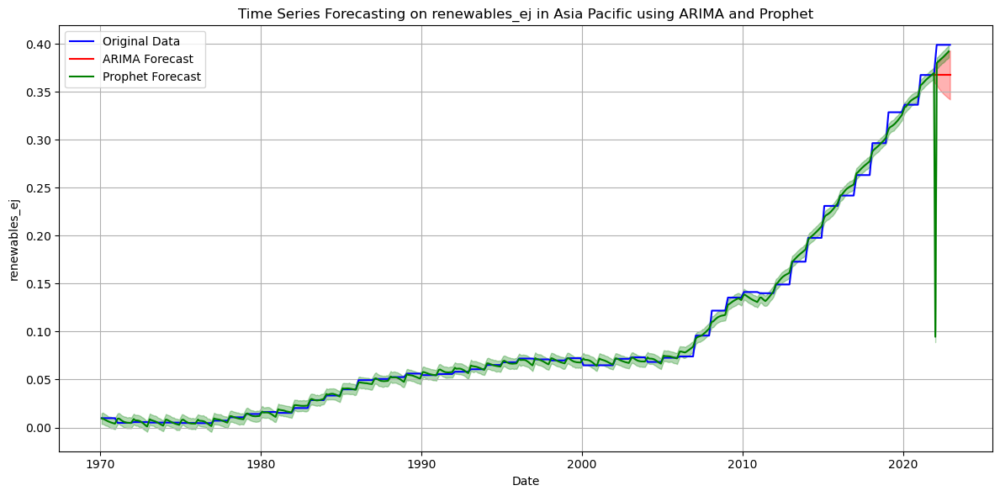

renewables_ej prediction performance metrics in Asia Pacific
------------------------------------------------------------
ARIMA MAE: 0.028793292996875067
Prophet MAE: 0.03646072470519084
ARIMA MSE: 0.0009044222417497035
Prophet MSE: 0.007874223006898993


In [191]:
Prophet_Arima_prediction(df_S_C_America,"renewables_ej","Asia Pacific")

## Asia Pacific solar_ej

01:58:40 - cmdstanpy - INFO - Chain [1] start processing
01:58:40 - cmdstanpy - INFO - Chain [1] done processing


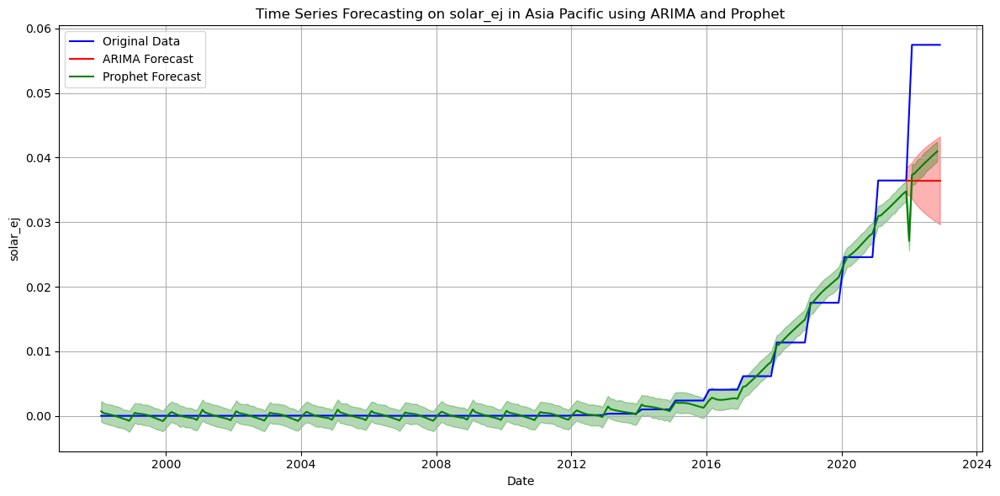

solar_ej prediction performance metrics in Asia Pacific
------------------------------------------------------------
ARIMA MAE: 0.019256192906041667
Prophet MAE: 0.01796520323072864
ARIMA MSE: 0.00040451014389238847
Prophet MSE: 0.0003589419047627355


In [192]:
Prophet_Arima_prediction(df_S_C_America,"solar_ej","Asia Pacific")

## Asia Pacific wind_ej

01:58:41 - cmdstanpy - INFO - Chain [1] start processing
01:58:41 - cmdstanpy - INFO - Chain [1] done processing


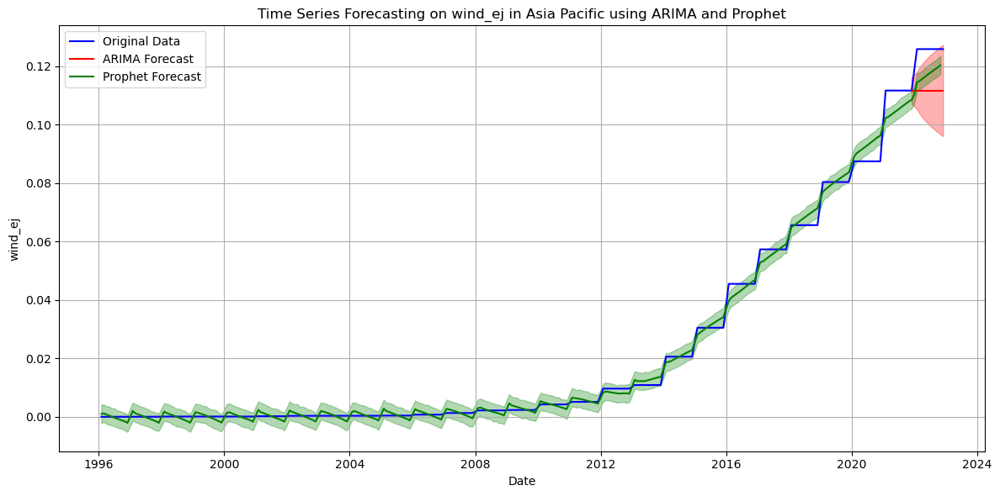

wind_ej prediction performance metrics in Asia Pacific
------------------------------------------------------------
ARIMA MAE: 0.01299645818567708
Prophet MAE: 0.008680315197832448
ARIMA MSE: 0.00018426319131496666
Prophet MSE: 8.491351781974434e-05


In [193]:
Prophet_Arima_prediction(df_S_C_America,"wind_ej","Asia Pacific")

## Population Trend in Asia Pacific

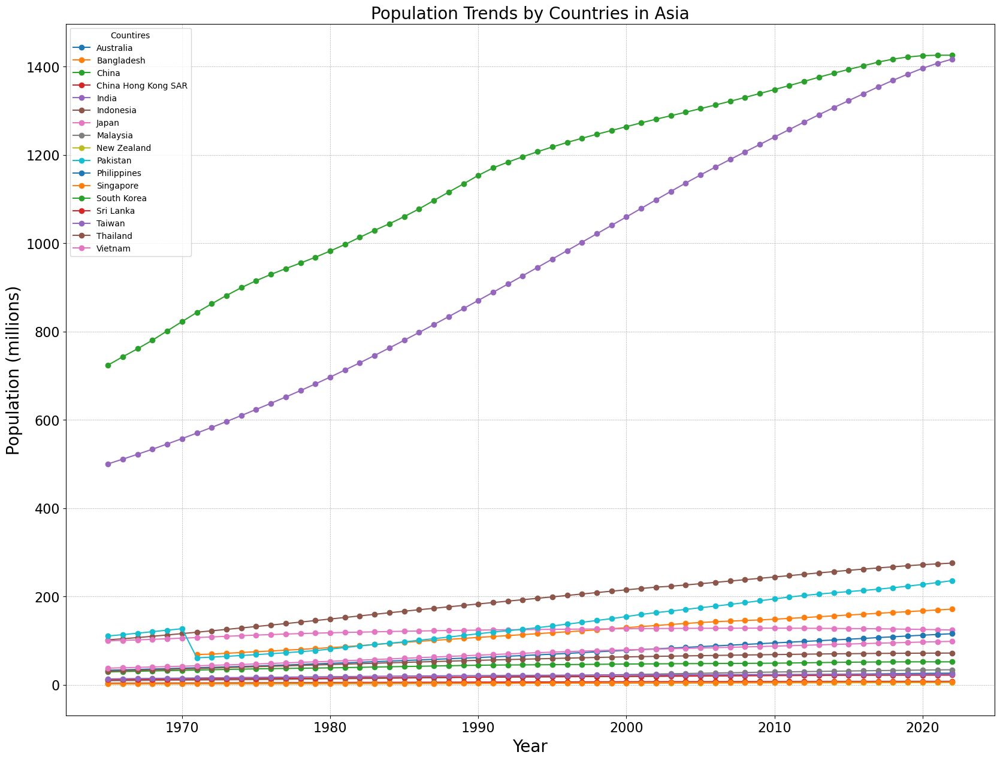

In [194]:
plt.figure(figsize=(20, 15))

# Group data by SubRegion and plot each group
for label, grp in df_Asia.groupby('Country'):
    plt.plot(grp['Year'], grp['pop'], marker='o', linestyle='-', label=label)

plt.title('Population Trends by Countries in Asia',fontsize=20)
plt.xlabel('Year',fontsize=20)
plt.ylabel('Population (millions)',fontsize=20)
plt.legend(title='Countires')
# Enhancing grid visibility
plt.grid(True, which='both', linestyle='--', linewidth=0.5)

# Increase the size of the tick labels on both axes
plt.tick_params(axis='both', which='major', labelsize=16)
plt.grid(True)
plt.show()

# Commonwealth of Independent States

###       ------------------   NO Data Available for this Continent ------------------------

# Middle East

In [195]:
df_Middle_East = df[df["Region"] == "Middle East"]
df_Middle_East = df_Middle_East.dropna(subset=['pop'])

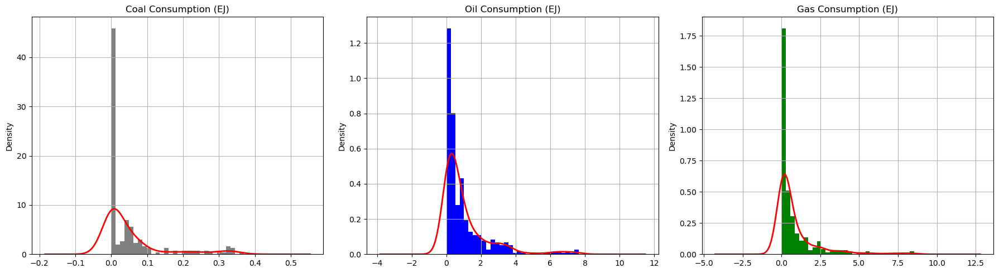

In [196]:
import matplotlib.pyplot as plt
import pandas as pd

column_keywords = ['coal', 'gas']
column_names = df_Africa.columns

# Filtering column names based on our keywords
consumption_columns = [name for name in column_names if any(keyword in name for keyword in column_keywords)]


# Plotting histograms and density plots with grid
fig, axes = plt.subplots(1, 3, figsize=(18, 5))
df_Middle_East['coalcons_ej'].dropna().plot(kind='hist', ax=axes[0], bins=30, color='gray', title='Coal Consumption (EJ)', density=True)
df_Middle_East['coalcons_ej'].dropna().plot(kind='kde', ax=axes[0], color='red', linewidth=2)
axes[0].grid(True)  # Apply grid

df_Middle_East['oilcons_ej'].dropna().plot(kind='hist', ax=axes[1], bins=30, color='blue', title='Oil Consumption (EJ)', density=True)
df_Middle_East['oilcons_ej'].dropna().plot(kind='kde', ax=axes[1], color='red', linewidth=2)
axes[1].grid(True)  # Apply grid

df_Middle_East['gascons_ej'].dropna().plot(kind='hist', ax=axes[2], bins=30, color='green', title='Gas Consumption (EJ)', density=True)
df_Middle_East['gascons_ej'].dropna().plot(kind='kde', ax=axes[2], color='red', linewidth=2)
axes[2].grid(True)  # Apply grid

plt.tight_layout()
plt.savefig("image3.png",dpi=300)
plt.show()


In [197]:
df_Middle_East.columns

Index(['Country', 'Year', 'pop', 'Region', 'SubRegion', 'OPEC', 'EU', 'OECD',
       'CIS', 'biogeo_ej', 'co2_combust_per_ej', 'coalcons_ej', 'coalprod_ej',
       'gascons_ej', 'gasprod_ej', 'hydro_ej', 'nuclear_ej', 'oilcons_ej',
       'primary_ej', 'primary_ej_pc', 'ren_power_ej', 'renewables_ej',
       'solar_ej', 'wind_ej', 'Group'],
      dtype='object')

## Middle East States biogeo_ej

01:58:44 - cmdstanpy - INFO - Chain [1] start processing
01:58:44 - cmdstanpy - INFO - Chain [1] done processing


biogeo_ej prediction performance metrics in Middle East
------------------------------------------------------------
ARIMA MAE: 1.82105e-05
Prophet MAE: 0.00010254659522767903
ARIMA MSE: 3.6176979300000006e-10
Prophet MSE: 1.1634233682705088e-08


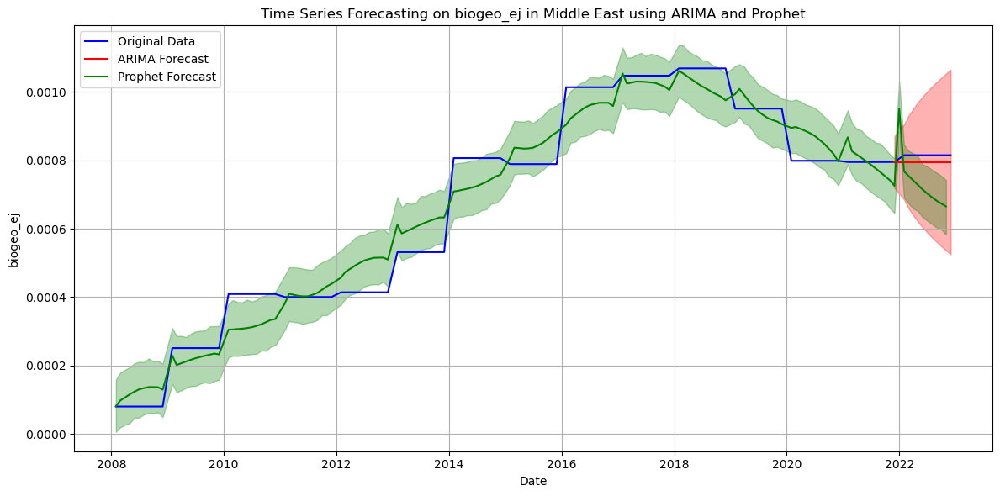

In [198]:
Prophet_Arima_prediction(df_Middle_East,"biogeo_ej","Middle East")

## Middle East co2_combust_per_ej

01:58:45 - cmdstanpy - INFO - Chain [1] start processing
01:58:46 - cmdstanpy - INFO - Chain [1] done processing


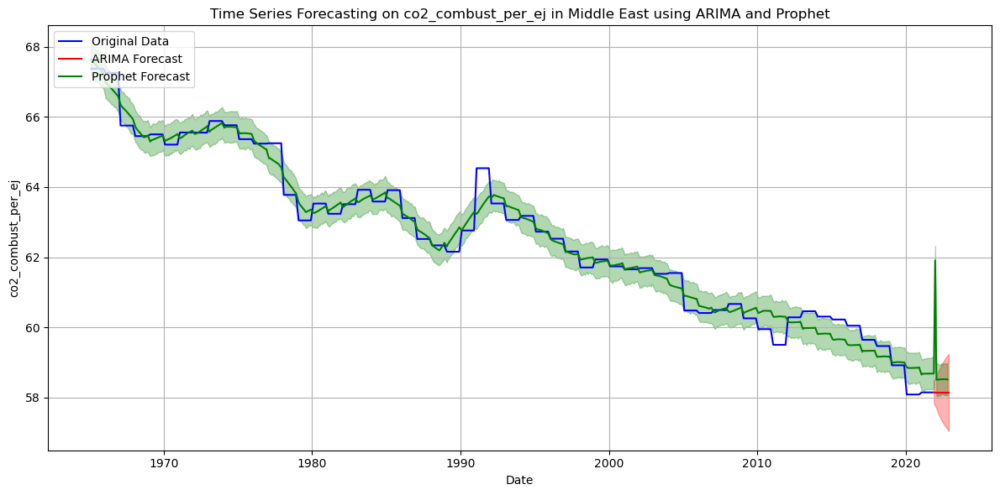

co2_combust_per_ej prediction performance metrics in Middle East
------------------------------------------------------------
ARIMA MAE: 0.007857450104165054
Prophet MAE: 0.6758743164332461
ARIMA MSE: 6.73522059703019e-05
Prophet MSE: 1.3308710108598483


In [199]:
Prophet_Arima_prediction(df_Middle_East,"co2_combust_per_ej","Middle East")

## Middle East coalcons_ej

01:58:47 - cmdstanpy - INFO - Chain [1] start processing
01:58:47 - cmdstanpy - INFO - Chain [1] done processing


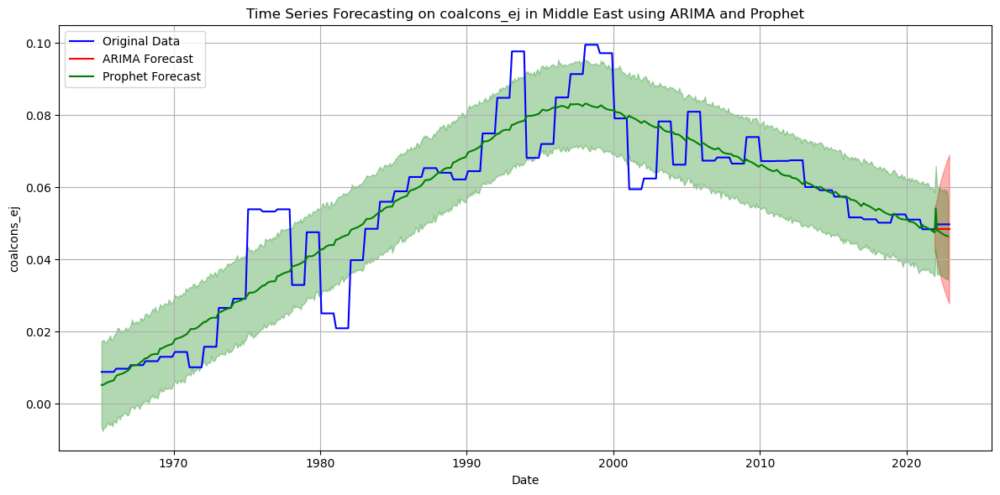

coalcons_ej prediction performance metrics in Middle East
------------------------------------------------------------
ARIMA MAE: 0.0012499881428571502
Prophet MAE: 0.002582034300072523
ARIMA MSE: 1.70451311703651e-06
Prophet MSE: 7.4307655542111715e-06


In [200]:
Prophet_Arima_prediction(df_Middle_East,"coalcons_ej","Middle East")

## Middle East coalprod_ej

###       ------------------   NO Data Available  ------------------------

## Middle East gascons_ej

01:58:48 - cmdstanpy - INFO - Chain [1] start processing
01:58:48 - cmdstanpy - INFO - Chain [1] done processing


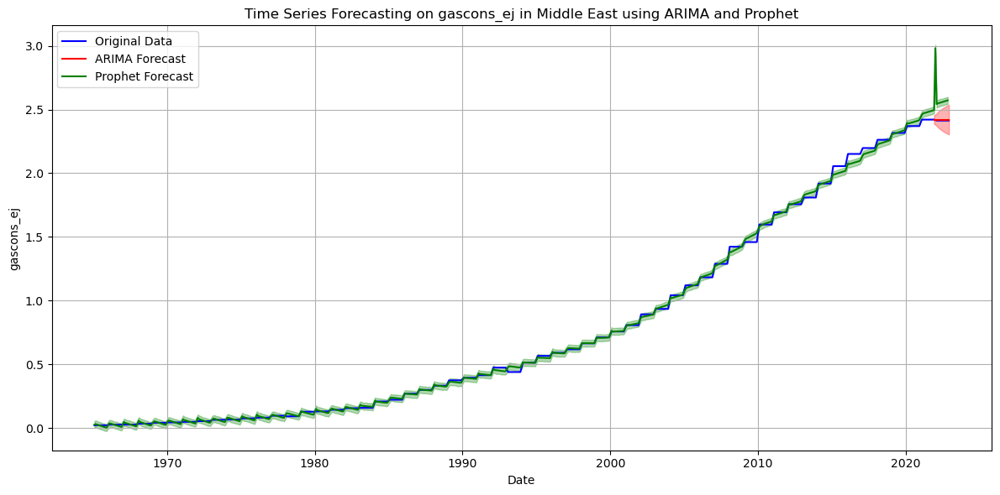

gascons_ej prediction performance metrics in Middle East
------------------------------------------------------------
ARIMA MAE: 0.006868245770833263
Prophet MAE: 0.17455450932230435
ARIMA MSE: 5.1461236329348e-05
Prophet MSE: 0.045027108811544814


In [201]:
Prophet_Arima_prediction(df_Middle_East,"gascons_ej","Middle East")

## Middle East gasprod_ej

01:58:49 - cmdstanpy - INFO - Chain [1] start processing
01:58:50 - cmdstanpy - INFO - Chain [1] done processing


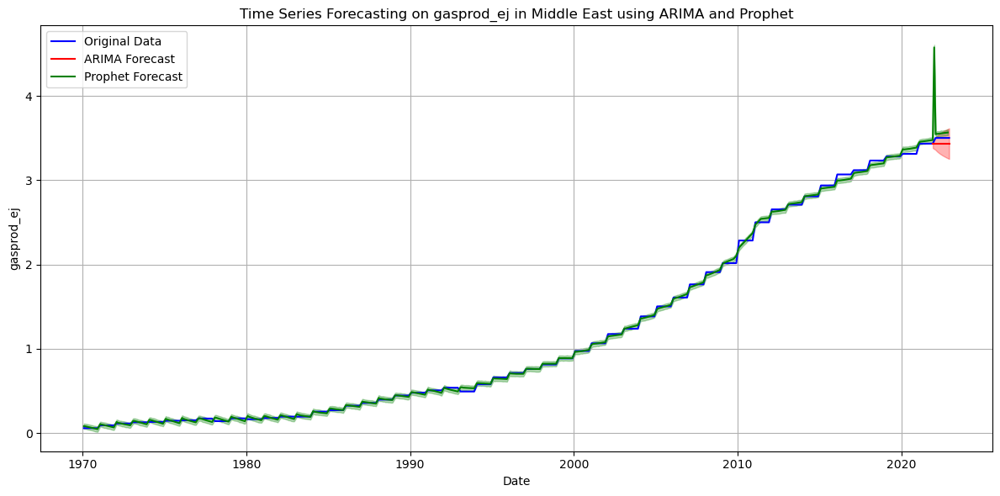

gasprod_ej prediction performance metrics in Middle East
------------------------------------------------------------
ARIMA MAE: 0.062077900499999505
Prophet MAE: 0.13892392147111154
ARIMA MSE: 0.004203998978714007
Prophet MSE: 0.0989700436570209


In [202]:
Prophet_Arima_prediction(df_Middle_East,"gasprod_ej","Middle East")

## Middle East hydro_ej

01:58:51 - cmdstanpy - INFO - Chain [1] start processing
01:58:51 - cmdstanpy - INFO - Chain [1] done processing


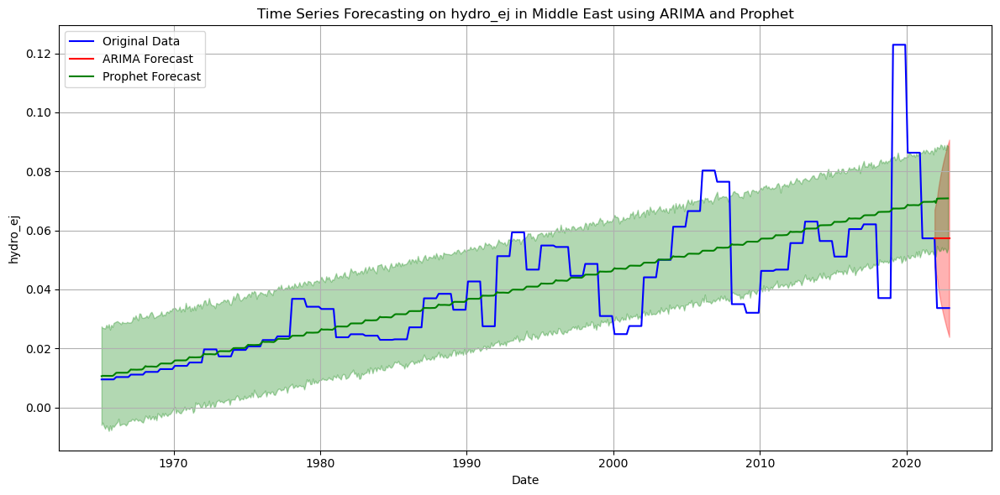

hydro_ej prediction performance metrics in Middle East
------------------------------------------------------------
ARIMA MAE: 0.02164856252777778
Prophet MAE: 0.03495350518782406
ARIMA MSE: 0.0005112657376572046
Prophet MSE: 0.001267233524116594


In [203]:
Prophet_Arima_prediction(df_Middle_East,"hydro_ej","Middle East")

## Middle East nuclear_ej

01:58:52 - cmdstanpy - INFO - Chain [1] start processing
01:58:52 - cmdstanpy - INFO - Chain [1] done processing


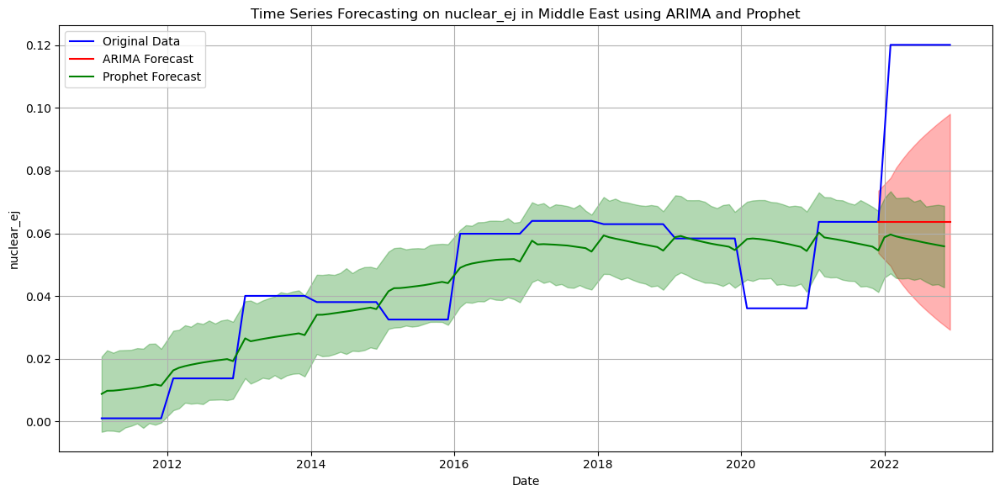

nuclear_ej prediction performance metrics in Middle East
------------------------------------------------------------
ARIMA MAE: 0.051741712000000016
Prophet MAE: 0.05794432817967473
ARIMA MSE: 0.0029205870116628487
Prophet MSE: 0.0035755870346792537


In [204]:
Prophet_Arima_prediction(df_Middle_East,"nuclear_ej","Middle East")

## Middle East oilcons_ej

01:58:52 - cmdstanpy - INFO - Chain [1] start processing
01:58:52 - cmdstanpy - INFO - Chain [1] done processing


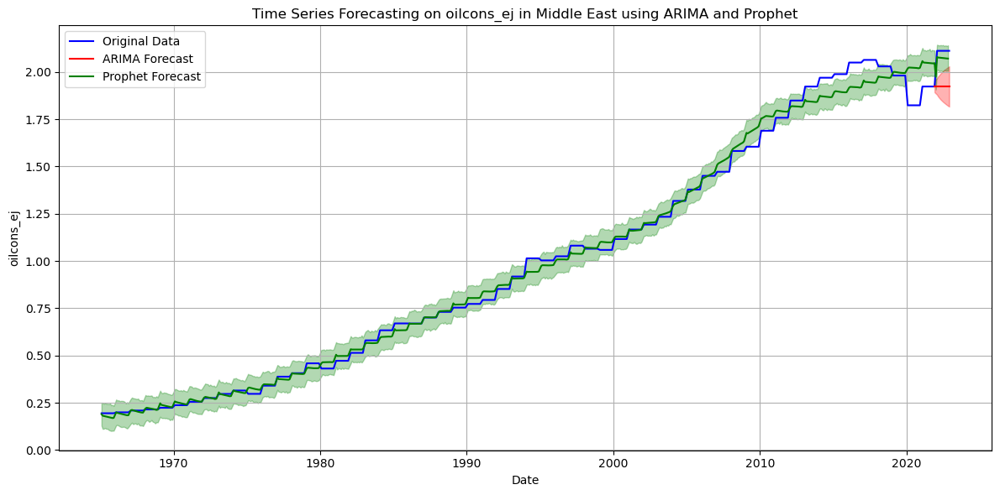

oilcons_ej prediction performance metrics in Middle East
------------------------------------------------------------
ARIMA MAE: 0.17305685226041664
Prophet MAE: 0.05337350854637187
ARIMA MSE: 0.03267128085194581
Prophet MSE: 0.004060586478210432


In [205]:
Prophet_Arima_prediction(df_Middle_East,"oilcons_ej","Middle East")

## Middle East primary_ej

01:58:53 - cmdstanpy - INFO - Chain [1] start processing
01:58:54 - cmdstanpy - INFO - Chain [1] done processing


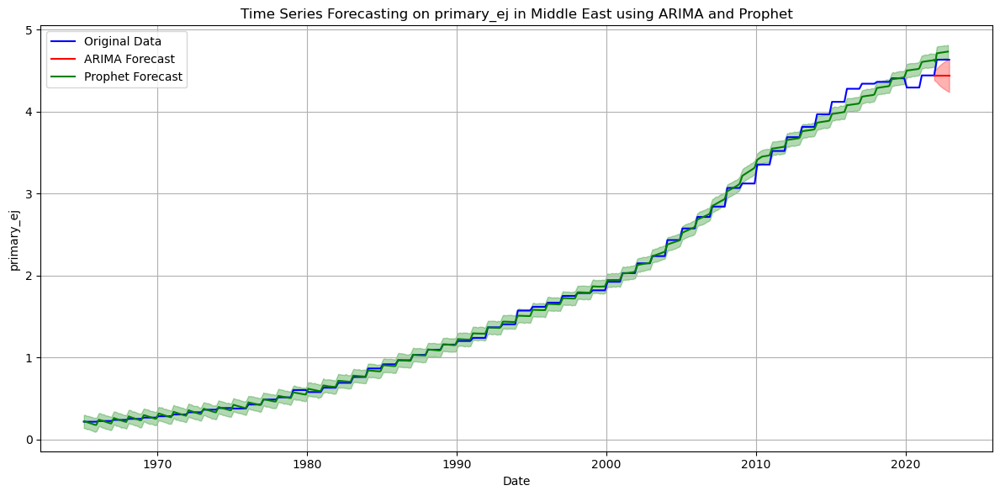

primary_ej prediction performance metrics in Middle East
------------------------------------------------------------
ARIMA MAE: 0.1761189963958328
Prophet MAE: 0.09169942316761952
ARIMA MSE: 0.033837710063427666
Prophet MSE: 0.009624003507310476


In [206]:
Prophet_Arima_prediction(df_Middle_East,"primary_ej","Middle East")

## Middle East primary_ej_pc

01:58:54 - cmdstanpy - INFO - Chain [1] start processing
01:58:55 - cmdstanpy - INFO - Chain [1] done processing


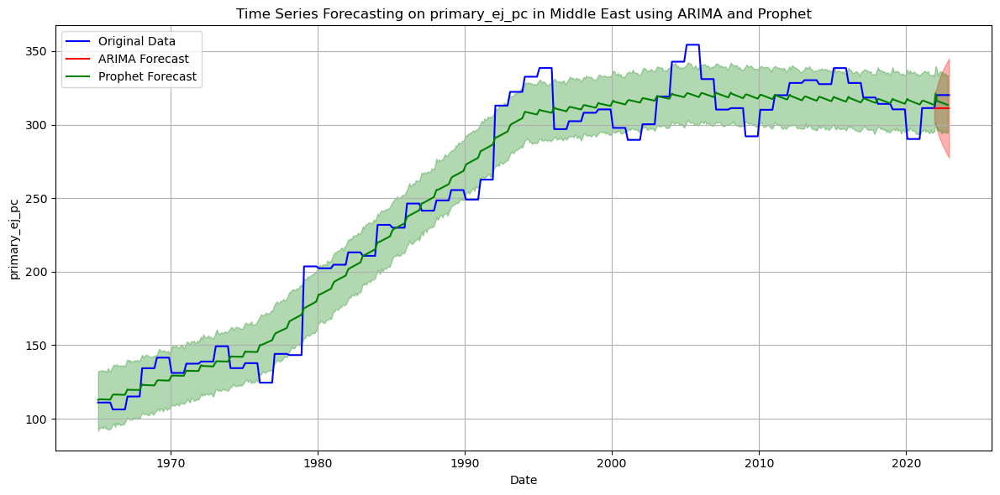

primary_ej_pc prediction performance metrics in Middle East
------------------------------------------------------------
ARIMA MAE: 8.10619708822916
Prophet MAE: 4.696151452814561
ARIMA MSE: 71.68410679987083
Prophet MSE: 24.7500486041984


In [207]:
Prophet_Arima_prediction(df_Middle_East,"primary_ej_pc","Middle East")

## Middle East ren_power_ej

01:58:55 - cmdstanpy - INFO - Chain [1] start processing
01:58:55 - cmdstanpy - INFO - Chain [1] done processing


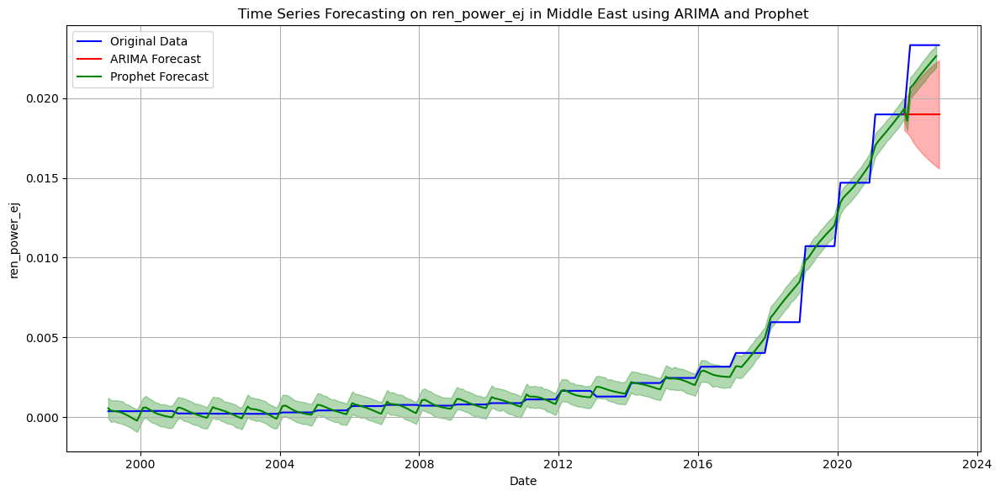

ren_power_ej prediction performance metrics in Middle East
------------------------------------------------------------
ARIMA MAE: 0.003980716552083332
Prophet MAE: 0.0018309119054860995
ARIMA MSE: 1.7286659201487504e-05
Prophet MSE: 4.613281070106272e-06


In [208]:
Prophet_Arima_prediction(df_Middle_East,"ren_power_ej","Middle East")

## Middle East renewables_ej

01:58:56 - cmdstanpy - INFO - Chain [1] start processing
01:58:56 - cmdstanpy - INFO - Chain [1] done processing


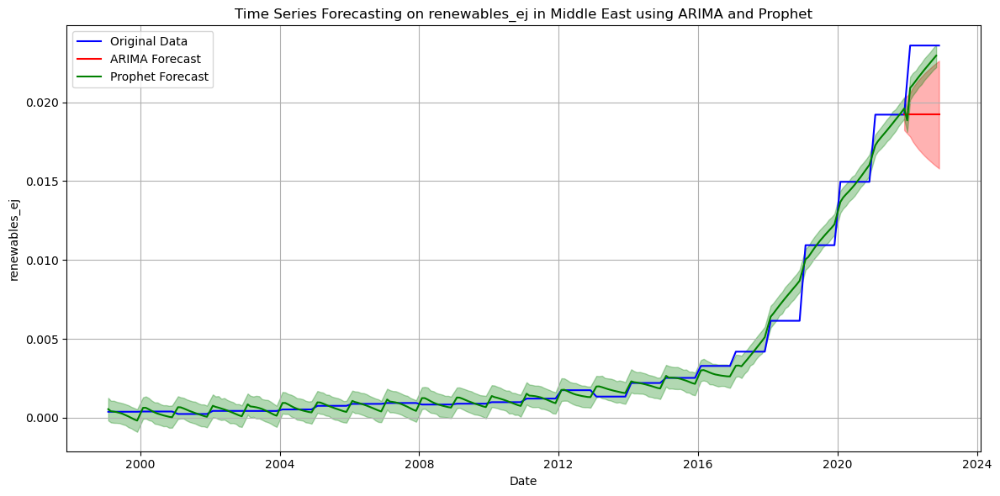

renewables_ej prediction performance metrics in Middle East
------------------------------------------------------------
ARIMA MAE: 0.004019433802083332
Prophet MAE: 0.0018104644468692139
ARIMA MSE: 1.762456155199644e-05
Prophet MSE: 4.5479257344382435e-06


In [209]:
Prophet_Arima_prediction(df_Middle_East,"renewables_ej","Middle East")

## Middle East solar_ej

01:58:57 - cmdstanpy - INFO - Chain [1] start processing
01:58:57 - cmdstanpy - INFO - Chain [1] done processing


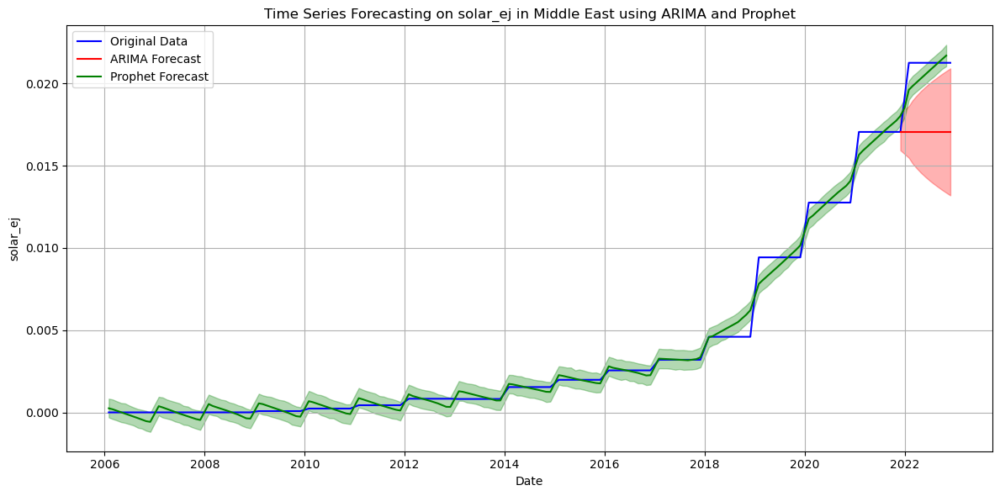

solar_ej prediction performance metrics in Middle East
------------------------------------------------------------
ARIMA MAE: 0.0038520556364583357
Prophet MAE: 0.0009142623616914678
ARIMA MSE: 1.6187271956040474e-05
Prophet MSE: 1.364594710381055e-06


In [210]:
Prophet_Arima_prediction(df_Middle_East,"solar_ej","Middle East")

## Middle East wind_ej

01:58:58 - cmdstanpy - INFO - Chain [1] start processing
01:58:58 - cmdstanpy - INFO - Chain [1] done processing


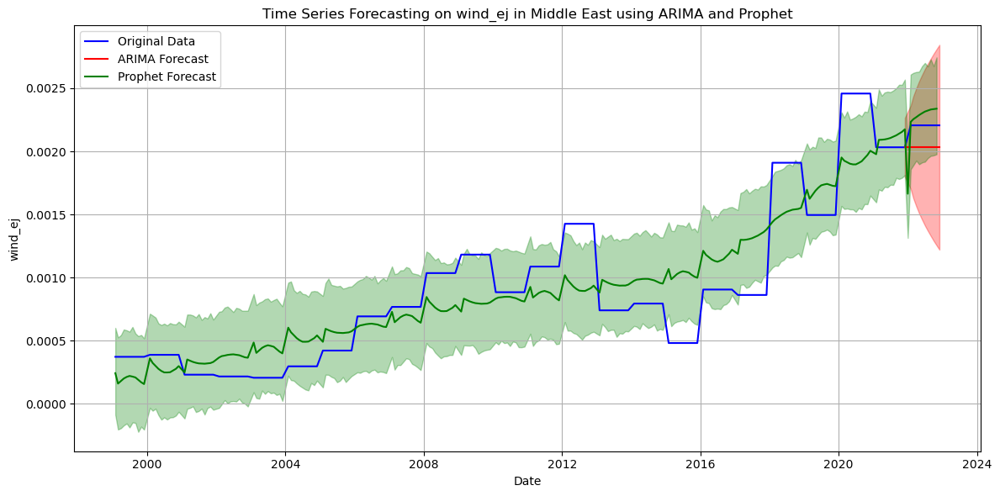

wind_ej prediction performance metrics in Middle East
------------------------------------------------------------
ARIMA MAE: 0.00015940957908333337
Prophet MAE: 0.00013471023372250155
ARIMA MSE: 2.772154244020965e-08
Prophet MSE: 3.440164925775282e-08


In [211]:
Prophet_Arima_prediction(df_Middle_East,"wind_ej","Middle East")

## Population Trend in Middle East

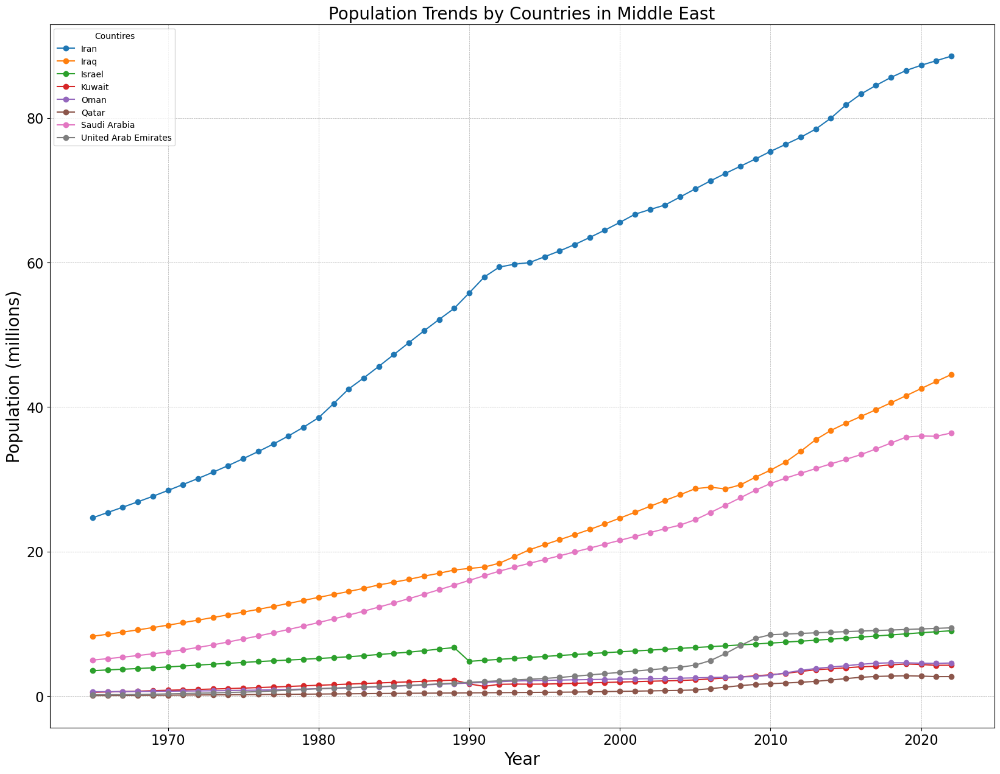

In [212]:
plt.figure(figsize=(20, 15))

# Group data by SubRegion and plot each group
for label, grp in df_Middle_East.groupby('Country'):
    plt.plot(grp['Year'], grp['pop'], marker='o', linestyle='-', label=label)

plt.title('Population Trends by Countries in Middle East',fontsize=20)
plt.xlabel('Year',fontsize=20)
plt.ylabel('Population (millions)',fontsize=20)
plt.legend(title='Countires')
# Enhancing grid visibility
plt.grid(True, which='both', linestyle='--', linewidth=0.5)

# Increase the size of the tick labels on both axes
plt.tick_params(axis='both', which='major', labelsize=16)
plt.grid(True)
plt.show()

# North America 

In [213]:
df_North_America = df[df["Region"] == "North America"]
df_North_America = df_North_America.dropna(subset=['pop'])

df_North_America.columns

Index(['Country', 'Year', 'pop', 'Region', 'SubRegion', 'OPEC', 'EU', 'OECD',
       'CIS', 'biogeo_ej', 'co2_combust_per_ej', 'coalcons_ej', 'coalprod_ej',
       'gascons_ej', 'gasprod_ej', 'hydro_ej', 'nuclear_ej', 'oilcons_ej',
       'primary_ej', 'primary_ej_pc', 'ren_power_ej', 'renewables_ej',
       'solar_ej', 'wind_ej', 'Group'],
      dtype='object')

## North America biogeo_ej

01:58:59 - cmdstanpy - INFO - Chain [1] start processing
01:58:59 - cmdstanpy - INFO - Chain [1] done processing


biogeo_ej prediction performance metrics in North America
------------------------------------------------------------
ARIMA MAE: 0.0028054216666667056
Prophet MAE: 0.034837005251820825
ARIMA MSE: 8.585880793966908e-06
Prophet MSE: 0.0013337606271603402


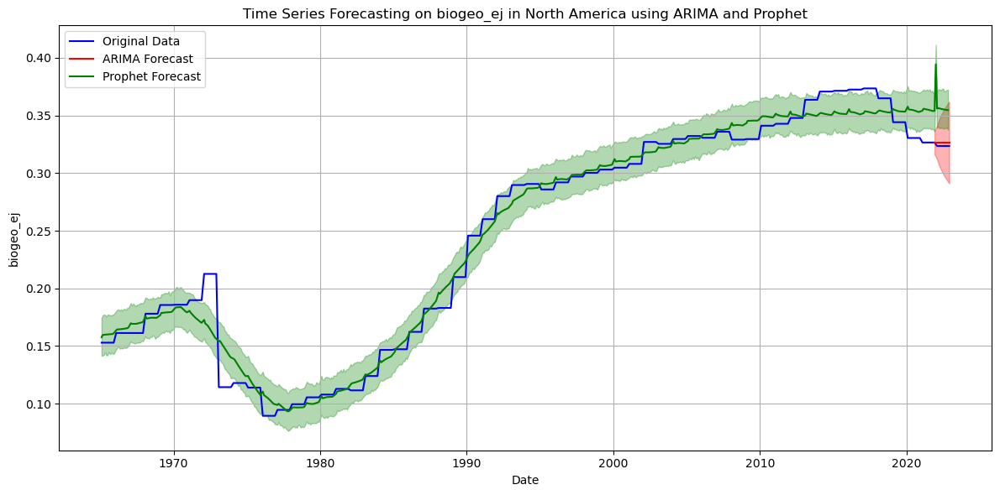

In [214]:
Prophet_Arima_prediction(df_North_America,"biogeo_ej","North America")

## North America co2_combust_per_ej

01:59:01 - cmdstanpy - INFO - Chain [1] start processing
01:59:01 - cmdstanpy - INFO - Chain [1] done processing


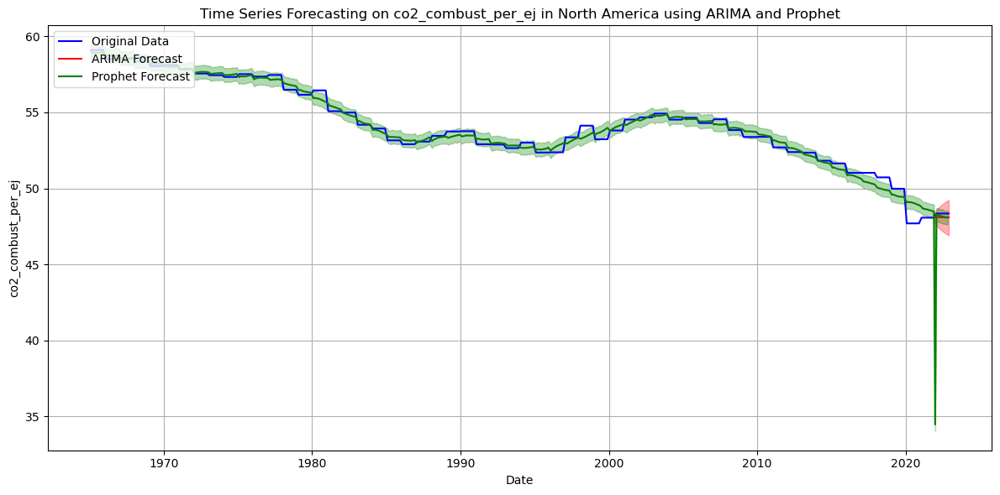

co2_combust_per_ej prediction performance metrics in North America
------------------------------------------------------------
ARIMA MAE: 0.24939849000000316
Prophet MAE: 1.3398087673438355
ARIMA MSE: 0.06785411652467092
Prophet MSE: 16.101383152672703


In [215]:
Prophet_Arima_prediction(df_North_America,"co2_combust_per_ej","North America")

## North America coalcons_ej

01:59:02 - cmdstanpy - INFO - Chain [1] start processing
01:59:02 - cmdstanpy - INFO - Chain [1] done processing


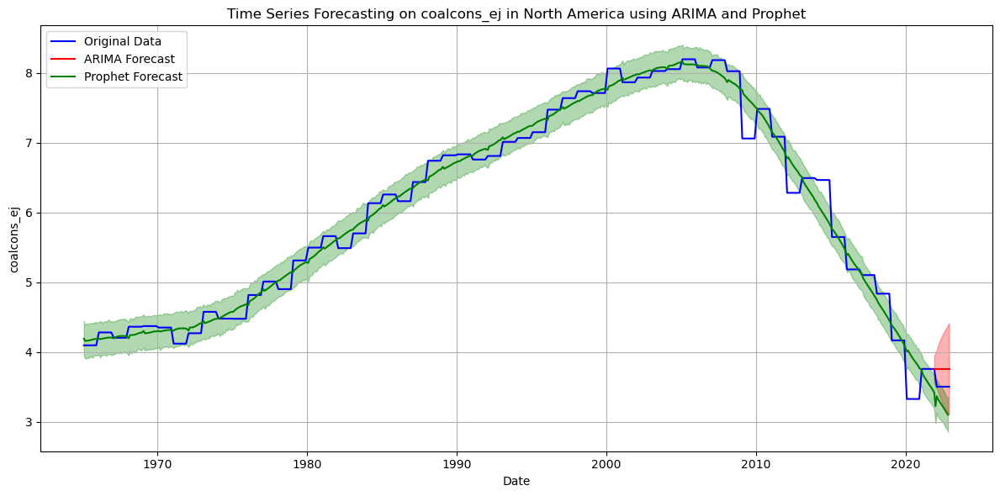

coalcons_ej prediction performance metrics in North America
------------------------------------------------------------
ARIMA MAE: 0.23312483699999995
Prophet MAE: 0.27865986524895153
ARIMA MSE: 0.05928784322866531
Prophet MSE: 0.08364473571368392


In [216]:
Prophet_Arima_prediction(df_North_America,"coalcons_ej","North America")

## North America coalprod_ej

02:00:23 - cmdstanpy - INFO - Chain [1] start processing
02:00:23 - cmdstanpy - INFO - Chain [1] done processing


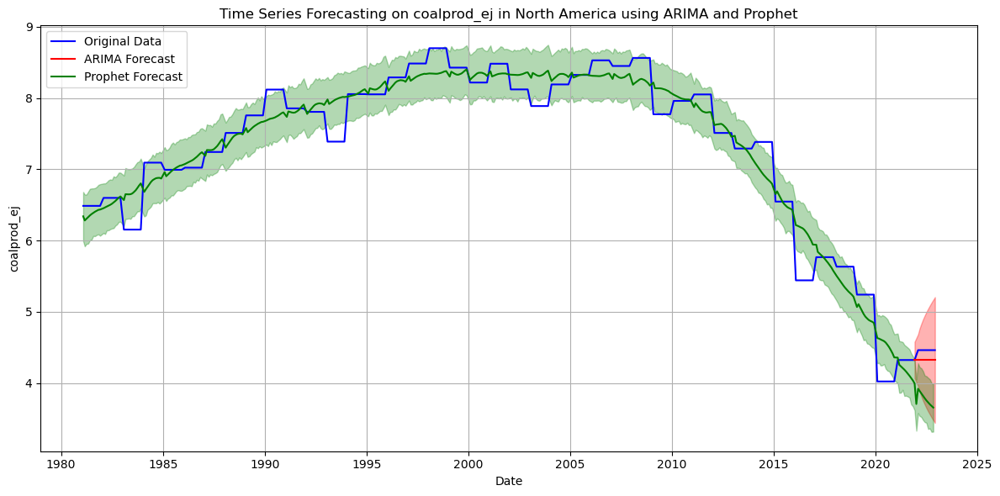

coalprod_ej prediction performance metrics in North America
------------------------------------------------------------
ARIMA MAE: 0.1269926087222221
Prophet MAE: 0.6595195805902822
ARIMA MSE: 0.01759322473099135
Prophet MSE: 0.4514562863753265


In [217]:
Prophet_Arima_prediction(df_North_America,"coalprod_ej","North America")

## North America gascons_ej

02:00:24 - cmdstanpy - INFO - Chain [1] start processing
02:00:24 - cmdstanpy - INFO - Chain [1] done processing


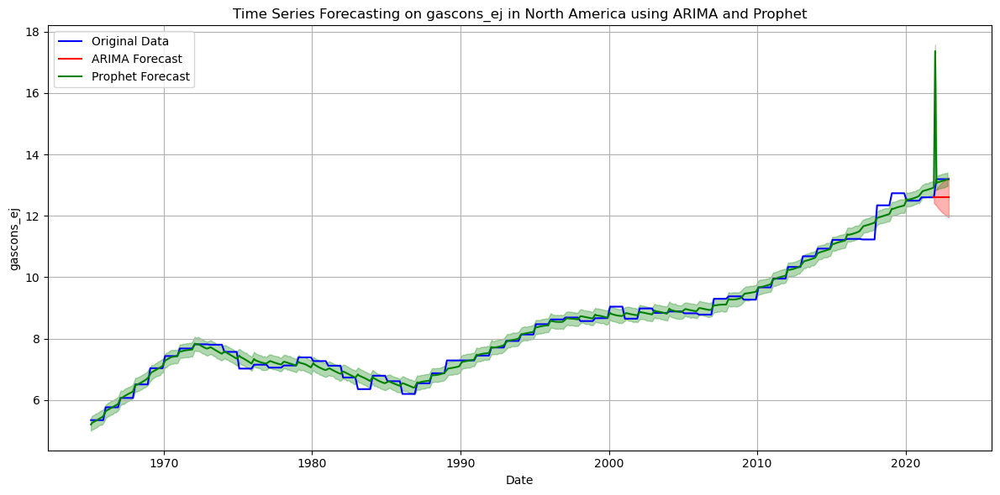

gascons_ej prediction performance metrics in North America
------------------------------------------------------------
ARIMA MAE: 0.5424870299444434
Prophet MAE: 0.4271473581785215
ARIMA MSE: 0.3210460119904838
Prophet MSE: 1.4614502262139384


In [218]:
Prophet_Arima_prediction(df_North_America,"gascons_ej","North America")

## North America gasprod_ej

02:00:26 - cmdstanpy - INFO - Chain [1] start processing
02:00:26 - cmdstanpy - INFO - Chain [1] done processing


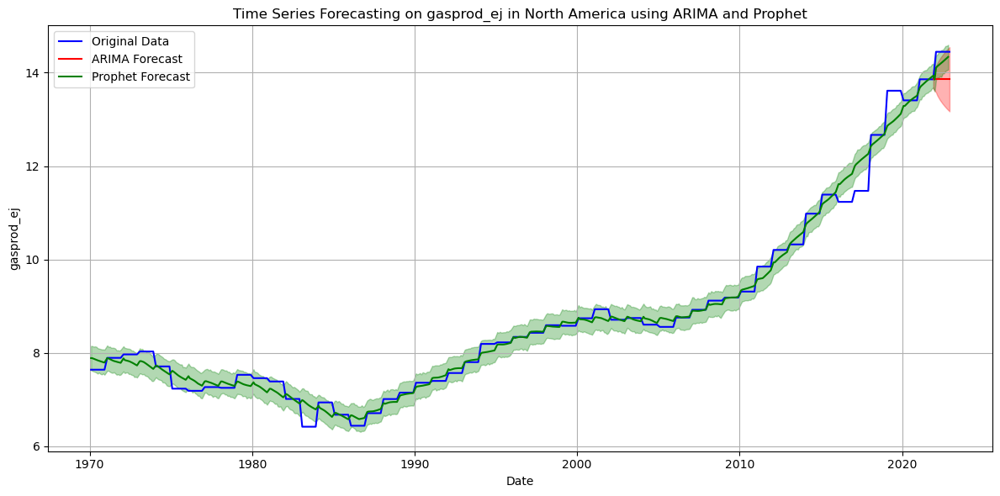

gasprod_ej prediction performance metrics in North America
------------------------------------------------------------
ARIMA MAE: 0.5396561408333319
Prophet MAE: 0.24390724240311176
ARIMA MSE: 0.3177040912790454
Prophet MSE: 0.07678817104285193


In [219]:
Prophet_Arima_prediction(df_North_America,"gasprod_ej","North America")

## North America hydro_ej

02:00:28 - cmdstanpy - INFO - Chain [1] start processing
02:00:28 - cmdstanpy - INFO - Chain [1] done processing


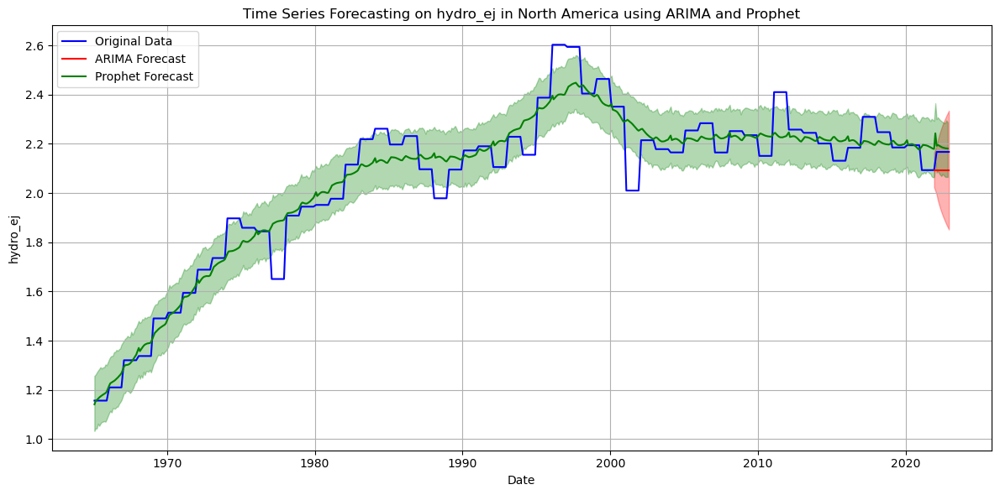

hydro_ej prediction performance metrics in North America
------------------------------------------------------------
ARIMA MAE: 0.06779547011111105
Prophet MAE: 0.030101819616894804
ARIMA MSE: 0.005014064473730785
Prophet MSE: 0.001448751795758974


In [220]:
Prophet_Arima_prediction(df_North_America,"hydro_ej","North America")

## North America nuclear_ej

02:00:29 - cmdstanpy - INFO - Chain [1] start processing
02:00:29 - cmdstanpy - INFO - Chain [1] done processing


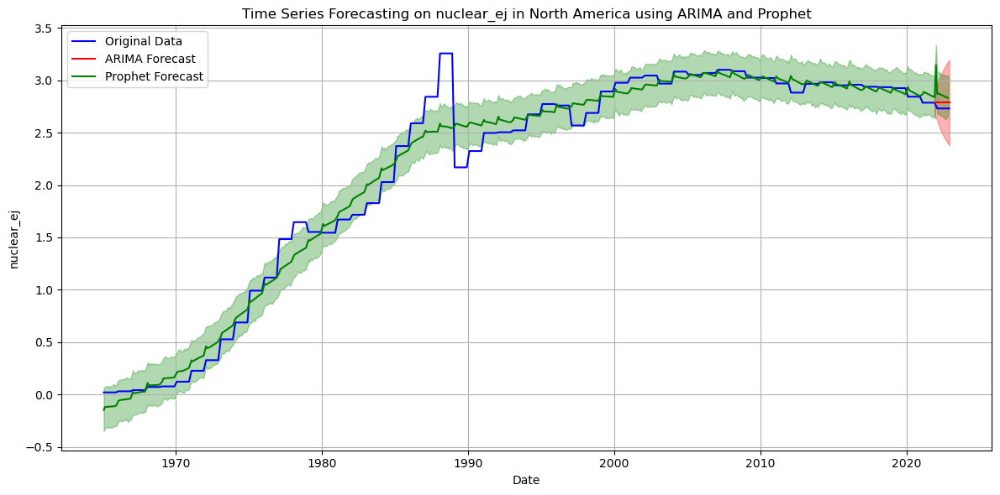

nuclear_ej prediction performance metrics in North America
------------------------------------------------------------
ARIMA MAE: 0.05045624436111137
Prophet MAE: 0.14165863968263215
ARIMA MSE: 0.002777271921848926
Prophet MSE: 0.02742577163152116


In [221]:
Prophet_Arima_prediction(df_North_America,"nuclear_ej","North America")

## North America oilcons_ej

02:00:30 - cmdstanpy - INFO - Chain [1] start processing
02:00:31 - cmdstanpy - INFO - Chain [1] done processing


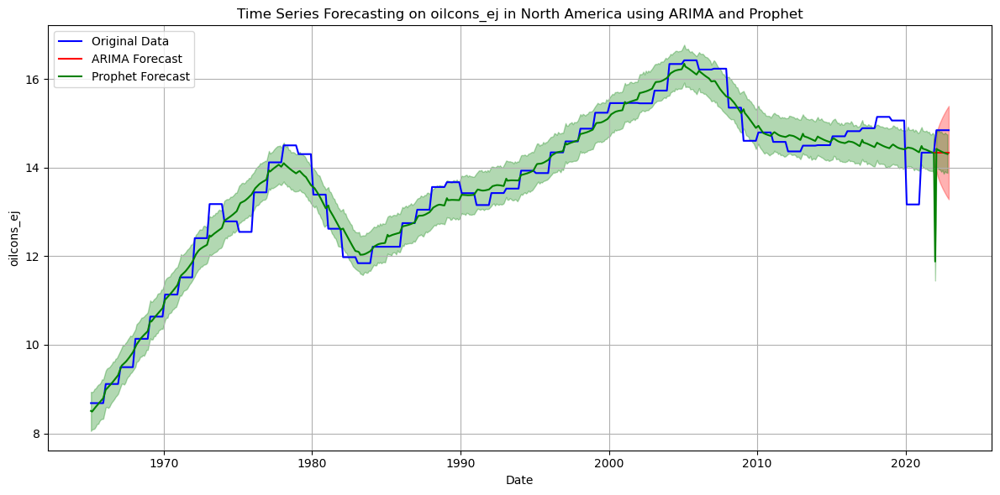

oilcons_ej prediction performance metrics in North America
------------------------------------------------------------
ARIMA MAE: 0.46412047519444233
Prophet MAE: 0.6518295993816565
ARIMA MSE: 0.2349903441760527
Prophet MSE: 0.9291822478739804


In [222]:
Prophet_Arima_prediction(df_North_America,"oilcons_ej","North America")

## North America primary_ej

02:00:32 - cmdstanpy - INFO - Chain [1] start processing
02:00:32 - cmdstanpy - INFO - Chain [1] done processing


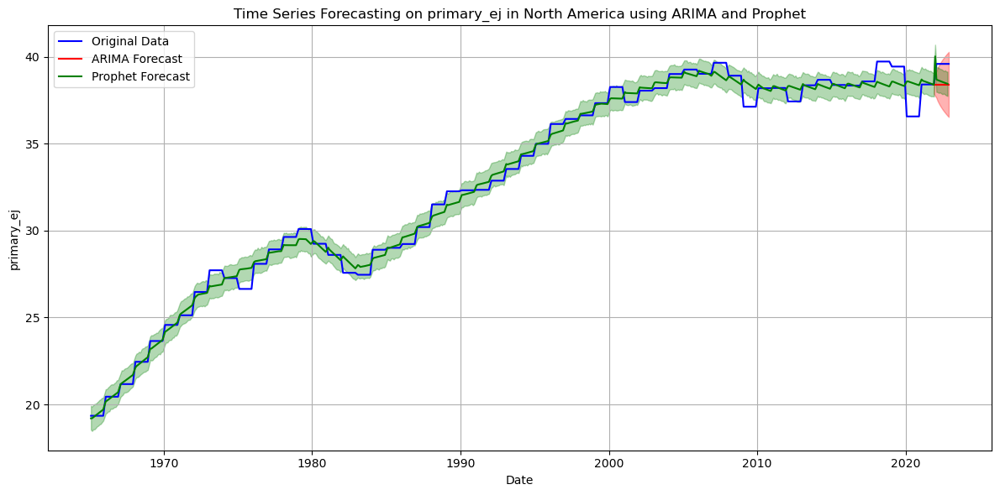

primary_ej prediction performance metrics in North America
------------------------------------------------------------
ARIMA MAE: 1.084644121916666
Prophet MAE: 0.8900158879458727
ARIMA MSE: 1.283403132227319
Prophet MSE: 0.8935687824791483


In [223]:
Prophet_Arima_prediction(df_North_America,"primary_ej","North America")

## North America primary_ej_pc

02:00:33 - cmdstanpy - INFO - Chain [1] start processing
02:00:33 - cmdstanpy - INFO - Chain [1] done processing


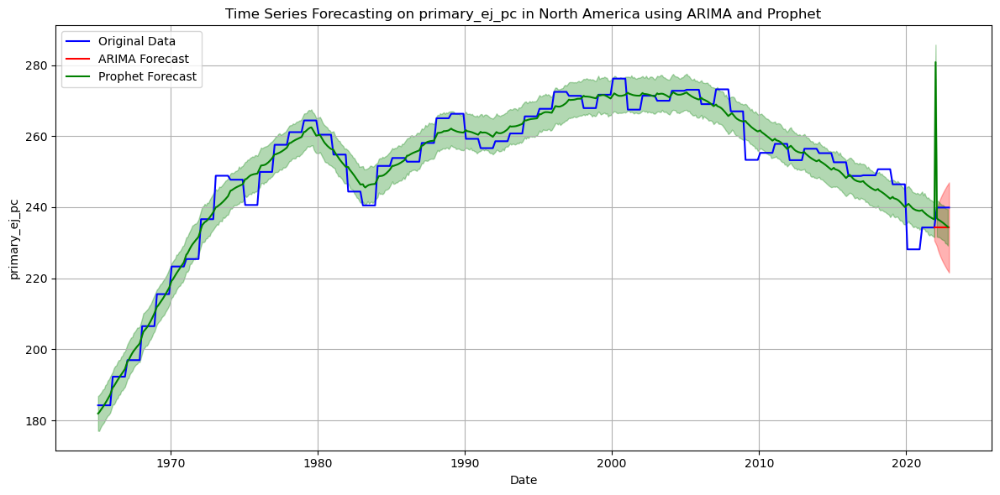

primary_ej_pc prediction performance metrics in North America
------------------------------------------------------------
ARIMA MAE: 5.148985502222203
Prophet MAE: 7.0941031618867525
ARIMA MSE: 28.922238220466657
Prophet MSE: 155.22292321866286


In [224]:
Prophet_Arima_prediction(df_North_America,"primary_ej_pc","North America")

## North America ren_power_ej

02:00:34 - cmdstanpy - INFO - Chain [1] start processing
02:00:35 - cmdstanpy - INFO - Chain [1] done processing


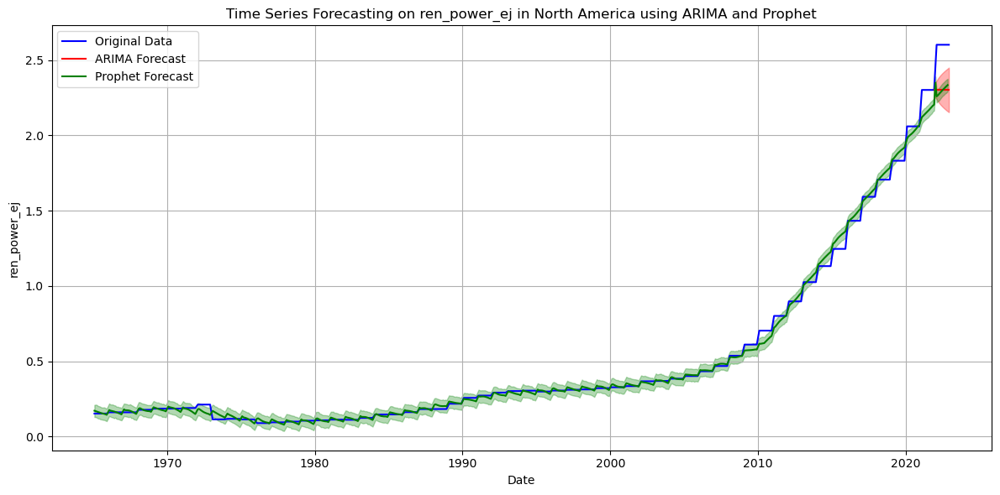

ren_power_ej prediction performance metrics in North America
------------------------------------------------------------
ARIMA MAE: 0.27511566011111105
Prophet MAE: 0.2835620840225008
ARIMA MSE: 0.08256941066004257
Prophet MSE: 0.08426166953428356


In [225]:
Prophet_Arima_prediction(df_North_America,"ren_power_ej","North America")

## North America renewables_ej

02:00:36 - cmdstanpy - INFO - Chain [1] start processing
02:00:36 - cmdstanpy - INFO - Chain [1] done processing


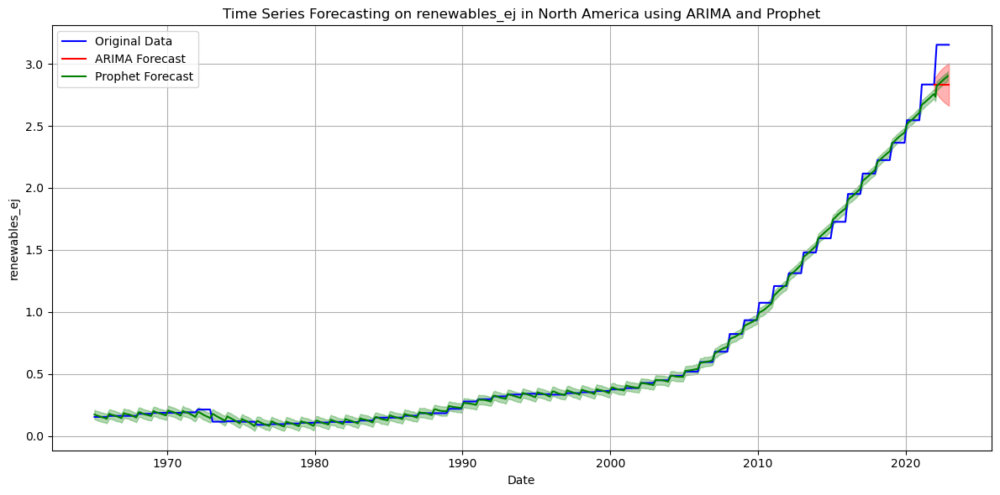

renewables_ej prediction performance metrics in North America
------------------------------------------------------------
ARIMA MAE: 0.2938222335277777
Prophet MAE: 0.28518209320630367
ARIMA MSE: 0.0941798235439112
Prophet MSE: 0.08705898611577151


In [226]:
Prophet_Arima_prediction(df_North_America,"renewables_ej","North America")

## North America solar_ej

02:00:37 - cmdstanpy - INFO - Chain [1] start processing
02:00:37 - cmdstanpy - INFO - Chain [1] done processing


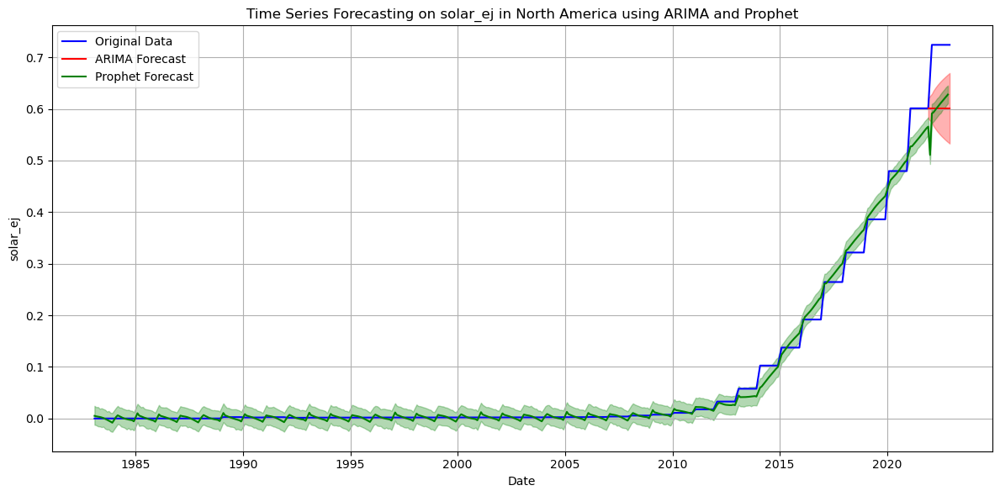

solar_ej prediction performance metrics in North America
------------------------------------------------------------
ARIMA MAE: 0.11274611608333336
Prophet MAE: 0.11667659683036473
ARIMA MSE: 0.013867294572956164
Prophet MSE: 0.01506445643337017


In [227]:
Prophet_Arima_prediction(df_North_America,"solar_ej","North America")

## North America wind_ej

02:00:38 - cmdstanpy - INFO - Chain [1] start processing
02:00:39 - cmdstanpy - INFO - Chain [1] done processing


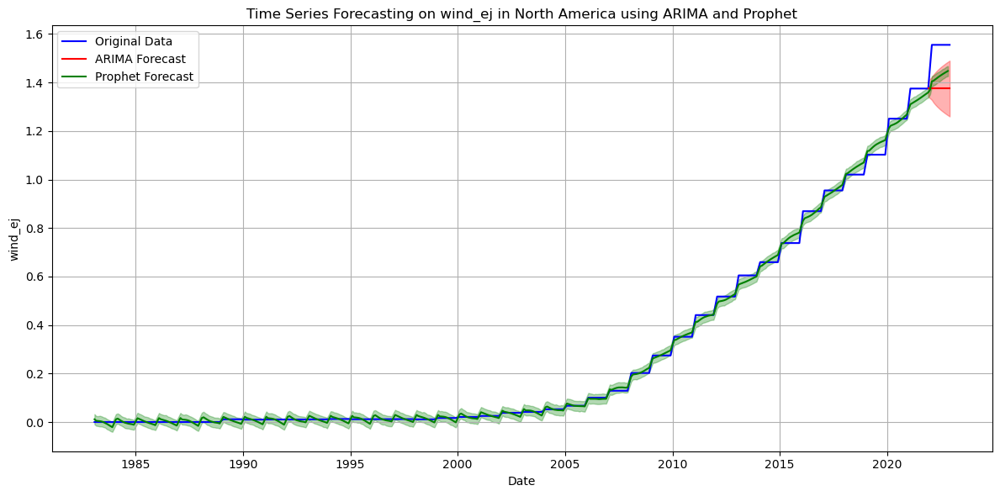

wind_ej prediction performance metrics in North America
------------------------------------------------------------
ARIMA MAE: 0.1651749152777777
Prophet MAE: 0.12443604193279745
ARIMA MSE: 0.029763002876750225
Prophet MSE: 0.016964857510624282


In [228]:
Prophet_Arima_prediction(df_North_America,"wind_ej","North America")

## Population Trend in North America

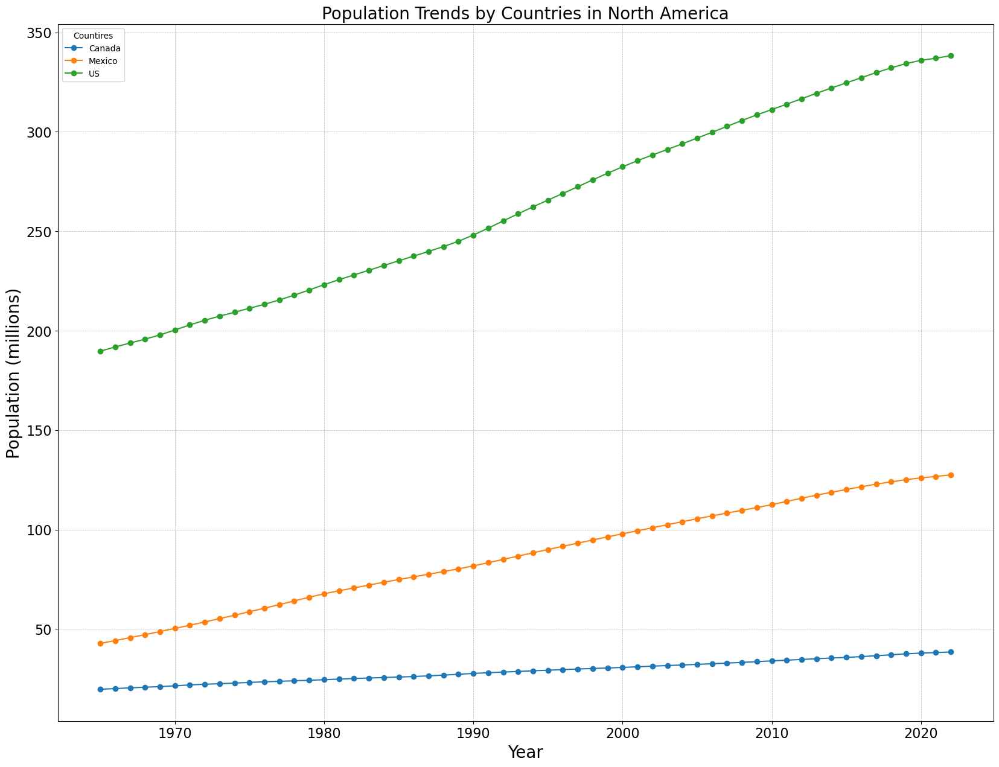

In [229]:
plt.figure(figsize=(20, 15))

# Group data by SubRegion and plot each group
for label, grp in df_North_America.groupby('Country'):
    plt.plot(grp['Year'], grp['pop'], marker='o', linestyle='-', label=label)

plt.title('Population Trends by Countries in North America',fontsize=20)
plt.xlabel('Year',fontsize=20)
plt.ylabel('Population (millions)',fontsize=20)
plt.legend(title='Countires')
# Enhancing grid visibility
plt.grid(True, which='both', linestyle='--', linewidth=0.5)

# Increase the size of the tick labels on both axes
plt.tick_params(axis='both', which='major', labelsize=16)
plt.grid(True)
plt.show()

# Europe

In [230]:
df_Europe = df[df["Region"] == "Europe"]
df_Europe = df_Europe.dropna(subset=['pop'])

df_Europe.columns

Index(['Country', 'Year', 'pop', 'Region', 'SubRegion', 'OPEC', 'EU', 'OECD',
       'CIS', 'biogeo_ej', 'co2_combust_per_ej', 'coalcons_ej', 'coalprod_ej',
       'gascons_ej', 'gasprod_ej', 'hydro_ej', 'nuclear_ej', 'oilcons_ej',
       'primary_ej', 'primary_ej_pc', 'ren_power_ej', 'renewables_ej',
       'solar_ej', 'wind_ej', 'Group'],
      dtype='object')

## Europe biogeo_ej

02:00:40 - cmdstanpy - INFO - Chain [1] start processing
02:00:40 - cmdstanpy - INFO - Chain [1] done processing


biogeo_ej prediction performance metrics in Europe
------------------------------------------------------------
ARIMA MAE: 0.0014848879999999887
Prophet MAE: 0.004993554668666943
ARIMA MSE: 2.4053371336843272e-06
Prophet MSE: 2.6692580836315864e-05


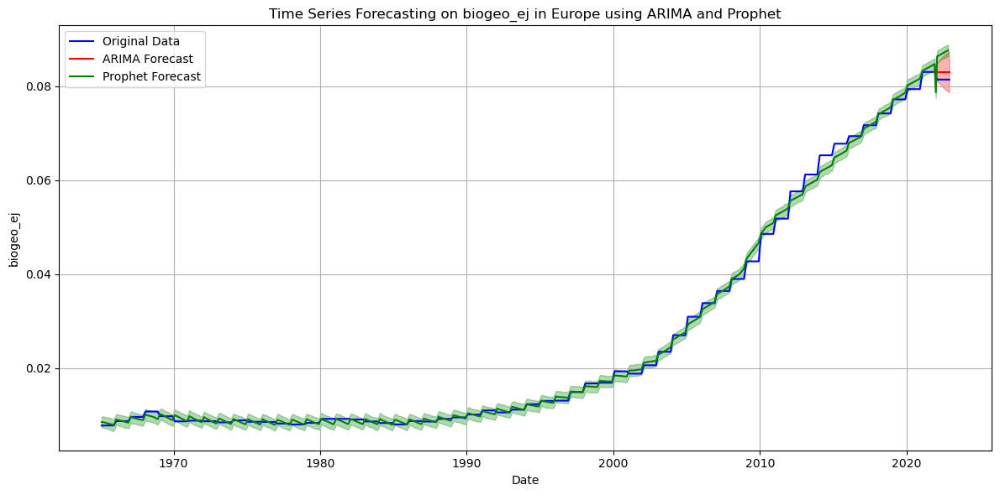

In [231]:
Prophet_Arima_prediction(df_Europe,"biogeo_ej","Europe")

## Europe co2_combust_per_ej

02:00:42 - cmdstanpy - INFO - Chain [1] start processing
02:00:42 - cmdstanpy - INFO - Chain [1] done processing


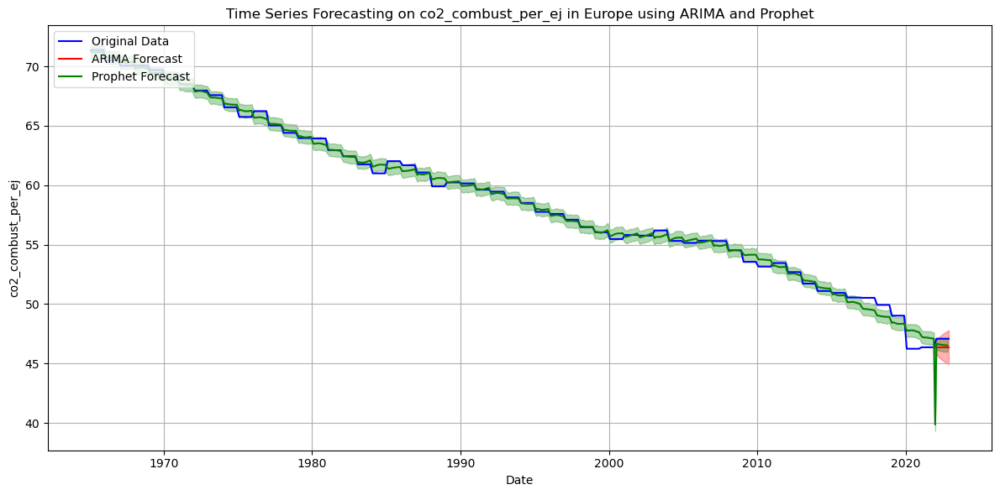

co2_combust_per_ej prediction performance metrics in Europe
------------------------------------------------------------
ARIMA MAE: 0.6595493529166708
Prophet MAE: 1.0842207814220248
ARIMA MSE: 0.4745512897448719
Prophet MSE: 4.610670724266492


In [232]:
Prophet_Arima_prediction(df_Europe,"co2_combust_per_ej","Europe")

## Europe coalcons_ej

02:00:43 - cmdstanpy - INFO - Chain [1] start processing
02:00:43 - cmdstanpy - INFO - Chain [1] done processing


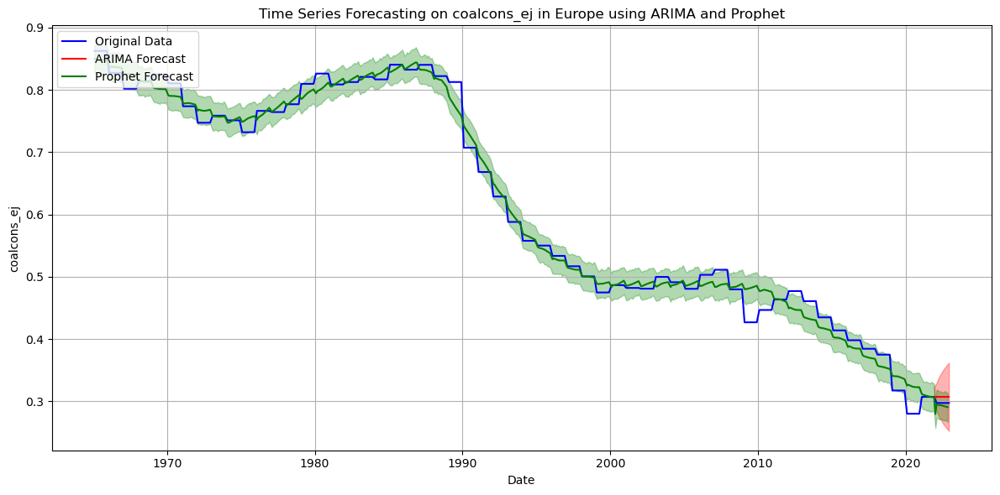

coalcons_ej prediction performance metrics in Europe
------------------------------------------------------------
ARIMA MAE: 0.008967100369791639
Prophet MAE: 0.00515063368117336
ARIMA MSE: 8.7718788045728e-05
Prophet MSE: 4.397737264132368e-05


In [233]:
Prophet_Arima_prediction(df_Europe,"coalcons_ej","Europe")

## Europe coalprod_ej

02:00:44 - cmdstanpy - INFO - Chain [1] start processing
02:00:44 - cmdstanpy - INFO - Chain [1] done processing


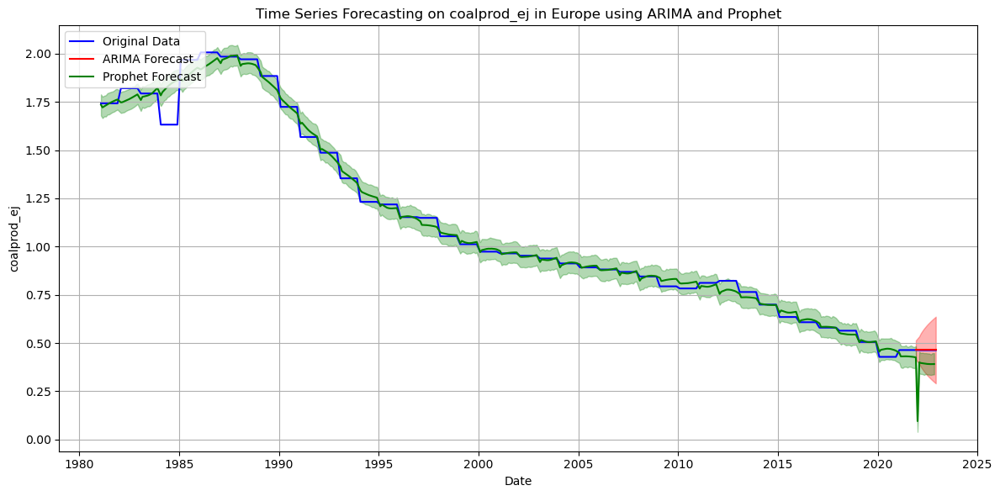

coalprod_ej prediction performance metrics in Europe
------------------------------------------------------------
ARIMA MAE: 0.0009518313333332732
Prophet MAE: 0.09155719038986139
ARIMA MSE: 9.883449677618143e-07
Prophet MSE: 0.015384722605472747


In [234]:
Prophet_Arima_prediction(df_Europe,"coalprod_ej","Europe")

## Europe gascons_ej

02:00:45 - cmdstanpy - INFO - Chain [1] start processing
02:00:45 - cmdstanpy - INFO - Chain [1] done processing


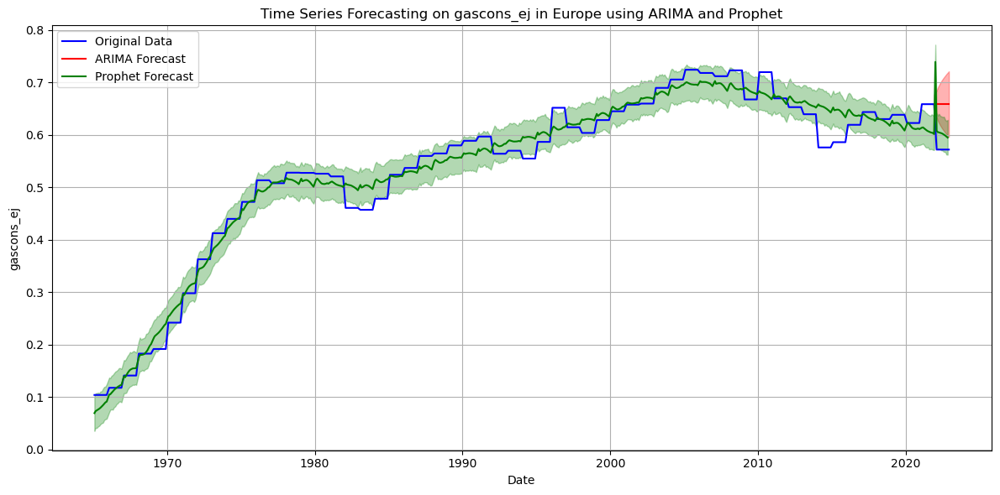

gascons_ej prediction performance metrics in Europe
------------------------------------------------------------
ARIMA MAE: 0.07938829297311838
Prophet MAE: 0.04356417617461172
ARIMA MSE: 0.006875455703111647
Prophet MSE: 0.003355489335013988


In [235]:
Prophet_Arima_prediction(df_Europe,"gascons_ej","Europe")

## Europe gasprod_ej

02:00:46 - cmdstanpy - INFO - Chain [1] start processing
02:00:46 - cmdstanpy - INFO - Chain [1] done processing


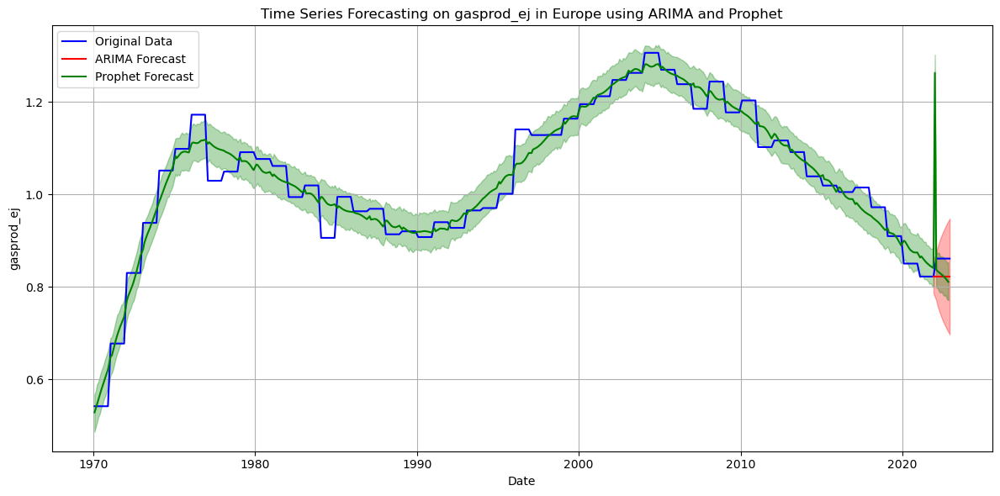

gasprod_ej prediction performance metrics in Europe
------------------------------------------------------------
ARIMA MAE: 0.035605671851851865
Prophet MAE: 0.06522789705024001
ARIMA MSE: 0.0013830151287510068
Prophet MSE: 0.014624523670610595


In [236]:
Prophet_Arima_prediction(df_Europe,"gasprod_ej","Europe")

## Europe hydro_ej

02:00:47 - cmdstanpy - INFO - Chain [1] start processing
02:00:47 - cmdstanpy - INFO - Chain [1] done processing


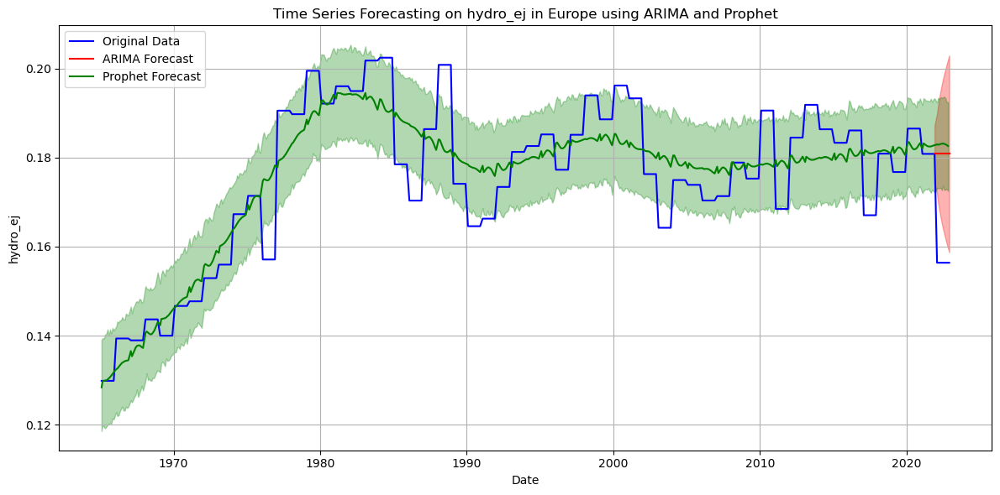

hydro_ej prediction performance metrics in Europe
------------------------------------------------------------
ARIMA MAE: 0.02240025963541666
Prophet MAE: 0.024508437364237287
ARIMA MSE: 0.000547387234618993
Prophet MSE: 0.0006468286094798355


In [237]:
Prophet_Arima_prediction(df_Europe,"hydro_ej","Europe")

## Europe nuclear_ej

02:00:48 - cmdstanpy - INFO - Chain [1] start processing
02:00:49 - cmdstanpy - INFO - Chain [1] done processing


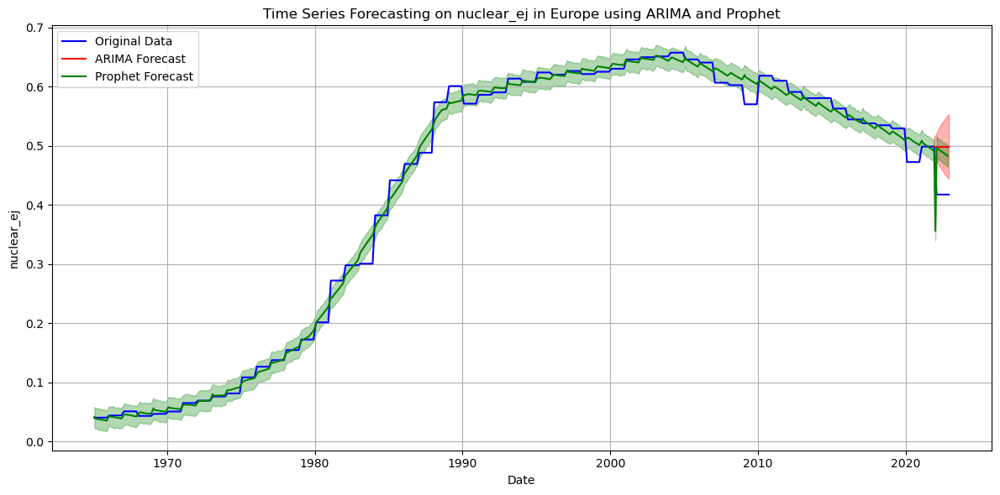

nuclear_ej prediction performance metrics in Europe
------------------------------------------------------------
ARIMA MAE: 0.07434911206249997
Prophet MAE: 0.06601526817441027
ARIMA MSE: 0.006030316870344194
Prophet MSE: 0.004696062458147872


In [238]:
Prophet_Arima_prediction(df_Europe,"nuclear_ej","Europe")

## Europe oilcons_ej

02:00:50 - cmdstanpy - INFO - Chain [1] start processing
02:00:50 - cmdstanpy - INFO - Chain [1] done processing


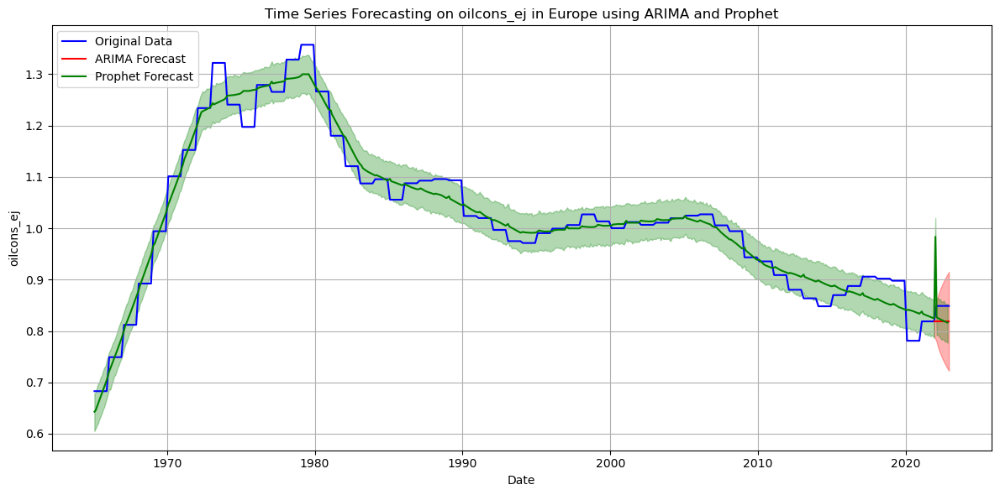

oilcons_ej prediction performance metrics in Europe
------------------------------------------------------------
ARIMA MAE: 0.027530795333333486
Prophet MAE: 0.034701846004359736
ARIMA MSE: 0.000826848754566433
Prophet MSE: 0.002155817630202857


In [239]:
Prophet_Arima_prediction(df_Europe,"oilcons_ej","Europe")

## Europe primary_ej

02:00:51 - cmdstanpy - INFO - Chain [1] start processing
02:00:51 - cmdstanpy - INFO - Chain [1] done processing


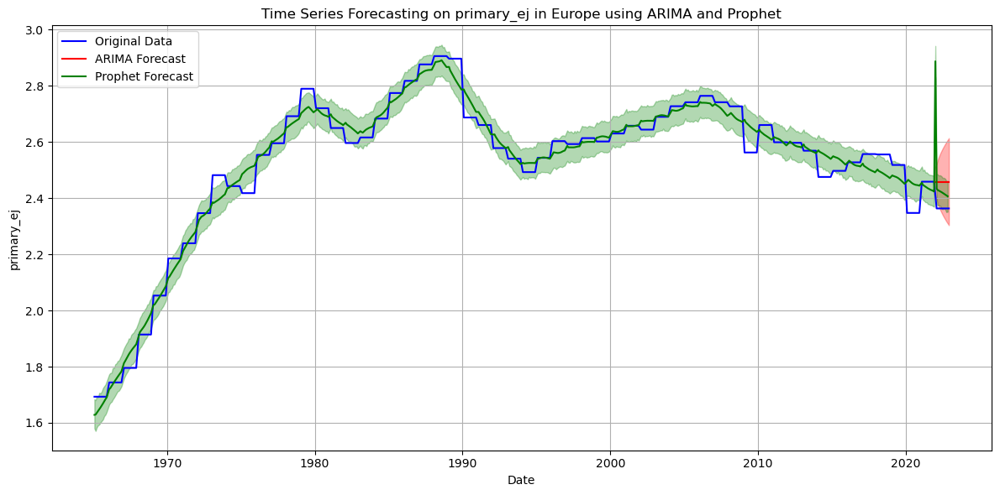

primary_ej prediction performance metrics in Europe
------------------------------------------------------------
ARIMA MAE: 0.0872390098333334
Prophet MAE: 0.09362447996904251
ARIMA MSE: 0.008302521640036848
Prophet MSE: 0.025664745140211817


In [240]:
Prophet_Arima_prediction(df_Europe,"primary_ej","Europe")

## Europe primary_ej_pc

02:00:52 - cmdstanpy - INFO - Chain [1] start processing
02:00:52 - cmdstanpy - INFO - Chain [1] done processing


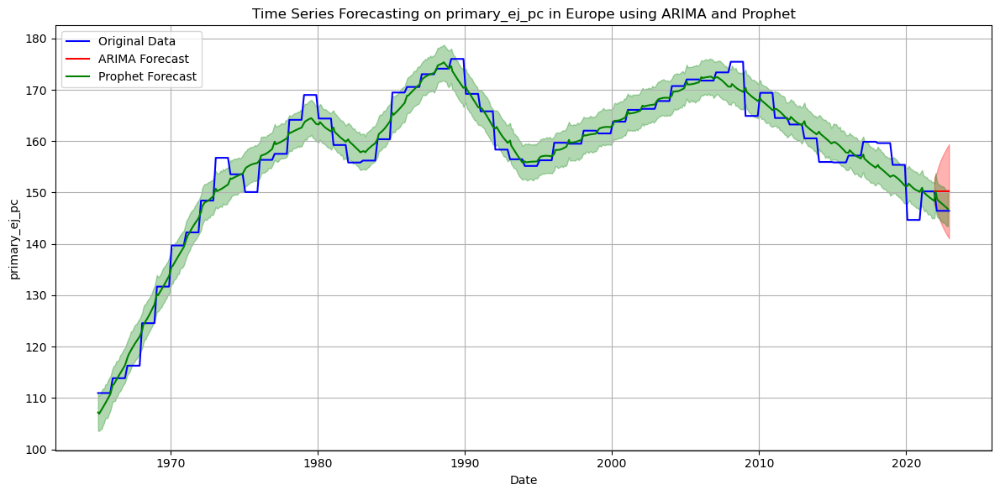

primary_ej_pc prediction performance metrics in Europe
------------------------------------------------------------
ARIMA MAE: 3.477229573888875
Prophet MAE: 1.5995237686506794
ARIMA MSE: 13.19031873766626
Prophet MSE: 3.3814340236216514


In [241]:
Prophet_Arima_prediction(df_Europe,"primary_ej_pc","Europe")

## Europe ren_power_ej

02:00:53 - cmdstanpy - INFO - Chain [1] start processing
02:00:53 - cmdstanpy - INFO - Chain [1] done processing


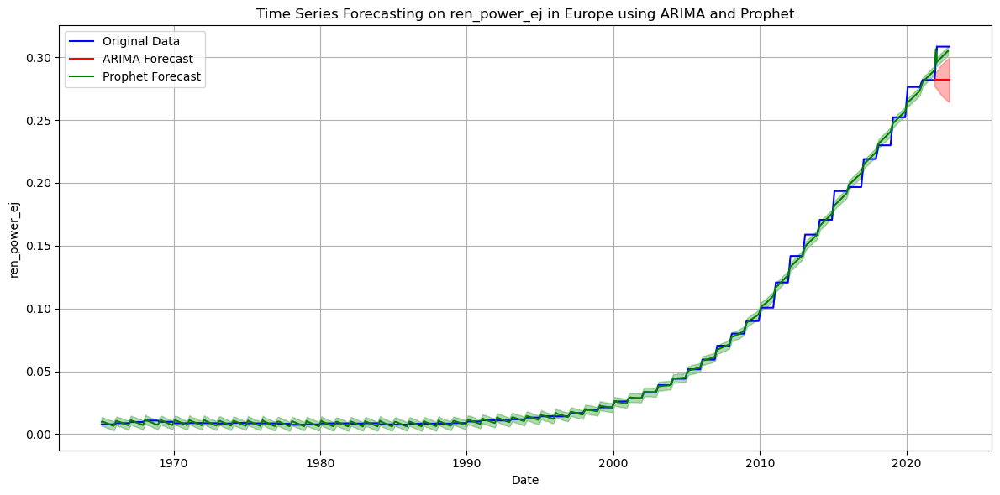

ren_power_ej prediction performance metrics in Europe
------------------------------------------------------------
ARIMA MAE: 0.02433934169444441
Prophet MAE: 0.007220579395808858
ARIMA MSE: 0.0006462584226751856
Prophet MSE: 6.09293391285454e-05


In [242]:
Prophet_Arima_prediction(df_Europe,"ren_power_ej","Europe")

## Europe renewables_ej

02:00:54 - cmdstanpy - INFO - Chain [1] start processing
02:00:54 - cmdstanpy - INFO - Chain [1] done processing


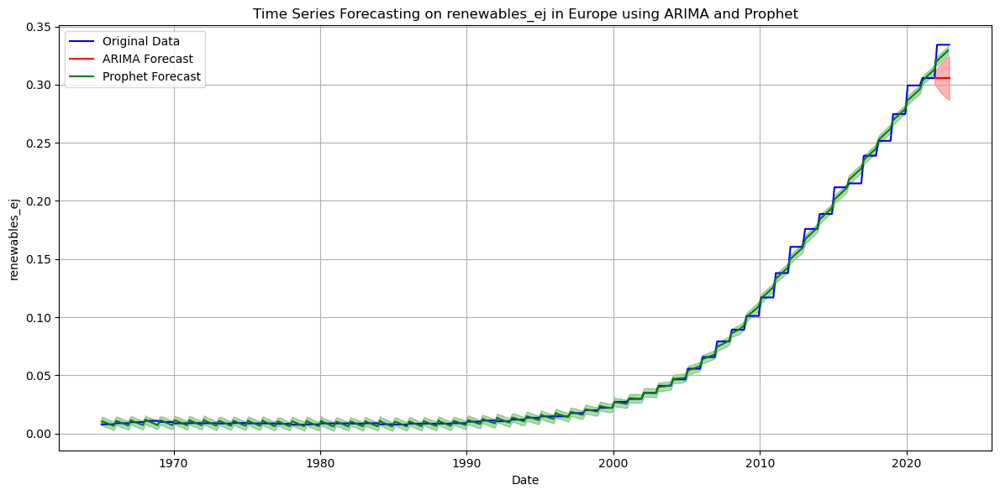

renewables_ej prediction performance metrics in Europe
------------------------------------------------------------
ARIMA MAE: 0.02627196433333331
Prophet MAE: 0.009559815221172182
ARIMA MSE: 0.0007529630290166591
Prophet MSE: 9.915142537018652e-05


In [243]:
Prophet_Arima_prediction(df_Europe,"renewables_ej","Europe")

## Europe solar_ej

02:00:55 - cmdstanpy - INFO - Chain [1] start processing
02:00:55 - cmdstanpy - INFO - Chain [1] done processing


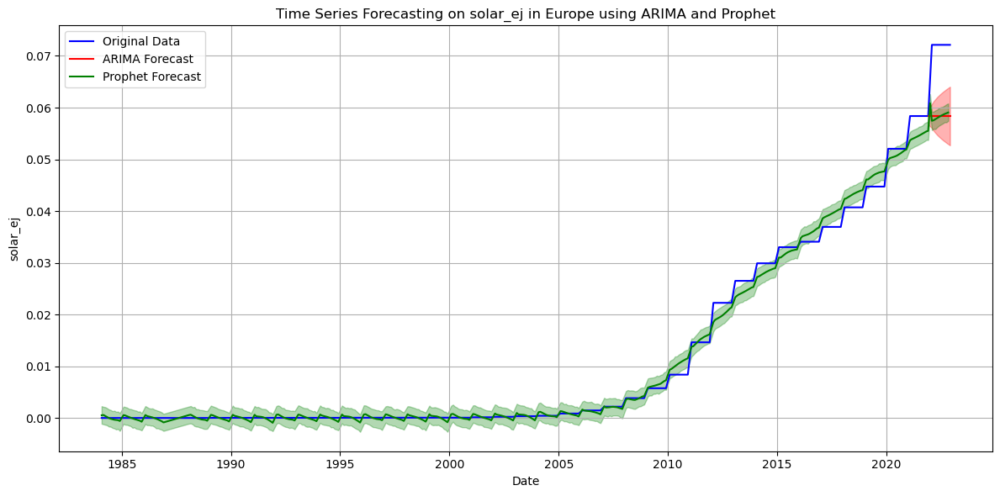

solar_ej prediction performance metrics in Europe
------------------------------------------------------------
ARIMA MAE: 0.012612806207031244
Prophet MAE: 0.01273033182458584
ARIMA MSE: 0.00017354496045395558
Prophet MSE: 0.00017166041281193166


In [244]:
Prophet_Arima_prediction(df_Europe,"solar_ej","Europe")

## Europe wind_ej

02:00:56 - cmdstanpy - INFO - Chain [1] start processing
02:00:56 - cmdstanpy - INFO - Chain [1] done processing


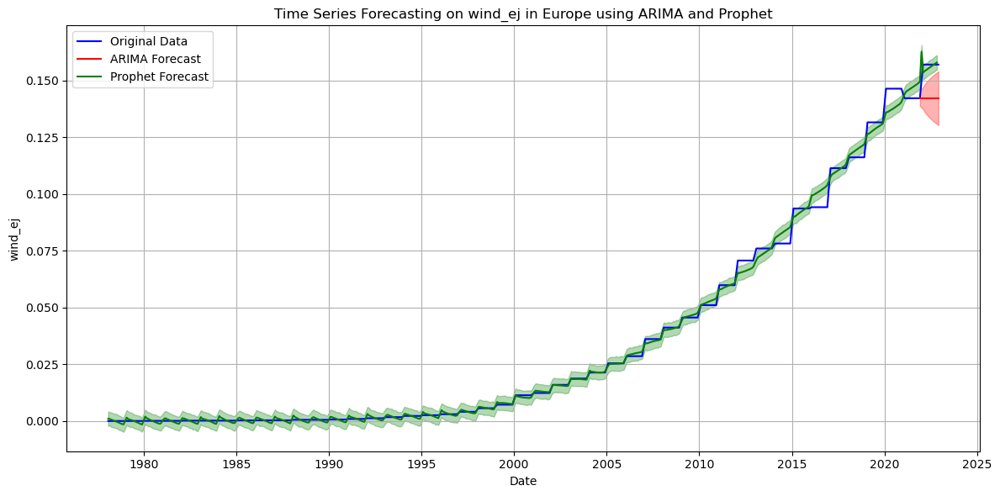

wind_ej prediction performance metrics in Europe
------------------------------------------------------------
ARIMA MAE: 0.013593628822222212
Prophet MAE: 0.0023430437322040803
ARIMA MSE: 0.00020158553951601867
Prophet MSE: 1.0081889646252655e-05


In [245]:
Prophet_Arima_prediction(df_Europe,"wind_ej","Europe")

## Population Trend in North America

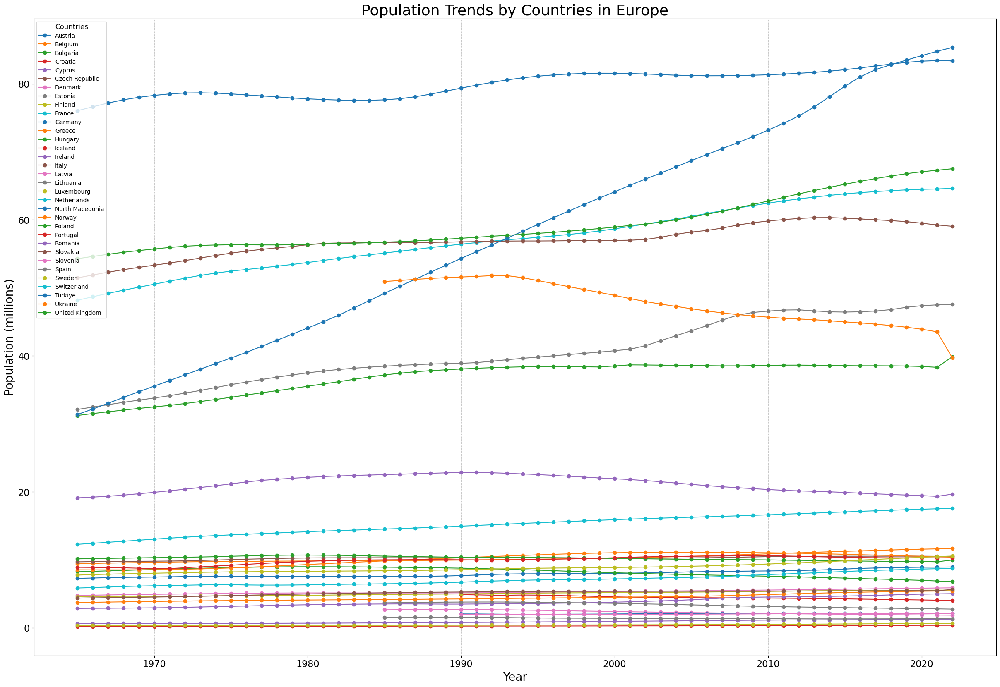

In [246]:
plt.figure(figsize=(30, 20))

# Group data by Country and plot each group
for label, grp in df_Europe.groupby('Country'):
    plt.plot(grp['Year'], grp['pop'], marker='o', linestyle='-', label=label)

# Adding title with larger font
plt.title('Population Trends by Countries in Europe', fontsize=26)

# Setting up larger x and y labels
plt.xlabel('Year', fontsize=20)
plt.ylabel('Population (millions)', fontsize=20)

# Adjusting the legend to show with a larger title font
plt.legend(title='Countries', title_fontsize='large', fontsize='medium')

# Enhancing grid visibility
plt.grid(True, which='both', linestyle='--', linewidth=0.5)

# Increase the size of the tick labels on both axes
plt.tick_params(axis='both', which='major', labelsize=16)

# Showing the plot
plt.show()